In [2]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import json
import os
import errno
from IPython.display import display, HTML
import subprocess
#import pdfkit as pdf

#HTML(df.to_html())
#display(df)

hpi_red = '#b00639'
hpi_blue = '#007a9e'

def create_folder(filename):
    if not os.path.exists(os.path.dirname(filename)):
        try:
            os.makedirs(os.path.dirname(filename))
        except OSError as exc: # Guard against race condition
            if exc.errno != errno.EEXIST:
                raise
                
def save_plot(filename):
    filename = filename.replace(" ", "_").replace(":", "_").replace(".", "_") \
                       .replace(",", "_").replace("\n", "_").replace("__", "_")
    create_folder("plots/selectivity_estimation/")
    #plt.savefig('plots/selectivity_estimation/{}.pgf'.format(filename), bbox_inches='tight', pad_inches=0.0)
    plt.savefig('plots/selectivity_estimation/{}.pdf'.format(filename), bbox_inches='tight', pad_inches=0.0)
    
def data_frame_to_tex(df, filename):
    create_folder(filename)
    with open(filename, 'w') as f:
        f.write(df.to_latex())

def get_column_names(benchmark): 
    file = 'results/' + benchmark + '_results.csv.json'
    table_info = json.load(open(file,'r'))
    #print(json.dumps(table_info, indent=2, sort_keys=False))
    column_names = []
    for column in table_info["columns"]:
        column_names.append(column["name"])
    return column_names

def get_results(benchmark):
    file = 'results/' + benchmark + '_results.csv'
    return pd.read_csv(file, header=None, names=get_column_names(benchmark))

def percent(x, pos):
    'The two args are the value and tick position'
    return ('%i' % (x * 100)) + "%"

# Columns: sample_size, row_count, distinct_values, data, estimation_technique, error, occurrences 
def select(data, data_name, row_count, distinct_values, estimation_tec):
    return data[(data.row_count == row_count) &
                (data.distinct_values == distinct_values) &
                (data.data_name == data_name) & 
                (data.estimation_technique == estimation_tec)]

def get_mean_squared_error(errors, probabilities):
    mse = 0.0
    for i in range(0, len(errors)):
        error = errors.iloc[i]
        probability = probabilities.iloc[i]
        mse += probability * error * error
        
    return mse

def get_mean_error(errors, probabilities):
    me = 0.0
    for i in range(0, len(errors)):
        error = errors.iloc[i]
        probability = probabilities.iloc[i]
        me += probability * abs(error)
        #print("error: " + str(error) + ", probability: " + str(probability))
        
    return me

def estimation_evaluation(data_name, row_count, distinct_values, estimation_tec):
    is_filter = estimation_tec.split("_")[0] == "filter"
    
    #Prepare the data
    data = get_results("estimation")
    selection = select(data, data_name, row_count, distinct_values, estimation_tec)
    if len(selection) == 0:
        return
    sample_size = selection["sample_size"].iloc[0]
    errors = selection["error"]
    probabilities = selection["occurrences"].apply(lambda x: x / sample_size)
    biggest_error = max(max(errors), 0)
    lowest_error = min(min(errors), 0)
    x_data = range(lowest_error, biggest_error + 1)
    y_data = np.zeros(biggest_error - lowest_error + 1)
    for i in range(0, len(errors)):
        y_data[errors.iloc[i] - lowest_error] = probabilities.iloc[i]     
    mean_error = get_mean_error(errors, probabilities)
    mean_square_error = get_mean_squared_error(errors, probabilities)
    column_size = row_count * 2
    
    # Print some Information
    print("Estimation Technique: " + estimation_tec)
    print("Sample Size: " + str(sample_size))
    #print("One off error probability: " + str(one_off_probability))
    print("Mean Error: " + str(mean_error))
    print("Mean Squared Error: " + str(mean_square_error))
    #print("Correct " + str(correct_probability * 100) + "%" + " of the time")
    #print("Filter Size [kB]: " + str(filter_size_bytes / 1000))
    #print("Bits per Value: " + str(bits_per_value))
    print("Column Size [kB](uint16_t): "  + str(column_size / 1000))
    print("")
    
    # Configure the plot
    title = "Misestimation Probabilities"
    #subtitle = "Value Count: {:,}, Distinct Values: {:,}, Data: {},\n{}".format(
    #    row_count, distinct_values, data_name, estimation_tec_description(estimation_tec))
    subtitle = "{:,} Rows, {:,} Distinct Values".format(row_count, distinct_values)
    plt.rc('xtick', labelsize=12)
    plt.rc('ytick', labelsize=12)
    fig, ax = plt.subplots()
    plt.title(subtitle)
    #plt.title(title + '\n' + subtitle)
    #.apply(lambda x: x * 100)
    if is_filter:
        plot_values = np.array(y_data[1:]) * 100
        plt.plot(x_data[1:], plot_values, color=hpi_red, label="estimated counts")
        ax.set_xlim(xmin=1, xmax=50)
        ax.set_ylim(ymin=0, ymax=max(plot_values)*1.2)
    else:
        plot_values = np.array(y_data) * 100
        plt.plot(x_data, plot_values, color=hpi_red, label="estimated counts")
        ax.set_xlim(xmin=-30, xmax=30)
        ax.set_ylim(ymin=0, ymax=max(plot_values)*1.2)
    plt.ylabel('Relative Frequency [%]')
    plt.xlabel('Estimation Error')
    ax.yaxis.grid()
    ax.xaxis.grid()
    
    # Save Output
    filename = "estimation_errors_" + data_name + "_" + str(row_count) + "_" + str(distinct_values) + "_" + estimation_tec
    save_plot(filename)
    plt.show()
    
def value_distribution(data, data_name, row_count, distinct_values):
    selection = select(data, data_name, row_count, distinct_values, "uniform")
    if len(selection) == 0:
        return
    
    title = "Value Frequency Distribution"
    subtitle = "{:,} Rows, {:,} Distinct Values".format(row_count, distinct_values)
    
    plt.rc('xtick', labelsize=12)
    plt.rc('ytick', labelsize=12)
    plt.rc('axes', labelsize=12)
    plt.rc('axes', titlesize=12)
    fig, ax = plt.subplots()
    plt.title(subtitle)
    plt.plot(selection["value"], selection["actual_count"], color=hpi_blue, label="Actual Counts")
    plt.ylabel('Value Count')
    plt.xlabel('Value ID')
    ax.set_ylim(ymin=0)
    ax.set_xlim(xmin=0)
    ax.set_xlim(xmax=distinct_values)
    filename = "value_distribution_" + data_name + "_" + str(row_count) + "_" + str(distinct_values)
    save_plot(filename)
    plt.show()

def estimation_example(data, data_name, row_count, distinct_values, estimation_tec):
    selection = select(data, data_name, row_count, distinct_values, estimation_tec)
    if len(selection) == 0:
        return
    
    title = "Estimated Counts Vs. Actual Counts"
    #subtitle = "Value Count: {:,}, Distinct Values: {:,}, Data: {},\n{}".format(
    #    row_count, distinct_values, data_name, estimation_tec_description(estimation_tec))
    subtitle = "{:,} Rows, {:,} Distinct Values".format(row_count, distinct_values)
    
    plt.rc('xtick', labelsize=12)
    plt.rc('ytick', labelsize=12)
    plt.rc('axes', labelsize=12)
    plt.rc('axes', titlesize=12)
    fig, ax = plt.subplots()
    #plt.title(title + '\n' + subtitle)
    plt.title(subtitle)
    plt.plot(selection["value"], selection["estimated_count"], color=hpi_red, label="Estimated Counts")
    plt.plot(selection["value"], selection["actual_count"], color=hpi_blue, label="Actual Counts")
    plt.legend(loc='upper left')
    plt.ylabel('Value Count')
    plt.xlabel('Value ID')
    ax.set_ylim(ymin=0)
    ax.set_xlim(xmin=0)
    ax.set_xlim(xmax=distinct_values)
    filename = "estimation_example_" + data_name + "_" + str(row_count) + "_" + str(distinct_values) + "_" + estimation_tec
    save_plot(filename)
    plt.show()
    
    max_error = 0
    max_rel_error = 0
    error_count = 0
    for i in range(0, len(selection)):
        estimated_count = selection["estimated_count"].iloc[i]
        actual_count = selection["actual_count"].iloc[i]
        abs_error = abs(estimated_count - actual_count)
        rel_error = (abs_error / actual_count)
        if abs_error > max_error:
            max_error = abs_error
        if rel_error > max_rel_error and actual_count != 0:
            max_rel_error = rel_error
        if abs_error > 0:
            error_count += 1
            
    print("error count:" + str(error_count))
    print("max error: " + str(max_error))
    print("max relative error: " + str(max_rel_error * 100) + "%")
     
def complete_estimation_table(data_name, row_count, distinct_count):
    remainder_sizes = [2, 4, 8, 16]
    quotient_sizes = [12, 13, 14, 15, 16, 17]
    granularities = [10, 50, 100]
    estimation_tecs = []
    
    estimation_tecs.append("uniform")
    
    for postgres_method in [1, 2]:
        for granularity in granularities:
            estimation_tec = "postgres" + str(postgres_method) + "_" + str(granularity)
            estimation_tecs.append(estimation_tec)
        
    for quotient_size in quotient_sizes:
        for remainder_size in remainder_sizes:
            estimation_tec = "filter_" + str(quotient_size) + "_" + str(remainder_size)
            estimation_tecs.append(estimation_tec)
            
    estimation_comparison_table(estimation_tecs, data_name, row_count, distinct_values, "complete")
    
def filter_estimation_table(data_name, row_count, distinct_count, filters):
    data = get_results("estimation")
    table = []
    for filter_name in filters:
        selection = select(data, data_name, row_count, distinct_values, filter_name)
        quotient_size = filter_name.split("_")[1]
        remainder_size = filter_name.split("_")[2]
        if len(selection) > 0:
            sample_size = selection["sample_size"].iloc[0]
            x_data = selection["error"]
            y_data = selection["occurrences"].apply(lambda x: x / sample_size)
            memory_consumption = estimation_memory_consumption(filter_name) / 1000
            mean_error = get_mean_error(x_data, y_data)
            #mean_squared_error = get_mean_squared_error(x_data, y_data)
            table.append((quotient_size, remainder_size, memory_consumption, mean_error))

    columns = ["Quotient Size", "Remainder Size", "Memory Consumption [KByte]", "Mean Error"]
    df = pd.DataFrame(table, columns=columns)
    #display(df.sort_values(by=["Bits per Value"]))
    display(df)
    file_name = data_name + str(distinct_values) + "_filter_estimation_table"
    data_frame_to_tex(df, 'plots/selectivity_estimation/{}.tex'.format(file_name))
    
def estimation_memory_consumption(estimation_tec):
    parts = estimation_tec.split("_")
    if parts[0] == "filter":
        quotient_size = int(parts[1])
        remainder_size = int(parts[2])    
        filter_size_bits = pow(2, quotient_size) * (2 + remainder_size)
        filter_size_bytes = filter_size_bits / 8
        return filter_size_bytes
    
    if parts[0] == "postgres1":
        granularity = int(parts[1])
        return granularity * 4
    
    if parts[0] == "postgres2":
        granularity = int(parts[1])
        return granularity * 8
    
    if parts[0] == "uniform":
        return 4
    
def estimation_comparison_table(estimation_tecs, data_name, row_count, distinct_values, table_name):
    data = get_results("estimation")
    table = []
    for estimation_tec in estimation_tecs:
        selection = select(data, data_name, row_count, distinct_values, estimation_tec)
        if len(selection) > 0:
            sample_size = selection["sample_size"].iloc[0]
            x_data = selection["error"]
            y_data = selection["occurrences"].apply(lambda x: x / sample_size)
            memory_consumption = estimation_memory_consumption(estimation_tec)
            mean_error = get_mean_error(x_data, y_data)
            mean_squared_error = get_mean_squared_error(x_data, y_data)
            table.append((estimation_tec_description(estimation_tec), memory_consumption, mean_error, mean_squared_error))

    columns = ["Estimation Technique", "Memory Consumption [Byte]", "Mean Error", "Mean Squared Error"]
    df = pd.DataFrame(table, columns=columns)
    #display(df.sort_values(by=["Bits per Value"]))
    display(df)
    file_name = data_name + str(distinct_values) + "_" + table_name + "_estimation_table"
    data_frame_to_tex(df, 'plots/selectivity_estimation/{}.tex'.format(file_name))
    
def filter_names(quotient_sizes, remainder_sizes):
    names = []
    for quotient_size in quotient_sizes:
        for remainder_size in remainder_sizes:
            estimation_tec = "filter_" + str(quotient_size) + "_" + str(remainder_size)
            names.append(estimation_tec)
    return names

def estimation_tec_description(estimation_tec):
    parts = estimation_tec.split("_")
    
    if parts[0] == "filter":
        quotient_size = int(parts[1])
        remainder_size = int(parts[2])    
        return "Filter (Quotient Size {}, Remainder Size {})".format(quotient_size, remainder_size)
    
    if parts[0] == "postgres1":
        granularity = int(parts[1])
        return "Fixed Height Histogram ({} Buckets)".format(granularity)
        
    if parts[0] == "postgres2":
        granularity = int(parts[1])
        return "Most Common Values ({} Values)".format(granularity)
           
    if parts[0] == "uniform":
        return "Uniform Estimation"
    
    return "unknown"
    

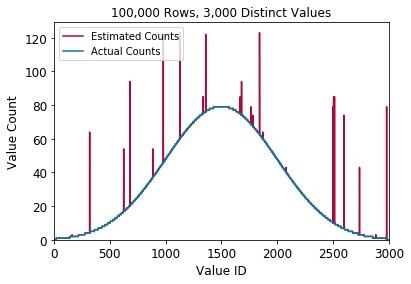

C:\Users\Arne\Anaconda3\lib\site-packages\ipykernel_launcher.py:204: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\Arne\Anaconda3\lib\site-packages\ipykernel_launcher.py:204: RuntimeWarning: divide by zero encountered in longlong_scalars


error count:23
max error: 79
max relative error: 1500.0%


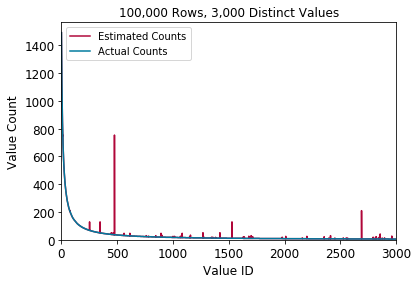

error count:59
max error: 718
max relative error: 3400.0%
Estimation Technique: filter_15_2
Sample Size: 30000000
Mean Error: 0.745445966667
Mean Squared Error: 205.725556833
Column Size [kB](uint16_t): 200.0



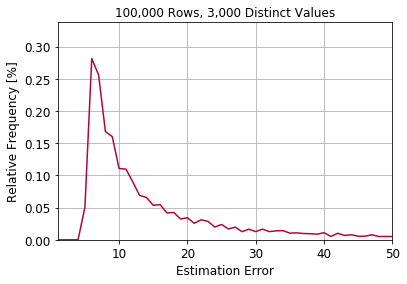

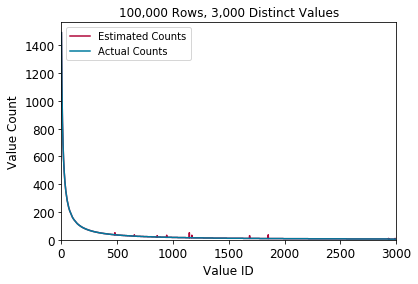

error count:10
max error: 36
max relative error: 300.0%
Estimation Technique: filter_15_4
Sample Size: 30000000
Mean Error: 0.190002066667
Mean Squared Error: 52.5717281333
Column Size [kB](uint16_t): 200.0



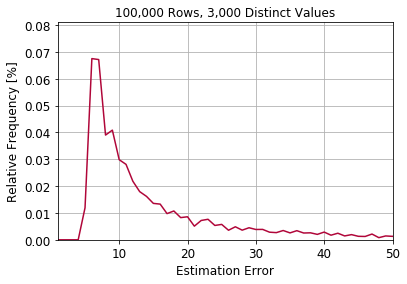

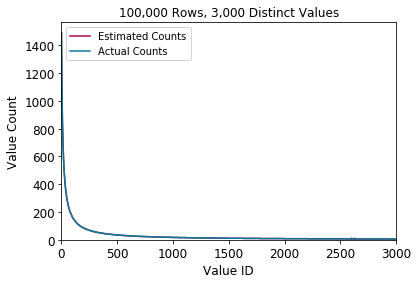

error count:2
max error: 6
max relative error: 100.0%
Estimation Technique: filter_15_8
Sample Size: 30000000
Mean Error: 0.0127066333333
Mean Squared Error: 3.6403375
Column Size [kB](uint16_t): 200.0



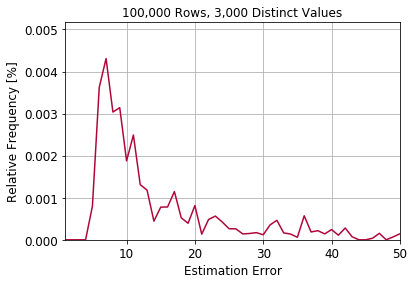

,Quotient Size,Remainder Size,Memory Consumption [KByte],Mean Error
0,14,4,12.288,0.370830
1,14,8,20.480,0.026796
2,14,16,36.864,0.000076
3,15,2,16.384,0.745446
4,15,4,24.576,0.190002
5,15,8,40.960,0.012707
6,15,16,73.728,0.000059
7,16,2,32.768,0.376085
8,16,4,49.152,0.095364
9,16,8,81.920,0.007251


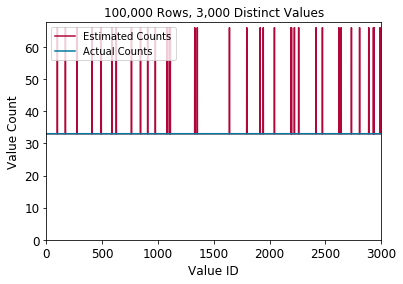

error count:36
max error: 33
max relative error: 100.0%


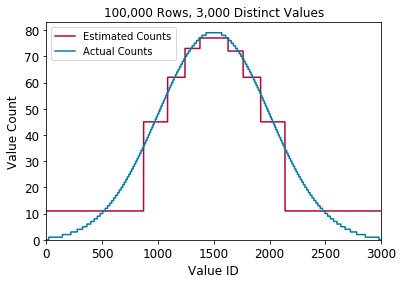

error count:2839
max error: 25
max relative error: 1000.0%
Estimation Technique: postgres1_10
Sample Size: 3000
Mean Error: 6.331
Mean Squared Error: 66.339
Column Size [kB](uint16_t): 200.0



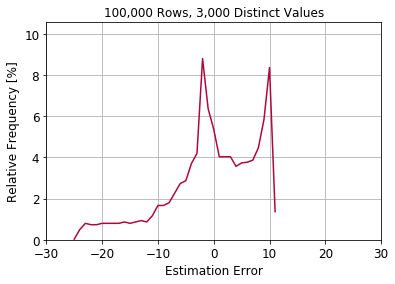

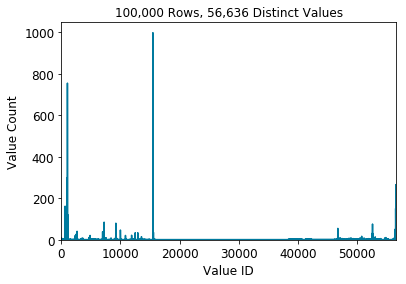

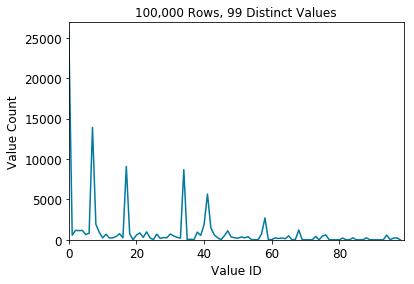

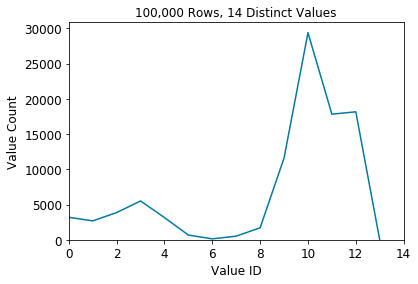

,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,Uniform Estimation,4.0,0.761618,243.016968
1,"Filter (Quotient Size 17, Remainder Size 2)",65536.0,0.190277,26.722027
2,"Filter (Quotient Size 17, Remainder Size 4)",98304.0,0.048086,7.332300
3,"Filter (Quotient Size 17, Remainder Size 8)",163840.0,0.002895,0.326013
4,"Filter (Quotient Size 17, Remainder Size 16)",294912.0,0.000011,0.000121
5,Fixed Height Histogram (10 Buckets),40.0,0.866816,210.545536
6,Fixed Height Histogram (50 Buckets),200.0,0.558355,73.544195
7,Fixed Height Histogram (100 Buckets),400.0,0.548520,80.490077
8,Most Common Values (10 Values),80.0,0.587012,70.244579
9,Most Common Values (50 Values),400.0,0.408362,18.417861


,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,Uniform Estimation,4.0,778.231373,3.877694e+07
1,"Filter (Quotient Size 12, Remainder Size 2)",2048.0,6.127934,6.082174e+05
2,"Filter (Quotient Size 12, Remainder Size 4)",3072.0,1.540559,1.528809e+05
3,"Filter (Quotient Size 12, Remainder Size 8)",5120.0,0.000342,1.263600e-03
4,"Filter (Quotient Size 12, Remainder Size 16)",9216.0,0.000000,0.000000e+00
5,Fixed Height Histogram (10 Buckets),40.0,388.941176,3.151040e+07
6,Most Common Values (10 Values),80.0,0.211765,3.843137e-01


In [3]:
example_data = get_results("estimation_examples")

# Normal
estimation_example(example_data, "normal", 100000, 3000, "filter_14_4") 

# Zipf
data_name = "zipf"
distinct_values = 3000
row_count = 100000
estimation_example(example_data, data_name, row_count, distinct_values, "filter_15_2")  
estimation_evaluation(data_name, row_count, distinct_values, "filter_15_2")

estimation_example(example_data, data_name, row_count, distinct_values, "filter_15_4")  
estimation_evaluation(data_name, row_count, distinct_values, "filter_15_4")

estimation_example(example_data, data_name, row_count, distinct_values, "filter_15_8")  
estimation_evaluation(data_name, row_count, distinct_values, "filter_15_8")

filters = ["filter_14_4", "filter_14_8", "filter_14_16",
           "filter_15_2", "filter_15_4", "filter_15_8", "filter_15_16",
           "filter_16_2", "filter_16_4", "filter_16_8", "filter_16_16"]
filter_estimation_table(data_name, row_count, distinct_values, filters)

# Uniform
estimation_example(example_data, "uniform", 100000, 3000, "filter_14_4") 

# Zipf Postgres
data_name = "normal"
distinct_values = 3000
row_count = 100000
estimation_example(example_data, data_name, row_count, distinct_values, "postgres1_10")  
estimation_evaluation(data_name, row_count, distinct_values, "postgres1_10")

# Acdoca
value_distribution(example_data, "acdoca_BELNR", 100000, 56636)
value_distribution(example_data, "acdoca_RBUKRS", 100000, 99)
value_distribution(example_data, "acdoca_RYEAR", 100000, 14)

estimation_tecs = ["uniform", 
                   "filter_17_2", "filter_17_4", "filter_17_8", "filter_17_16", 
                   "postgres1_10", "postgres1_50", "postgres1_100",
                   "postgres2_10", "postgres2_50", "postgres2_100"]
estimation_comparison_table(estimation_tecs, "acdoca_BELNR", 100000, 56636, "complete")

estimation_tecs = ["uniform", 
                   "filter_12_2", "filter_12_4", "filter_12_8", "filter_12_16", 
                   "postgres1_10",
                   "postgres2_10"]
estimation_comparison_table(estimation_tecs, "acdoca_EBELN", 100000, 255, "complete")

,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,Uniform Estimation,4.0,24.865667,775.522333
1,Fixed Height Histogram (10 Buckets),40.0,6.331000,66.339000
2,Fixed Height Histogram (50 Buckets),200.0,1.928333,5.569000
3,Fixed Height Histogram (100 Buckets),400.0,1.701000,4.516333
4,Most Common Values (10 Values),40.0,24.709000,768.159000
5,Most Common Values (50 Values),200.0,23.966333,739.608333
6,Most Common Values (100 Values),400.0,23.166333,701.208333
7,"Filter (Quotient Size 14, Remainder Size 4)",12288.0,0.378613,21.523075
8,"Filter (Quotient Size 14, Remainder Size 8)",20480.0,0.024663,1.402715
9,"Filter (Quotient Size 14, Remainder Size 16)",36864.0,0.000083,0.003666


,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,"Filter (Quotient Size 14, Remainder Size 4)",12288.0,0.378613,21.523075
1,"Filter (Quotient Size 14, Remainder Size 8)",20480.0,0.024663,1.402715
2,"Filter (Quotient Size 14, Remainder Size 16)",36864.0,0.000083,0.003666
3,"Filter (Quotient Size 15, Remainder Size 2)",16384.0,0.752663,42.940439
4,"Filter (Quotient Size 15, Remainder Size 4)",24576.0,0.188541,10.743073
5,"Filter (Quotient Size 15, Remainder Size 8)",40960.0,0.012697,0.727447
6,"Filter (Quotient Size 15, Remainder Size 16)",73728.0,0.000087,0.003865
7,"Filter (Quotient Size 16, Remainder Size 2)",32768.0,0.377163,21.459223
8,"Filter (Quotient Size 16, Remainder Size 4)",49152.0,0.094257,5.340029
9,"Filter (Quotient Size 16, Remainder Size 8)",81920.0,0.006404,0.360757


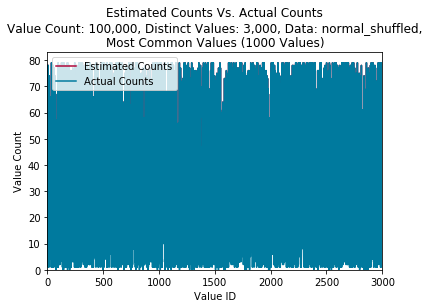

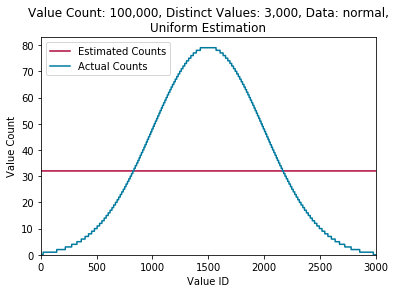

C:\Users\Arne\Anaconda3\lib\site-packages\ipykernel_launcher.py:173: RuntimeWarning: divide by zero encountered in longlong_scalars


max error: 47
max relative error: 3100.0%
Estimation Technique: uniform
Sample Size: 3000
Mean Error: 24.8656666667
Mean Squared Error: 775.522333333
Column Size [kB](uint16_t): 200.0



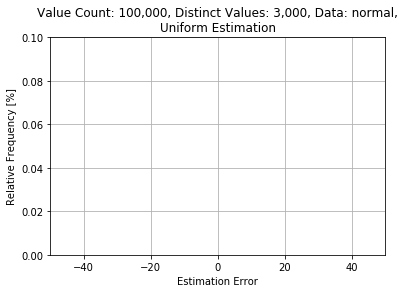

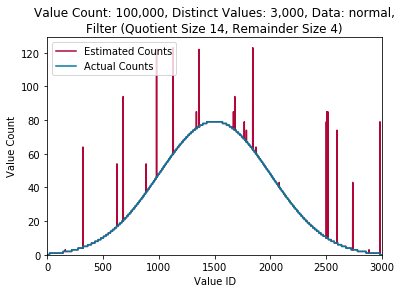

C:\Users\Arne\Anaconda3\lib\site-packages\ipykernel_launcher.py:173: RuntimeWarning: invalid value encountered in longlong_scalars


max error: 79
max relative error: 1500.0%
Estimation Technique: filter_14_4
Sample Size: 30000000
Mean Error: 0.378613466667
Mean Squared Error: 21.5230748
Column Size [kB](uint16_t): 200.0



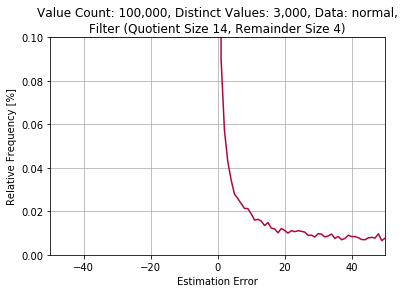

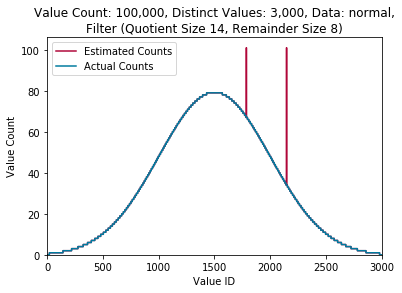

max error: 67
max relative error: 197.058823529%
Estimation Technique: filter_14_8
Sample Size: 30000000
Mean Error: 0.0246630333333
Mean Squared Error: 1.4027149
Column Size [kB](uint16_t): 200.0



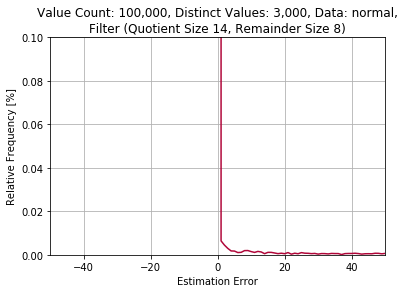

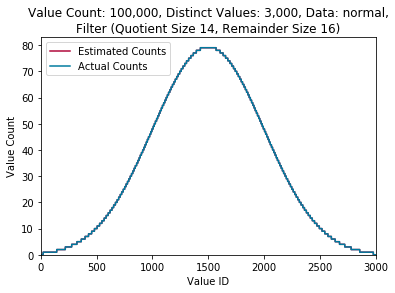

max error: 0
max relative error: 0%
Estimation Technique: filter_14_16
Sample Size: 30000000
Mean Error: 8.26e-05
Mean Squared Error: 0.00366586666667
Column Size [kB](uint16_t): 200.0



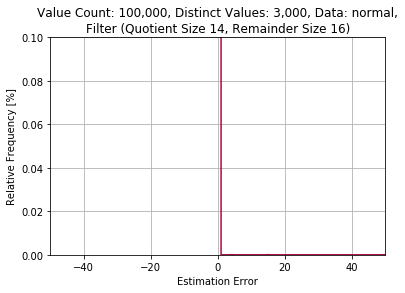

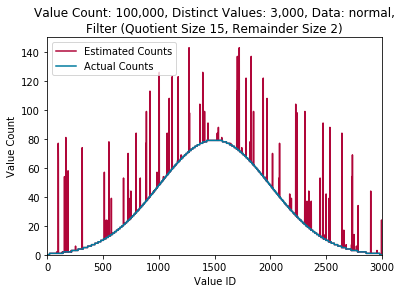

max error: 79
max relative error: 7600.0%
Estimation Technique: filter_15_2
Sample Size: 30000000
Mean Error: 0.7526635
Mean Squared Error: 42.9404389667
Column Size [kB](uint16_t): 200.0



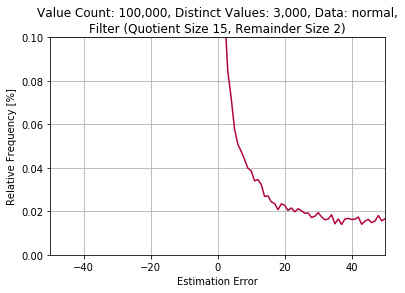

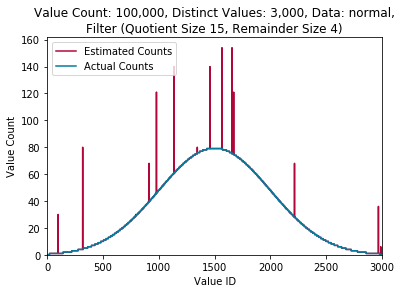

max error: 79
max relative error: 3500.0%
Estimation Technique: filter_15_4
Sample Size: 30000000
Mean Error: 0.188540566667
Mean Squared Error: 10.7430729
Column Size [kB](uint16_t): 200.0



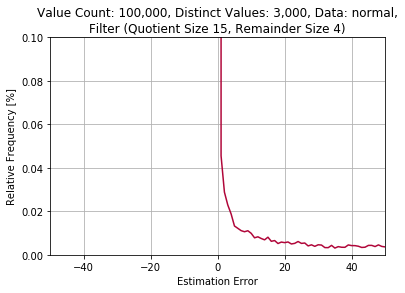

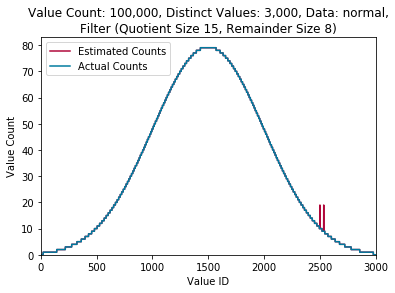

max error: 10
max relative error: 111.111111111%
Estimation Technique: filter_15_8
Sample Size: 30000000
Mean Error: 0.0126966333333
Mean Squared Error: 0.727447366667
Column Size [kB](uint16_t): 200.0



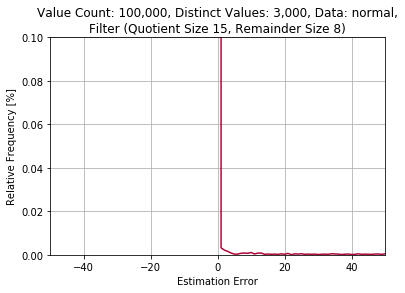

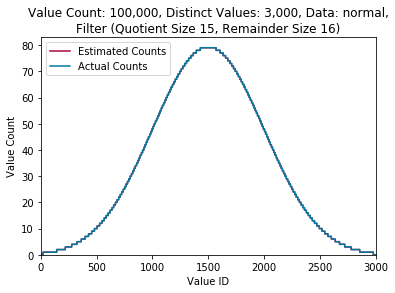

max error: 0
max relative error: 0%
Estimation Technique: filter_15_16
Sample Size: 30000000
Mean Error: 8.74e-05
Mean Squared Error: 0.0038646
Column Size [kB](uint16_t): 200.0



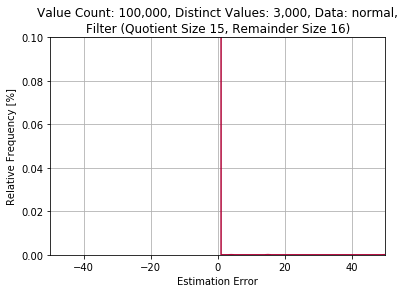

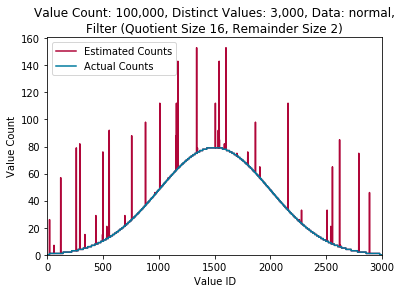

max error: 79
max relative error: 5600.0%
Estimation Technique: filter_16_2
Sample Size: 30000000
Mean Error: 0.377162666667
Mean Squared Error: 21.4592232667
Column Size [kB](uint16_t): 200.0



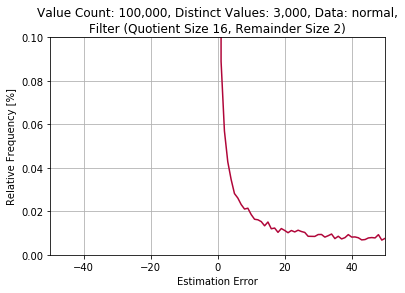

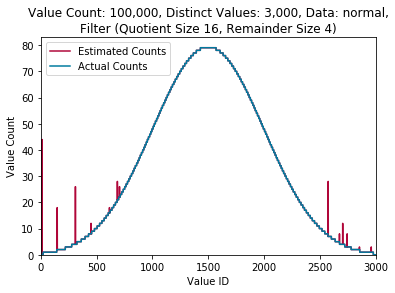

max error: 44
max relative error: 800.0%
Estimation Technique: filter_16_4
Sample Size: 30000000
Mean Error: 0.0942566333333
Mean Squared Error: 5.34002863333
Column Size [kB](uint16_t): 200.0



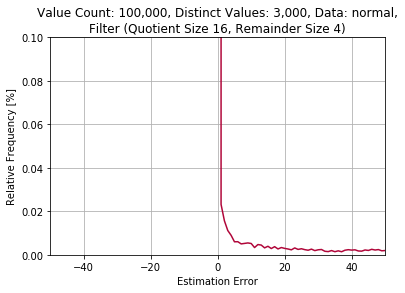

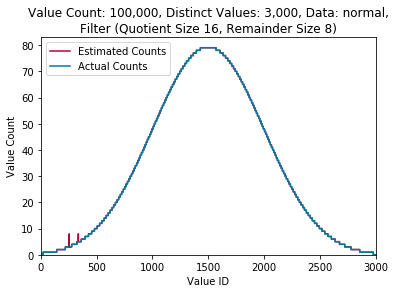

max error: 5
max relative error: 166.666666667%
Estimation Technique: filter_16_8
Sample Size: 30000000
Mean Error: 0.0064036
Mean Squared Error: 0.360757266667
Column Size [kB](uint16_t): 200.0



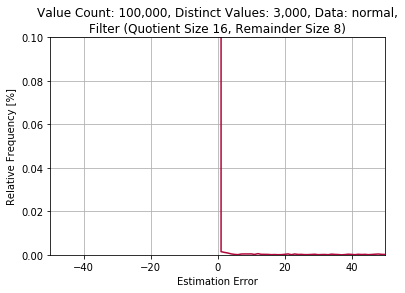

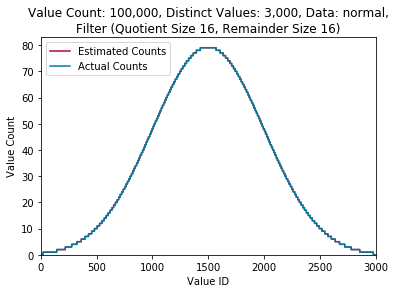

max error: 0
max relative error: 0%
Estimation Technique: filter_16_16
Sample Size: 30000000
Mean Error: 6.68e-05
Mean Squared Error: 0.00299613333333
Column Size [kB](uint16_t): 200.0



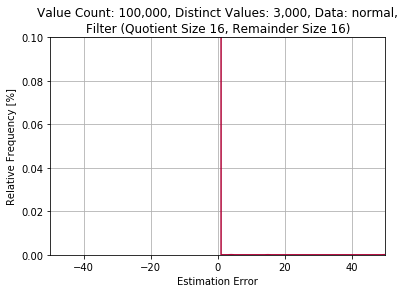

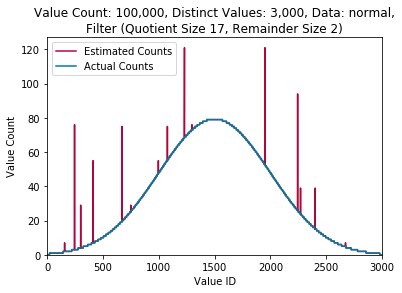

max error: 73
max relative error: 2433.33333333%
Estimation Technique: filter_17_2
Sample Size: 30000000
Mean Error: 0.186920833333
Mean Squared Error: 10.6572333
Column Size [kB](uint16_t): 200.0



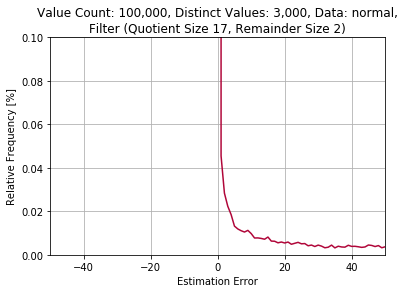

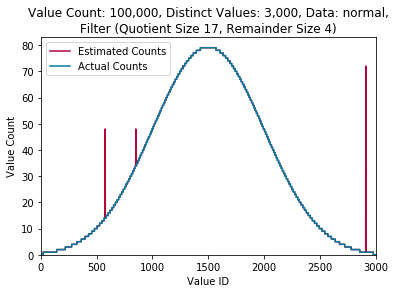

max error: 71
max relative error: 7100.0%
Estimation Technique: filter_17_4
Sample Size: 30000000
Mean Error: 0.0500827333333
Mean Squared Error: 2.86094346667
Column Size [kB](uint16_t): 200.0



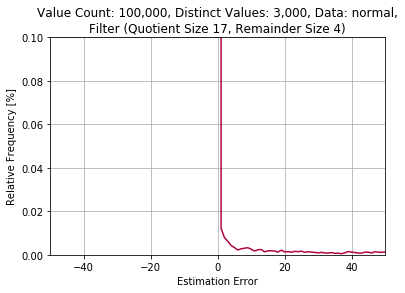

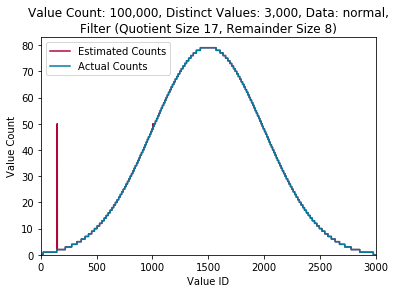

max error: 48
max relative error: 2400.0%
Estimation Technique: filter_17_8
Sample Size: 30000000
Mean Error: 0.00259813333333
Mean Squared Error: 0.1377118
Column Size [kB](uint16_t): 200.0



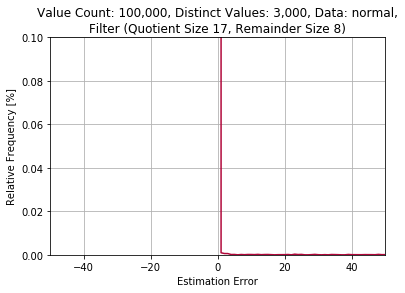

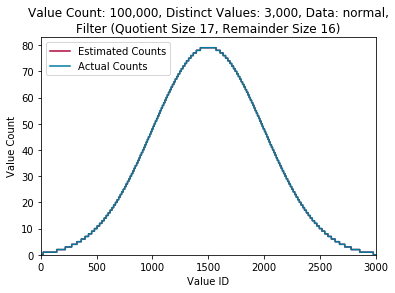

max error: 0
max relative error: 0%
Estimation Technique: filter_17_16
Sample Size: 30000000
Mean Error: 7.32e-05
Mean Squared Error: 0.0032362
Column Size [kB](uint16_t): 200.0



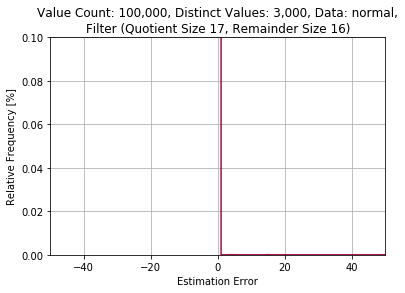

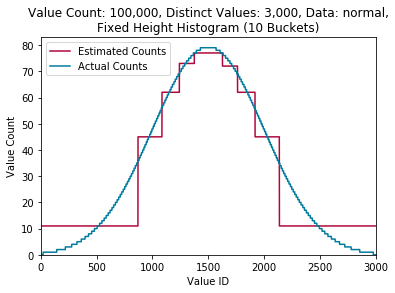

max error: 25
max relative error: 1000.0%
Estimation Technique: postgres1_10
Sample Size: 3000
Mean Error: 6.331
Mean Squared Error: 66.339
Column Size [kB](uint16_t): 200.0



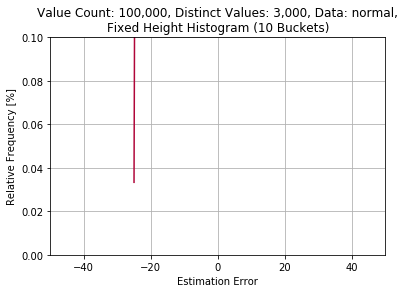

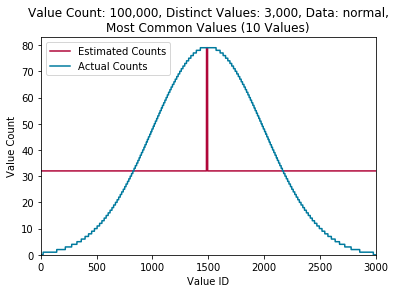

max error: 47
max relative error: 3100.0%
Estimation Technique: postgres2_10
Sample Size: 3000
Mean Error: 24.709
Mean Squared Error: 768.159
Column Size [kB](uint16_t): 200.0



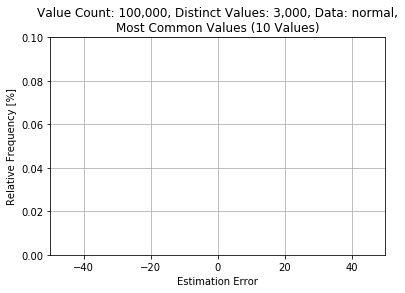

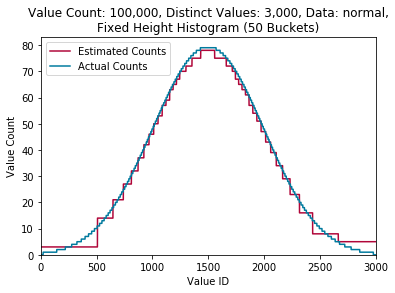

max error: 8
max relative error: 400.0%
Estimation Technique: postgres1_50
Sample Size: 3000
Mean Error: 1.92833333333
Mean Squared Error: 5.569
Column Size [kB](uint16_t): 200.0



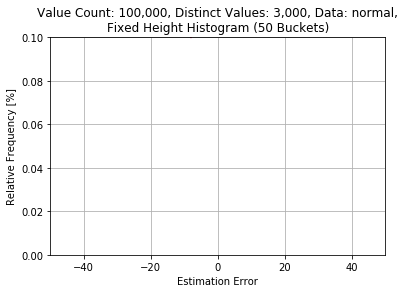

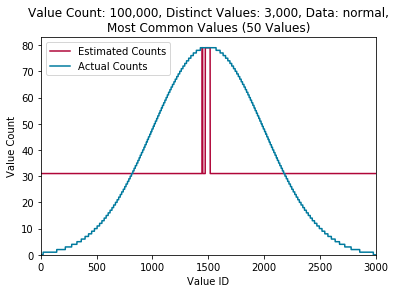

max error: 48
max relative error: 3000.0%
Estimation Technique: postgres2_50
Sample Size: 3000
Mean Error: 23.9663333333
Mean Squared Error: 739.608333333
Column Size [kB](uint16_t): 200.0



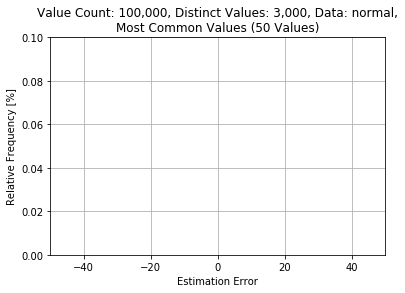

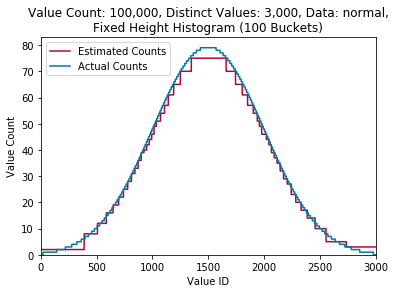

max error: 6
max relative error: 200.0%
Estimation Technique: postgres1_100
Sample Size: 3000
Mean Error: 1.701
Mean Squared Error: 4.51633333333
Column Size [kB](uint16_t): 200.0



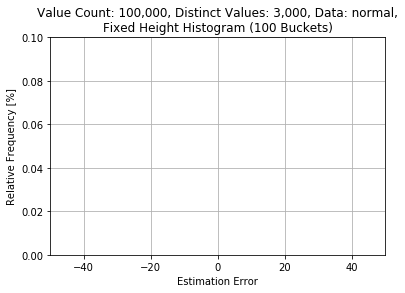

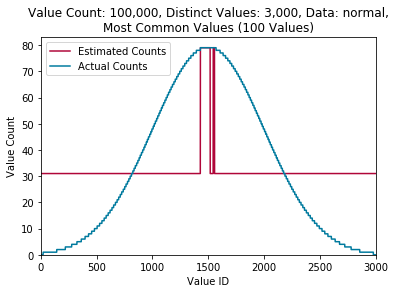

max error: 48
max relative error: 3000.0%
Estimation Technique: postgres2_100
Sample Size: 3000
Mean Error: 23.1663333333
Mean Squared Error: 701.208333333
Column Size [kB](uint16_t): 200.0



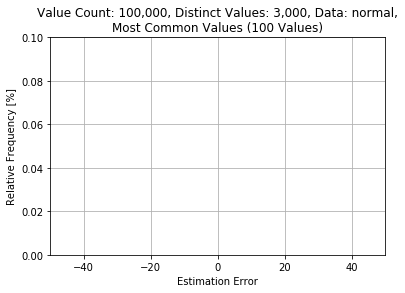

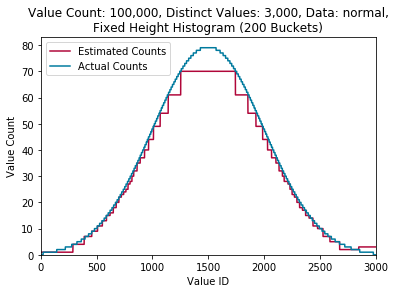

max error: 9
max relative error: 200.0%
Estimation Technique: postgres1_200
Sample Size: 3000
Mean Error: 2.539
Mean Squared Error: 12.9923333333
Column Size [kB](uint16_t): 200.0



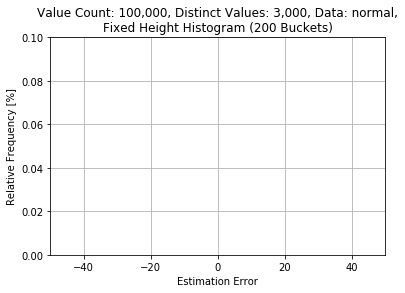

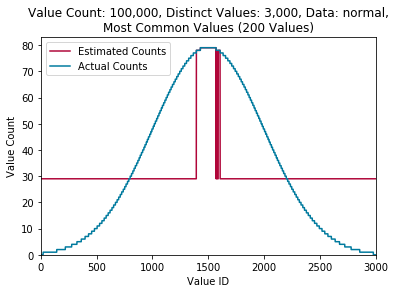

max error: 49
max relative error: 2800.0%
Estimation Technique: postgres2_200
Sample Size: 3000
Mean Error: 21.302
Mean Squared Error: 624.260666667
Column Size [kB](uint16_t): 200.0



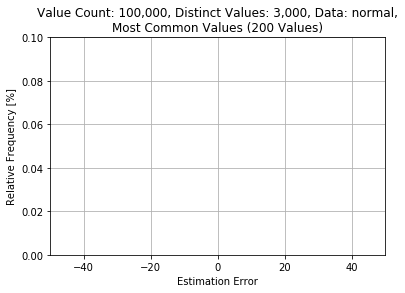

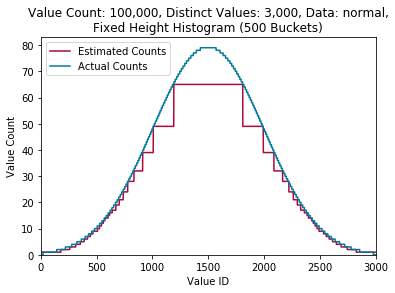

max error: 16
max relative error: 50.0%
Estimation Technique: postgres1_500
Sample Size: 3000
Mean Error: 3.96933333333
Mean Squared Error: 37.2013333333
Column Size [kB](uint16_t): 200.0



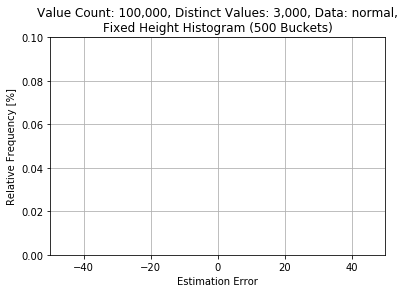

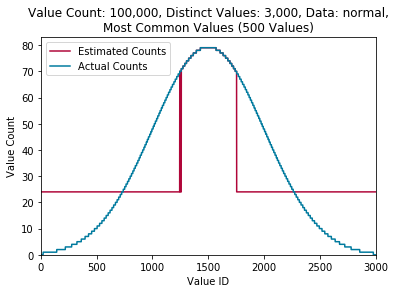

max error: 46
max relative error: 2300.0%
Estimation Technique: postgres2_500
Sample Size: 3000
Mean Error: 15.848
Mean Squared Error: 398.416666667
Column Size [kB](uint16_t): 200.0



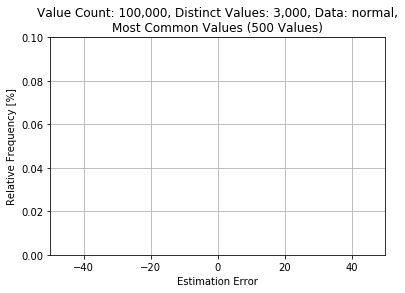

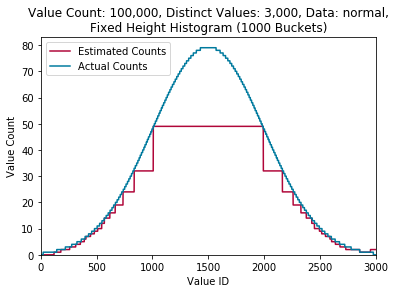

max error: 30
max relative error: 100.0%
Estimation Technique: postgres1_1000
Sample Size: 3000
Mean Error: 8.01766666667
Mean Squared Error: 161.659666667
Column Size [kB](uint16_t): 200.0



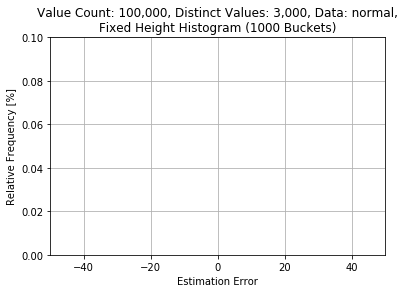

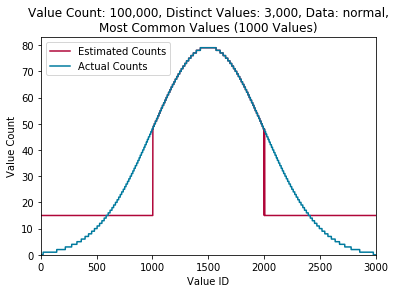

max error: 33
max relative error: 1400.0%
Estimation Technique: postgres2_1000
Sample Size: 3000
Mean Error: 7.93933333333
Mean Squared Error: 130.826666667
Column Size [kB](uint16_t): 200.0



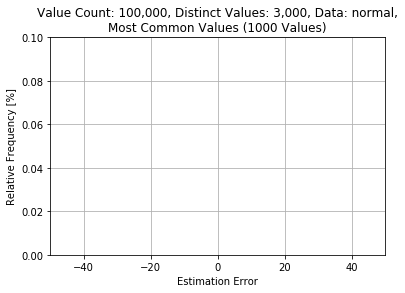

,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,Uniform Estimation,4.0,24.865667,775.522333
1,Fixed Height Histogram (10 Buckets),40.0,24.805333,771.630667
2,Fixed Height Histogram (50 Buckets),200.0,24.888333,791.755667
3,Fixed Height Histogram (100 Buckets),400.0,24.319667,758.186333
4,Most Common Values (10 Values),40.0,24.709000,768.159000
5,Most Common Values (50 Values),200.0,23.966333,739.608333
6,Most Common Values (100 Values),400.0,23.166333,701.208333
7,"Filter (Quotient Size 14, Remainder Size 4)",12288.0,0.378350,21.435696
8,"Filter (Quotient Size 14, Remainder Size 8)",20480.0,0.024431,1.353294
9,"Filter (Quotient Size 14, Remainder Size 16)",36864.0,0.000173,0.012454


,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,"Filter (Quotient Size 14, Remainder Size 4)",12288.0,0.378350,21.435696
1,"Filter (Quotient Size 14, Remainder Size 8)",20480.0,0.024431,1.353294
2,"Filter (Quotient Size 14, Remainder Size 16)",36864.0,0.000173,0.012454
3,"Filter (Quotient Size 15, Remainder Size 2)",16384.0,0.753523,42.990162
4,"Filter (Quotient Size 15, Remainder Size 4)",24576.0,0.186782,10.525938
5,"Filter (Quotient Size 15, Remainder Size 8)",40960.0,0.011666,0.646539
6,"Filter (Quotient Size 15, Remainder Size 16)",73728.0,0.000127,0.008976
7,"Filter (Quotient Size 16, Remainder Size 2)",32768.0,0.376982,21.372574
8,"Filter (Quotient Size 16, Remainder Size 4)",49152.0,0.094315,5.263322
9,"Filter (Quotient Size 16, Remainder Size 8)",81920.0,0.006119,0.341910


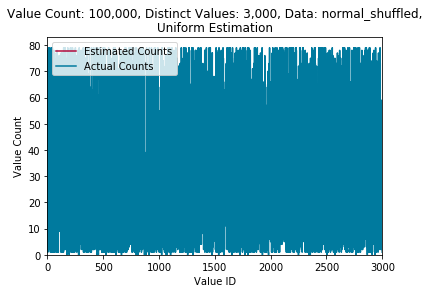

max error: 47
max relative error: 3100.0%
Estimation Technique: uniform
Sample Size: 3000
Mean Error: 24.8656666667
Mean Squared Error: 775.522333333
Column Size [kB](uint16_t): 200.0



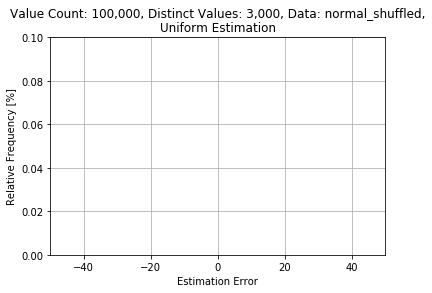

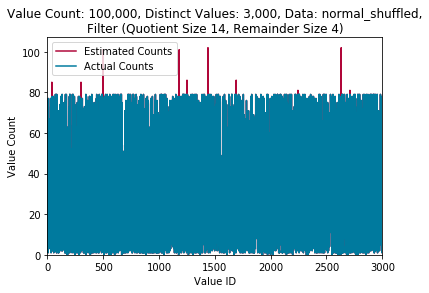

max error: 79
max relative error: 3950.0%
Estimation Technique: filter_14_4
Sample Size: 30000000
Mean Error: 0.378350233333
Mean Squared Error: 21.4356960333
Column Size [kB](uint16_t): 200.0



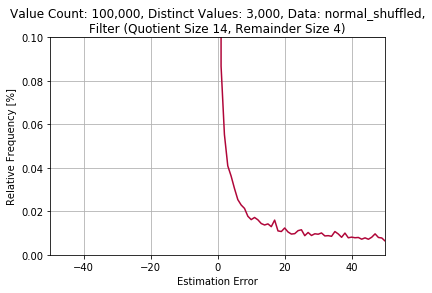

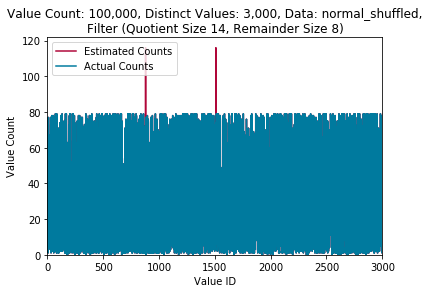

max error: 74
max relative error: 176.19047619%
Estimation Technique: filter_14_8
Sample Size: 30000000
Mean Error: 0.0244309
Mean Squared Error: 1.3532945
Column Size [kB](uint16_t): 200.0



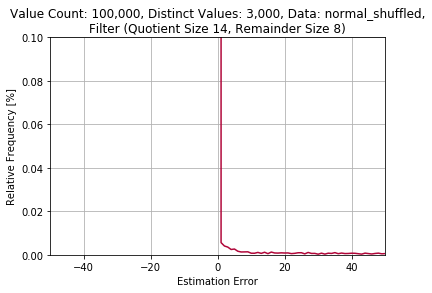

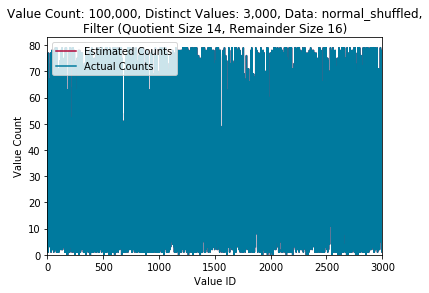

max error: 0
max relative error: 0%
Estimation Technique: filter_14_16
Sample Size: 30000000
Mean Error: 0.0001732
Mean Squared Error: 0.0124538
Column Size [kB](uint16_t): 200.0



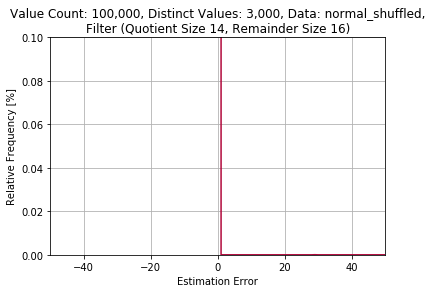

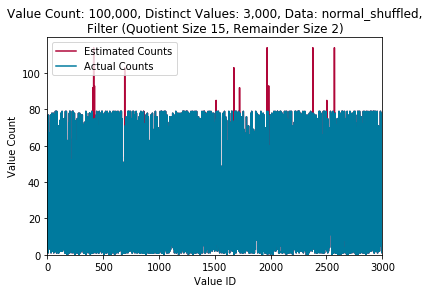

max error: 76
max relative error: 3800.0%
Estimation Technique: filter_15_2
Sample Size: 30000000
Mean Error: 0.753523133333
Mean Squared Error: 42.9901616
Column Size [kB](uint16_t): 200.0



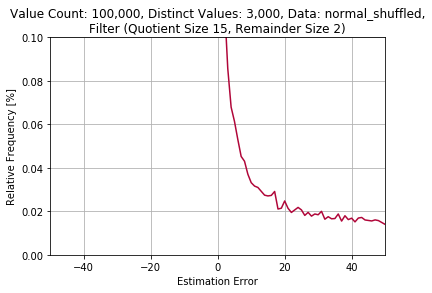

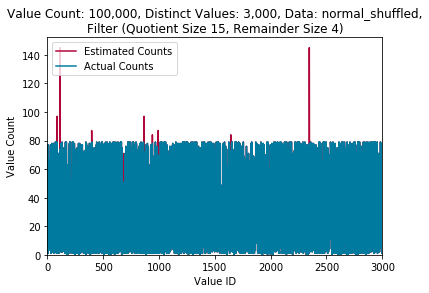

max error: 78
max relative error: 2133.33333333%
Estimation Technique: filter_15_4
Sample Size: 30000000
Mean Error: 0.1867817
Mean Squared Error: 10.5259384333
Column Size [kB](uint16_t): 200.0



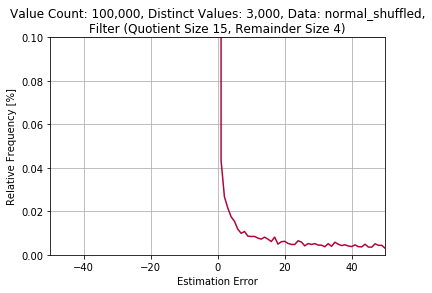

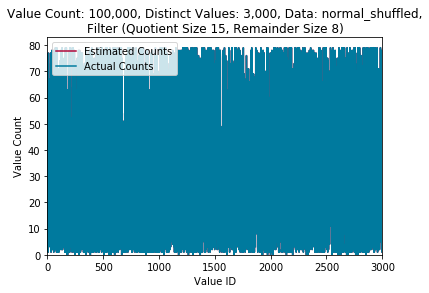

max error: 0
max relative error: 0%
Estimation Technique: filter_15_8
Sample Size: 30000000
Mean Error: 0.0116664666667
Mean Squared Error: 0.6465394
Column Size [kB](uint16_t): 200.0



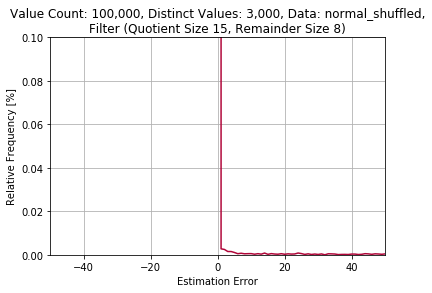

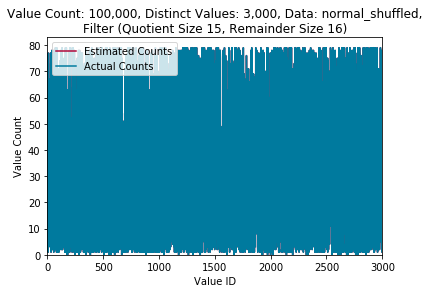

max error: 0
max relative error: 0%
Estimation Technique: filter_15_16
Sample Size: 30000000
Mean Error: 0.000127133333333
Mean Squared Error: 0.0089762
Column Size [kB](uint16_t): 200.0



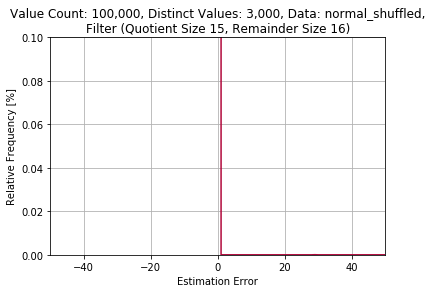

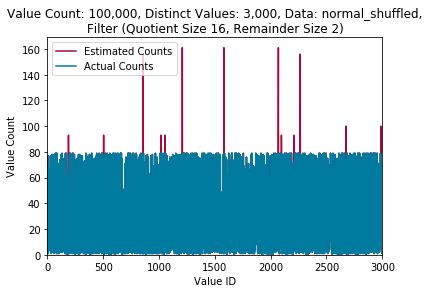

max error: 136
max relative error: 7200.0%
Estimation Technique: filter_16_2
Sample Size: 30000000
Mean Error: 0.3769822
Mean Squared Error: 21.3725744
Column Size [kB](uint16_t): 200.0



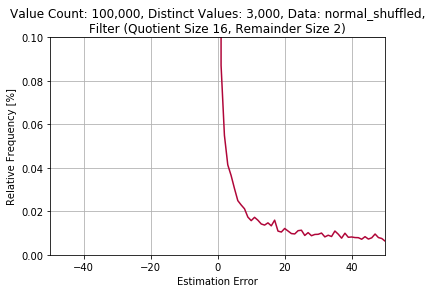

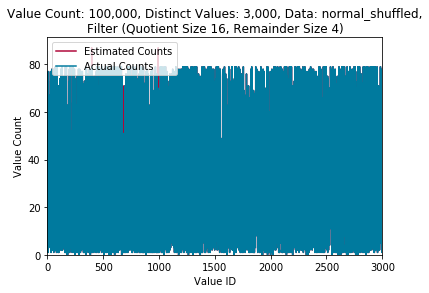

max error: 70
max relative error: 2133.33333333%
Estimation Technique: filter_16_4
Sample Size: 30000000
Mean Error: 0.0943147333333
Mean Squared Error: 5.26332206667
Column Size [kB](uint16_t): 200.0



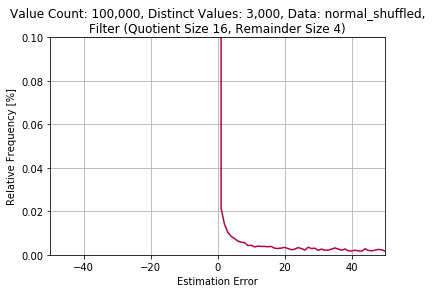

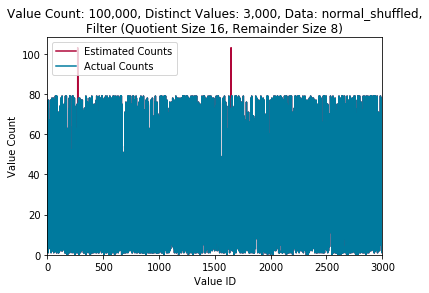

max error: 63
max relative error: 157.5%
Estimation Technique: filter_16_8
Sample Size: 30000000
Mean Error: 0.0061187
Mean Squared Error: 0.341909766667
Column Size [kB](uint16_t): 200.0



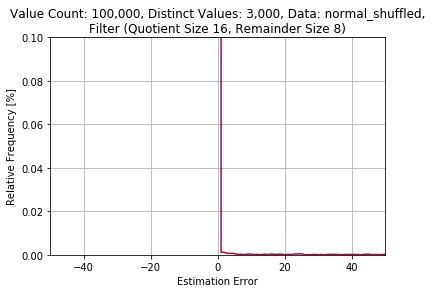

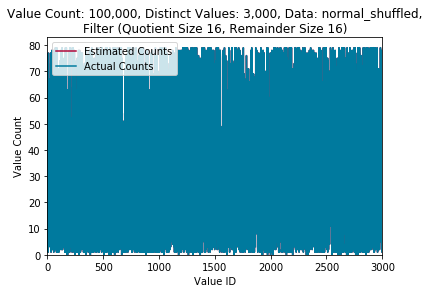

max error: 0
max relative error: 0%
Estimation Technique: filter_16_16
Sample Size: 30000000
Mean Error: 0.0001501
Mean Squared Error: 0.0105279
Column Size [kB](uint16_t): 200.0



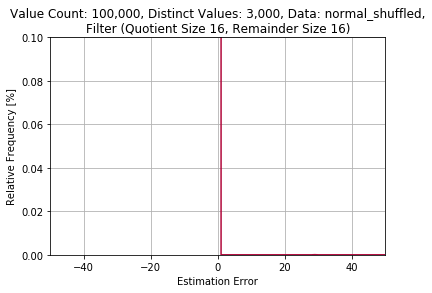

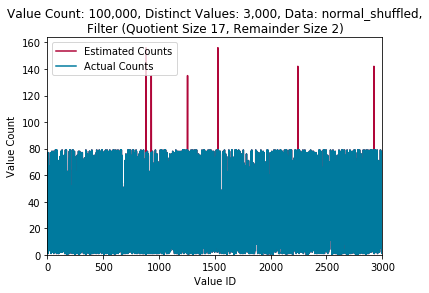

max error: 79
max relative error: 750.0%
Estimation Technique: filter_17_2
Sample Size: 30000000
Mean Error: 0.187326166667
Mean Squared Error: 10.5507759667
Column Size [kB](uint16_t): 200.0



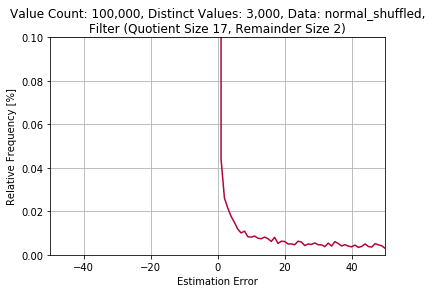

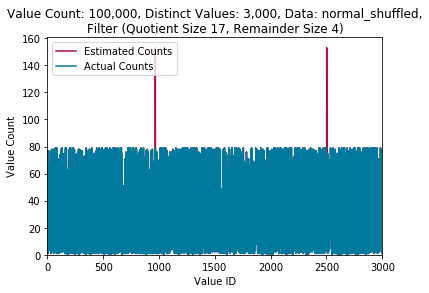

max error: 78
max relative error: 1450.0%
Estimation Technique: filter_17_4
Sample Size: 30000000
Mean Error: 0.048519
Mean Squared Error: 2.69671806667
Column Size [kB](uint16_t): 200.0



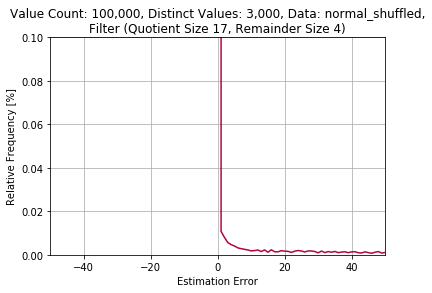

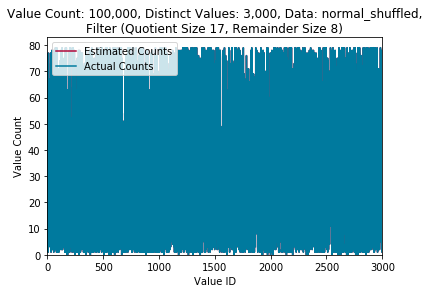

max error: 0
max relative error: 0%
Estimation Technique: filter_17_8
Sample Size: 30000000
Mean Error: 0.00281853333333
Mean Squared Error: 0.156334733333
Column Size [kB](uint16_t): 200.0



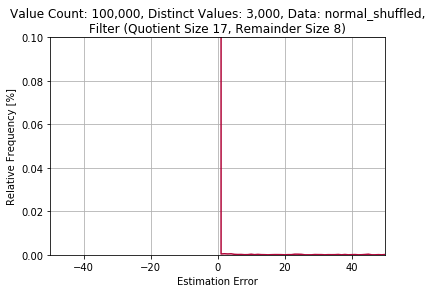

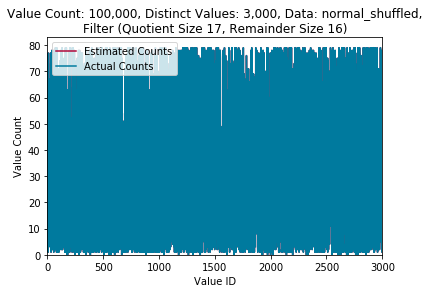

max error: 0
max relative error: 0%
Estimation Technique: filter_17_16
Sample Size: 30000000
Mean Error: 0.000196166666667
Mean Squared Error: 0.0140055
Column Size [kB](uint16_t): 200.0



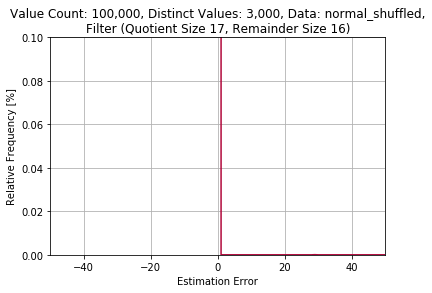

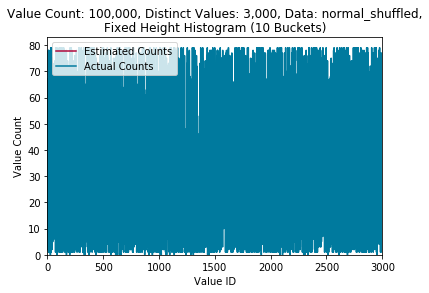

max error: 50
max relative error: 3400.0%
Estimation Technique: postgres1_10
Sample Size: 3000
Mean Error: 24.8053333333
Mean Squared Error: 771.630666667
Column Size [kB](uint16_t): 200.0



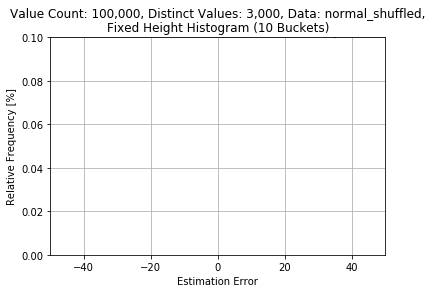

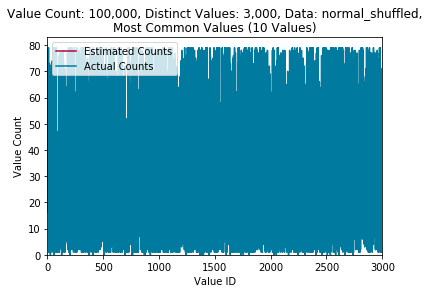

max error: 47
max relative error: 3100.0%
Estimation Technique: postgres2_10
Sample Size: 3000
Mean Error: 24.709
Mean Squared Error: 768.159
Column Size [kB](uint16_t): 200.0



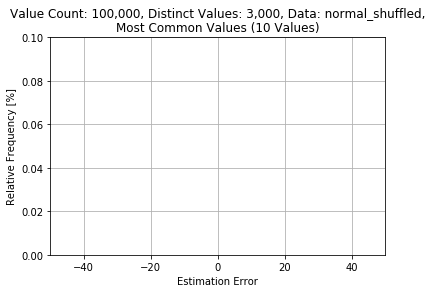

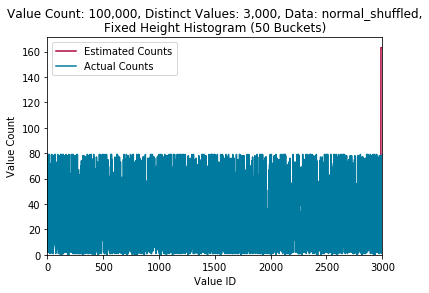

max error: 162
max relative error: 16200.0%
Estimation Technique: postgres1_50
Sample Size: 3000
Mean Error: 24.8883333333
Mean Squared Error: 791.755666667
Column Size [kB](uint16_t): 200.0



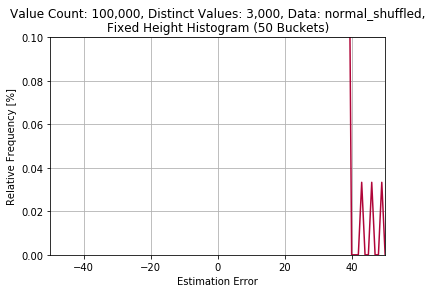

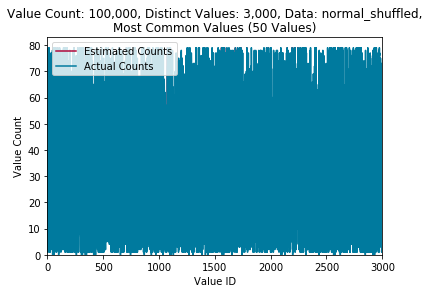

max error: 48
max relative error: 3000.0%
Estimation Technique: postgres2_50
Sample Size: 3000
Mean Error: 23.9663333333
Mean Squared Error: 739.608333333
Column Size [kB](uint16_t): 200.0



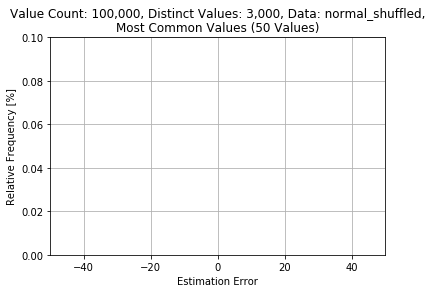

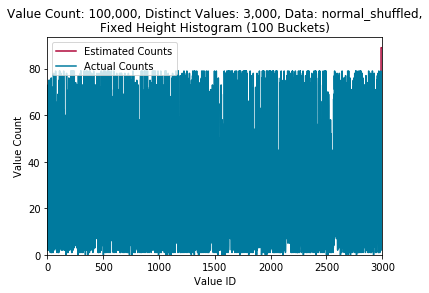

max error: 87
max relative error: 4800.0%
Estimation Technique: postgres1_100
Sample Size: 3000
Mean Error: 24.3196666667
Mean Squared Error: 758.186333333
Column Size [kB](uint16_t): 200.0



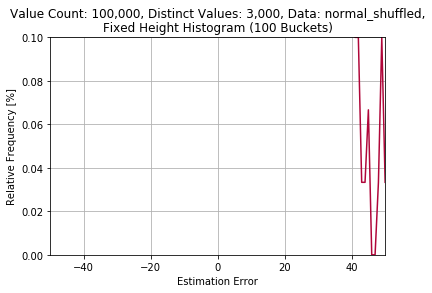

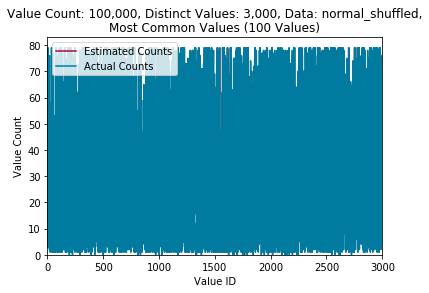

max error: 48
max relative error: 3000.0%
Estimation Technique: postgres2_100
Sample Size: 3000
Mean Error: 23.1663333333
Mean Squared Error: 701.208333333
Column Size [kB](uint16_t): 200.0



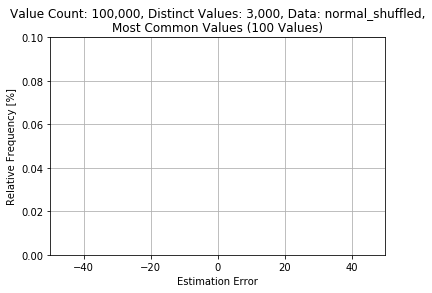

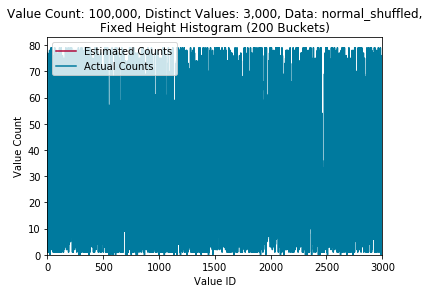

max error: 62
max relative error: 4800.0%
Estimation Technique: postgres1_200
Sample Size: 3000
Mean Error: 23.3513333333
Mean Squared Error: 726.665333333
Column Size [kB](uint16_t): 200.0



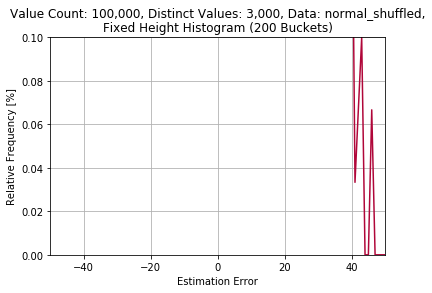

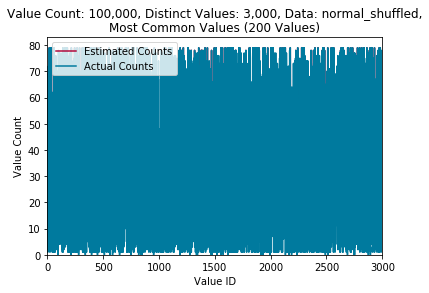

max error: 49
max relative error: 2800.0%
Estimation Technique: postgres2_200
Sample Size: 3000
Mean Error: 21.302
Mean Squared Error: 624.260666667
Column Size [kB](uint16_t): 200.0



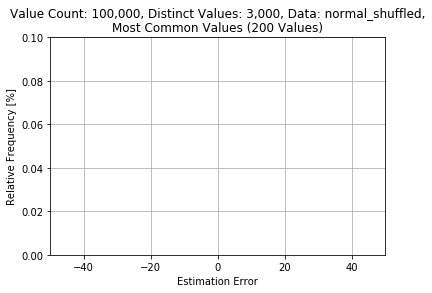

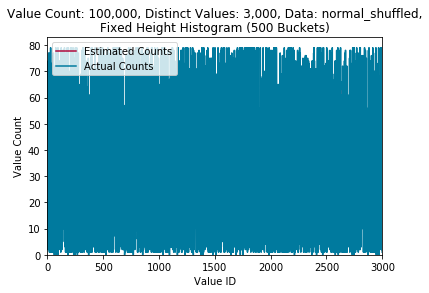

max error: 66
max relative error: 4800.0%
Estimation Technique: postgres1_500
Sample Size: 3000
Mean Error: 22.0973333333
Mean Squared Error: 692.73
Column Size [kB](uint16_t): 200.0



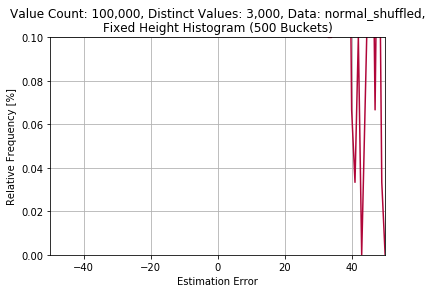

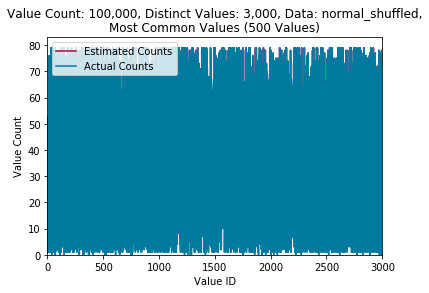

max error: 46
max relative error: 2300.0%
Estimation Technique: postgres2_500
Sample Size: 3000
Mean Error: 15.848
Mean Squared Error: 398.416666667
Column Size [kB](uint16_t): 200.0



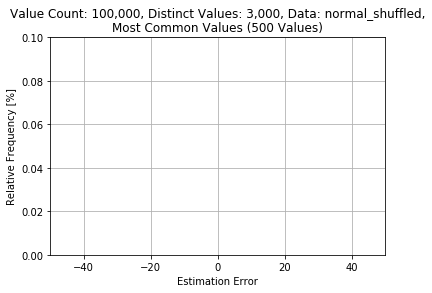

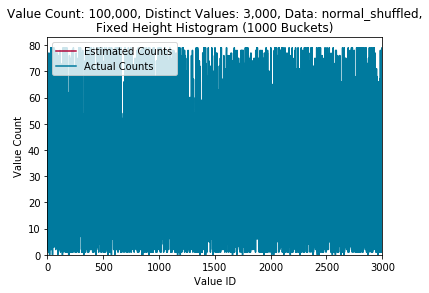

max error: 70
max relative error: 3100.0%
Estimation Technique: postgres1_1000
Sample Size: 3000
Mean Error: 20.9213333333
Mean Squared Error: 668.595333333
Column Size [kB](uint16_t): 200.0



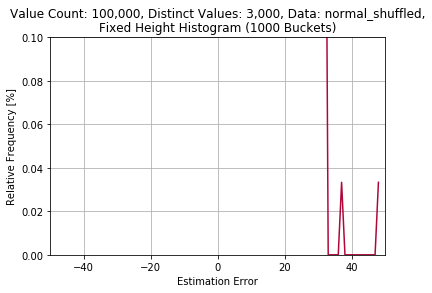

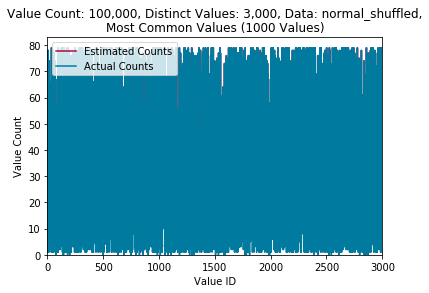

max error: 33
max relative error: 1400.0%
Estimation Technique: postgres2_1000
Sample Size: 3000
Mean Error: 7.93933333333
Mean Squared Error: 130.826666667
Column Size [kB](uint16_t): 200.0



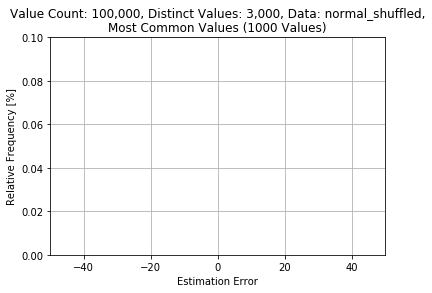

,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,Uniform Estimation,4.0,33.858333,8194.794333
1,Fixed Height Histogram (10 Buckets),40.0,4.590667,247.644667
2,Fixed Height Histogram (50 Buckets),200.0,2.625000,358.069667
3,Fixed Height Histogram (100 Buckets),400.0,3.609000,568.384333
4,Most Common Values (10 Values),40.0,28.356667,4099.660667
5,Most Common Values (50 Values),200.0,19.026667,1167.632667
6,Most Common Values (100 Values),400.0,13.921000,530.070333
7,"Filter (Quotient Size 14, Remainder Size 4)",12288.0,0.370830,99.642256
8,"Filter (Quotient Size 14, Remainder Size 8)",20480.0,0.026796,7.278046
9,"Filter (Quotient Size 14, Remainder Size 16)",36864.0,0.000076,0.003169


,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,"Filter (Quotient Size 14, Remainder Size 4)",12288.0,0.370830,99.642256
1,"Filter (Quotient Size 14, Remainder Size 8)",20480.0,0.026796,7.278046
2,"Filter (Quotient Size 14, Remainder Size 16)",36864.0,0.000076,0.003169
3,"Filter (Quotient Size 15, Remainder Size 2)",16384.0,0.745446,205.725557
4,"Filter (Quotient Size 15, Remainder Size 4)",24576.0,0.190002,52.571728
5,"Filter (Quotient Size 15, Remainder Size 8)",40960.0,0.012707,3.640338
6,"Filter (Quotient Size 15, Remainder Size 16)",73728.0,0.000059,0.002366
7,"Filter (Quotient Size 16, Remainder Size 2)",32768.0,0.376085,103.421361
8,"Filter (Quotient Size 16, Remainder Size 4)",49152.0,0.095364,26.397768
9,"Filter (Quotient Size 16, Remainder Size 8)",81920.0,0.007251,2.622427


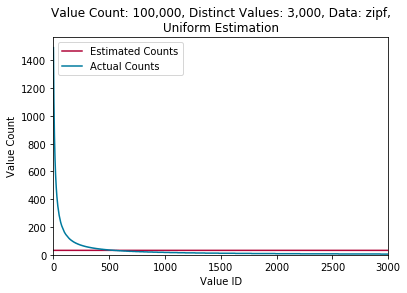

max error: 1459
max relative error: 540.0%
Estimation Technique: uniform
Sample Size: 3000
Mean Error: 33.8583333333
Mean Squared Error: 8194.79433333
Column Size [kB](uint16_t): 200.0



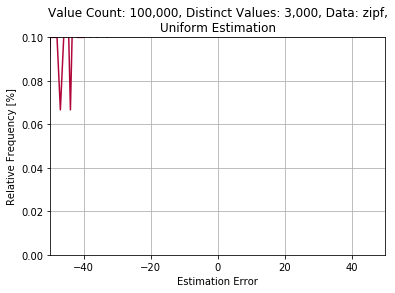

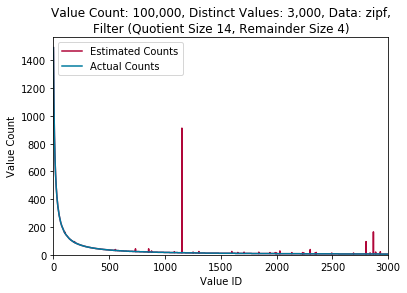

max error: 897
max relative error: 5980.0%
Estimation Technique: filter_14_4
Sample Size: 30000000
Mean Error: 0.370830133333
Mean Squared Error: 99.6422562
Column Size [kB](uint16_t): 200.0



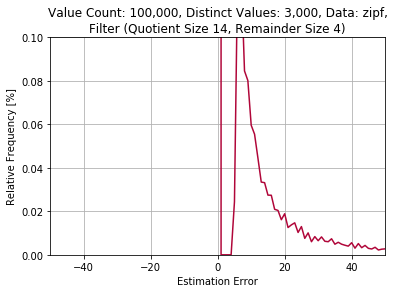

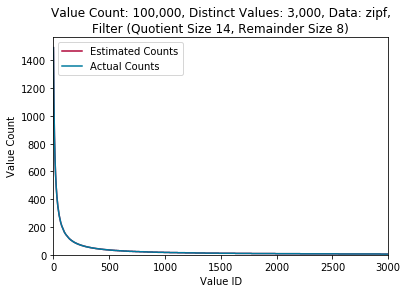

max error: 0
max relative error: 0%
Estimation Technique: filter_14_8
Sample Size: 30000000
Mean Error: 0.0267957
Mean Squared Error: 7.27804583333
Column Size [kB](uint16_t): 200.0



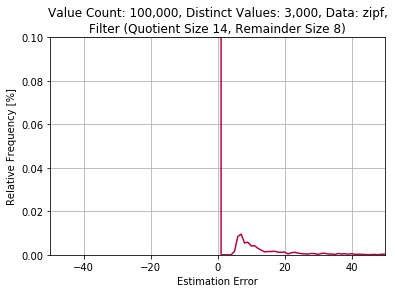

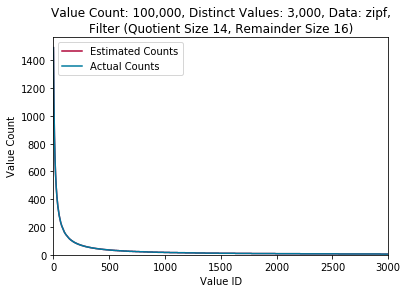

max error: 0
max relative error: 0%
Estimation Technique: filter_14_16
Sample Size: 30000000
Mean Error: 7.63666666667e-05
Mean Squared Error: 0.00316916666667
Column Size [kB](uint16_t): 200.0



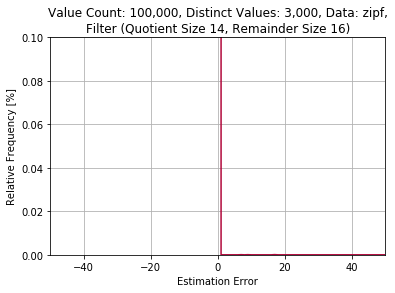

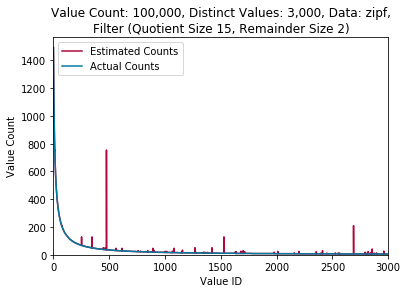

max error: 718
max relative error: 3400.0%
Estimation Technique: filter_15_2
Sample Size: 30000000
Mean Error: 0.745445966667
Mean Squared Error: 205.725556833
Column Size [kB](uint16_t): 200.0



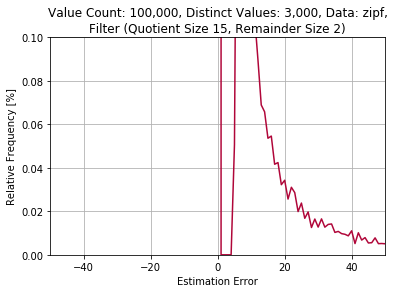

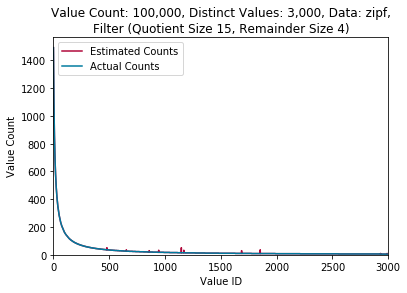

max error: 36
max relative error: 300.0%
Estimation Technique: filter_15_4
Sample Size: 30000000
Mean Error: 0.190002066667
Mean Squared Error: 52.5717281333
Column Size [kB](uint16_t): 200.0



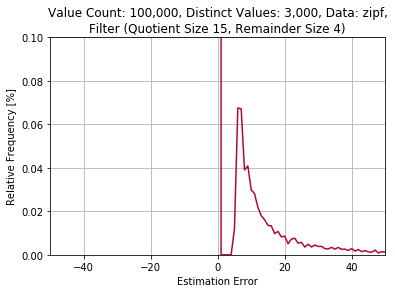

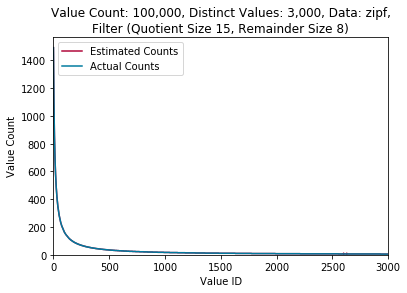

max error: 6
max relative error: 100.0%
Estimation Technique: filter_15_8
Sample Size: 30000000
Mean Error: 0.0127066333333
Mean Squared Error: 3.6403375
Column Size [kB](uint16_t): 200.0



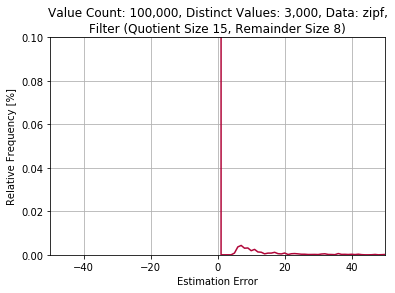

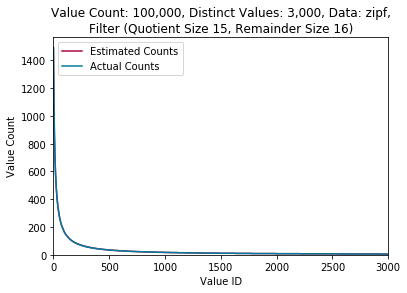

max error: 0
max relative error: 0%
Estimation Technique: filter_15_16
Sample Size: 30000000
Mean Error: 5.88e-05
Mean Squared Error: 0.00236566666667
Column Size [kB](uint16_t): 200.0



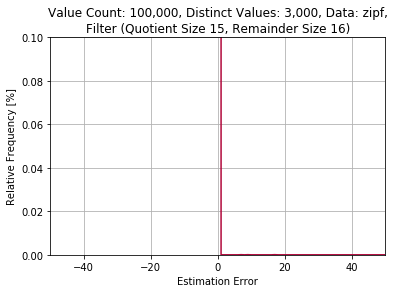

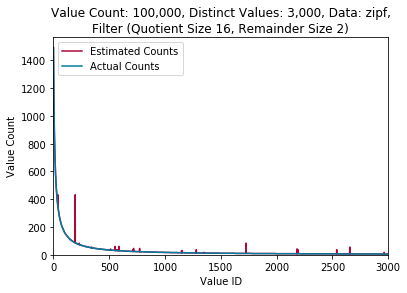

max error: 346
max relative error: 833.333333333%
Estimation Technique: filter_16_2
Sample Size: 30000000
Mean Error: 0.3760854
Mean Squared Error: 103.421360533
Column Size [kB](uint16_t): 200.0



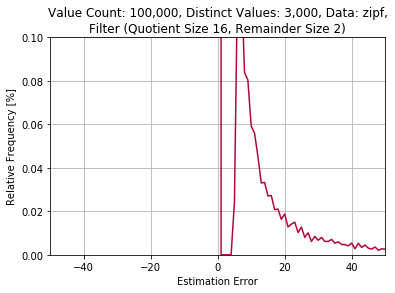

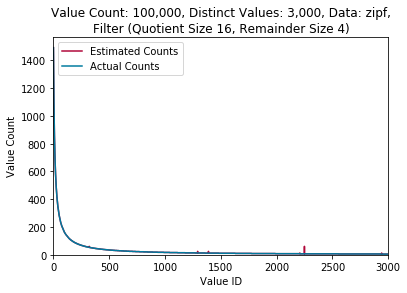

max error: 54
max relative error: 771.428571429%
Estimation Technique: filter_16_4
Sample Size: 30000000
Mean Error: 0.0953644666667
Mean Squared Error: 26.3977683333
Column Size [kB](uint16_t): 200.0



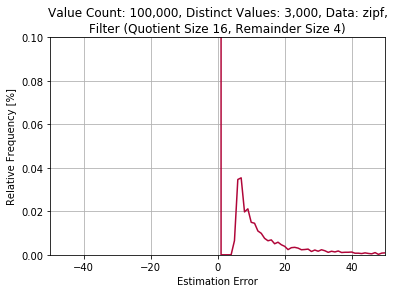

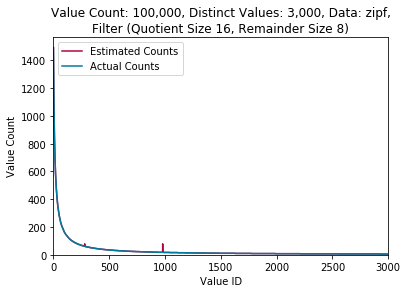

max error: 61
max relative error: 338.888888889%
Estimation Technique: filter_16_8
Sample Size: 30000000
Mean Error: 0.00725146666667
Mean Squared Error: 2.6224266
Column Size [kB](uint16_t): 200.0



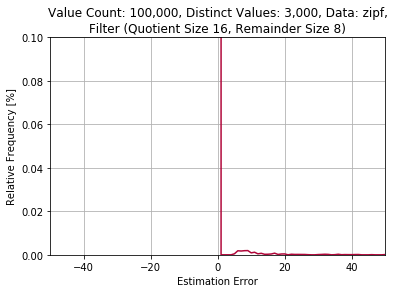

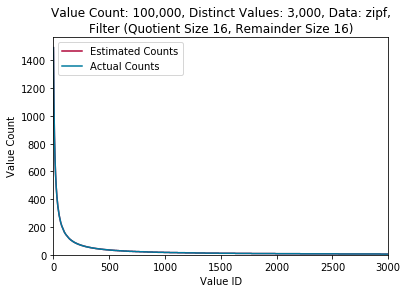

max error: 0
max relative error: 0%
Estimation Technique: filter_16_16
Sample Size: 30000000
Mean Error: 6.36666666667e-05
Mean Squared Error: 0.002594
Column Size [kB](uint16_t): 200.0



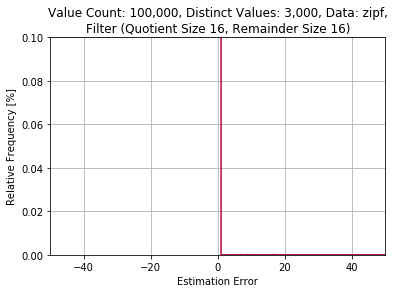

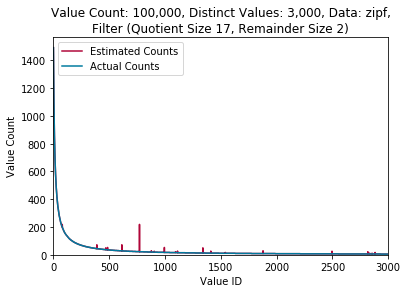

max error: 197
max relative error: 895.454545455%
Estimation Technique: filter_17_2
Sample Size: 30000000
Mean Error: 0.1894965
Mean Squared Error: 51.6260813667
Column Size [kB](uint16_t): 200.0



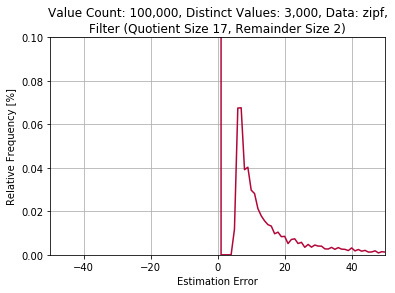

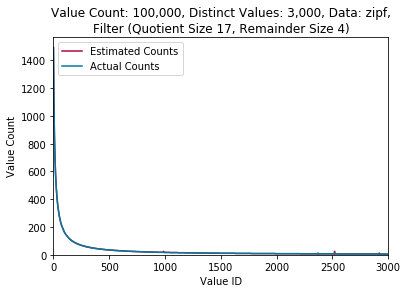

max error: 18
max relative error: 257.142857143%
Estimation Technique: filter_17_4
Sample Size: 30000000
Mean Error: 0.0516858666667
Mean Squared Error: 15.3888806
Column Size [kB](uint16_t): 200.0



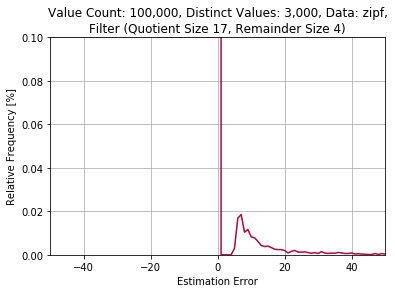

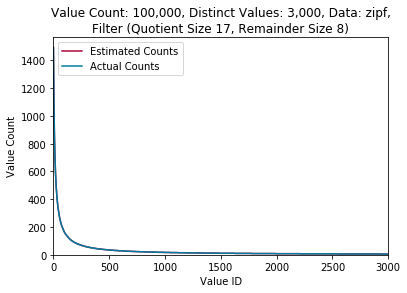

max error: 0
max relative error: 0%
Estimation Technique: filter_17_8
Sample Size: 30000000
Mean Error: 0.0044869
Mean Squared Error: 2.22752983333
Column Size [kB](uint16_t): 200.0



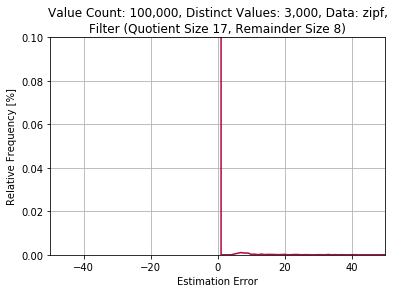

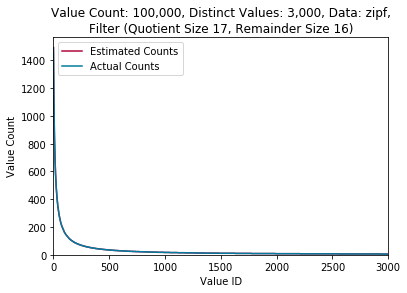

max error: 0
max relative error: 0%
Estimation Technique: filter_17_16
Sample Size: 30000000
Mean Error: 5.85666666667e-05
Mean Squared Error: 0.00245816666667
Column Size [kB](uint16_t): 200.0



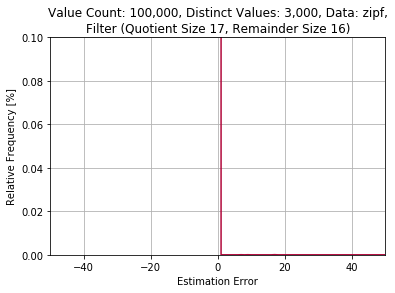

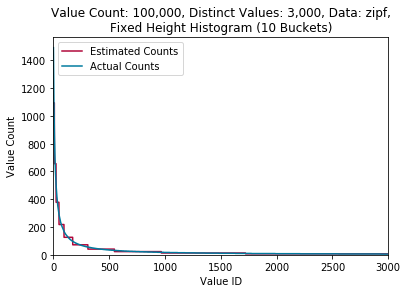

max error: 397
max relative error: 40.0%
Estimation Technique: postgres1_10
Sample Size: 3000
Mean Error: 4.59066666667
Mean Squared Error: 247.644666667
Column Size [kB](uint16_t): 200.0



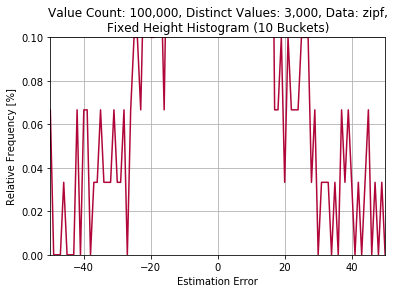

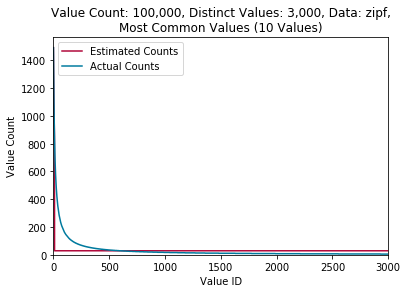

max error: 787
max relative error: 480.0%
Estimation Technique: postgres2_10
Sample Size: 3000
Mean Error: 28.3566666667
Mean Squared Error: 4099.66066667
Column Size [kB](uint16_t): 200.0



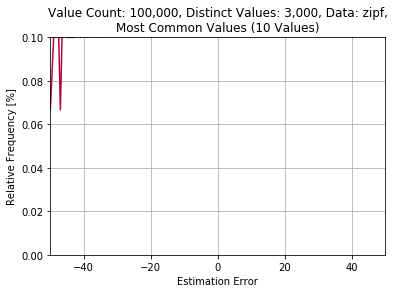

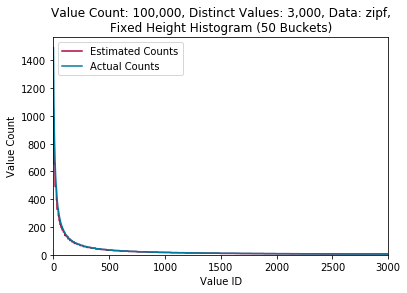

max error: 506
max relative error: 34.1365461847%
Estimation Technique: postgres1_50
Sample Size: 3000
Mean Error: 2.625
Mean Squared Error: 358.069666667
Column Size [kB](uint16_t): 200.0



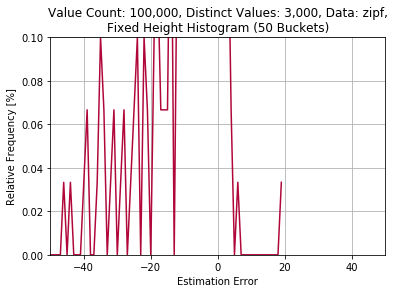

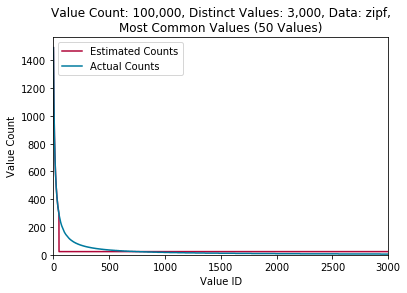

max error: 267
max relative error: 360.0%
Estimation Technique: postgres2_50
Sample Size: 3000
Mean Error: 19.0266666667
Mean Squared Error: 1167.63266667
Column Size [kB](uint16_t): 200.0



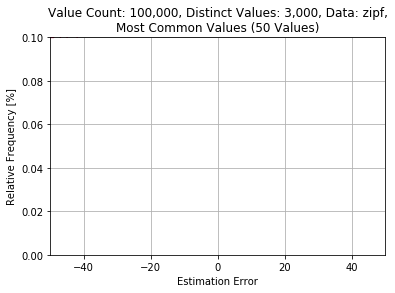

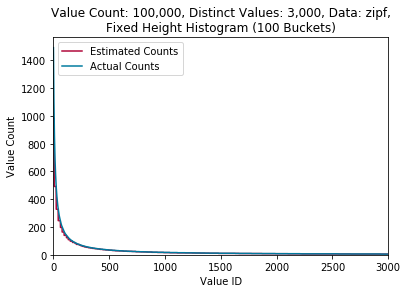

max error: 506
max relative error: 47.8813559322%
Estimation Technique: postgres1_100
Sample Size: 3000
Mean Error: 3.609
Mean Squared Error: 568.384333333
Column Size [kB](uint16_t): 200.0



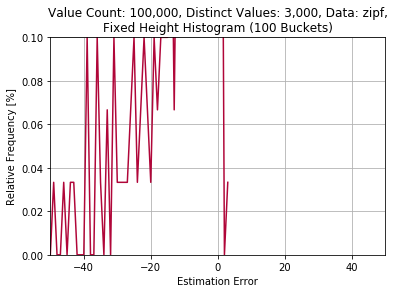

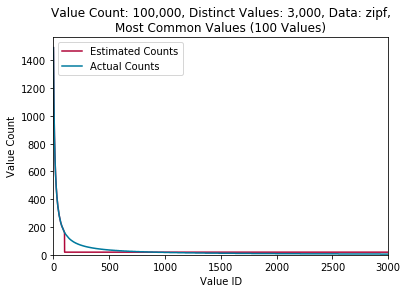

max error: 141
max relative error: 280.0%
Estimation Technique: postgres2_100
Sample Size: 3000
Mean Error: 13.921
Mean Squared Error: 530.070333333
Column Size [kB](uint16_t): 200.0



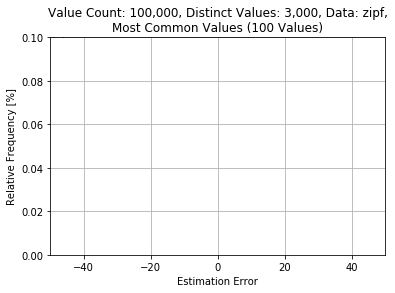

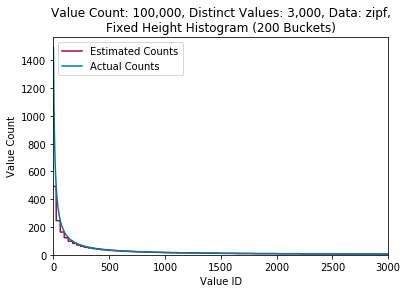

max error: 999
max relative error: 67.0020120724%
Estimation Technique: postgres1_200
Sample Size: 3000
Mean Error: 5.82766666667
Mean Squared Error: 1803.72766667
Column Size [kB](uint16_t): 200.0



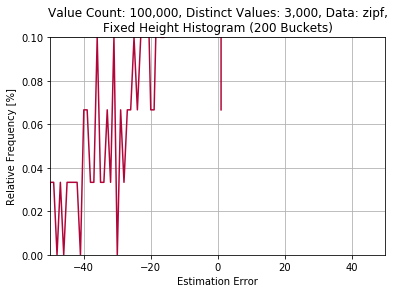

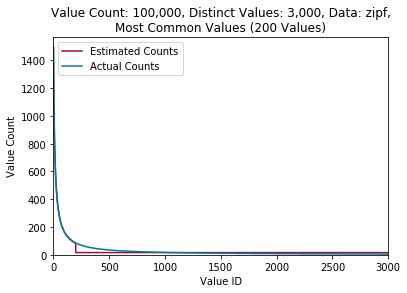

max error: 68
max relative error: 220.0%
Estimation Technique: postgres2_200
Sample Size: 3000
Mean Error: 9.50233333333
Mean Squared Error: 203.437666667
Column Size [kB](uint16_t): 200.0



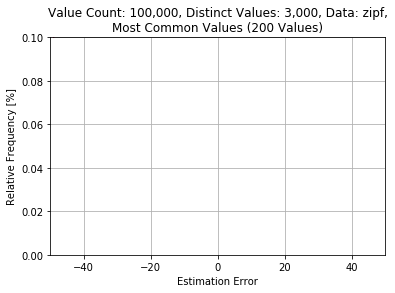

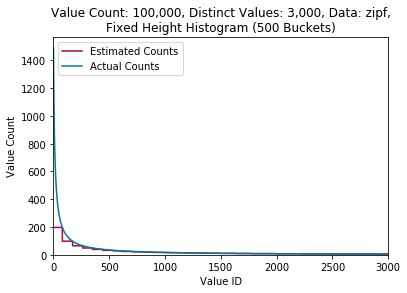

max error: 1294
max relative error: 86.7873910127%
Estimation Technique: postgres1_500
Sample Size: 3000
Mean Error: 10.1666666667
Mean Squared Error: 4376.00933333
Column Size [kB](uint16_t): 200.0



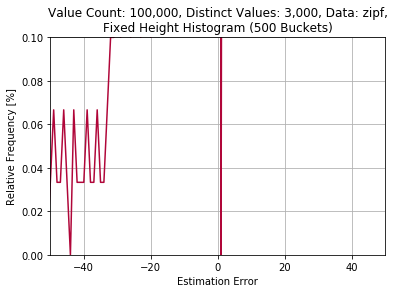

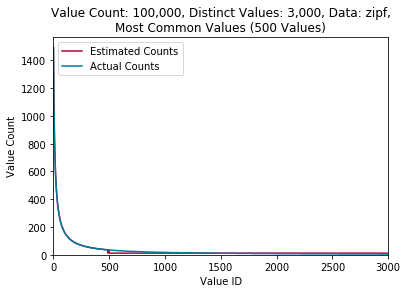

max error: 23
max relative error: 140.0%
Estimation Technique: postgres2_500
Sample Size: 3000
Mean Error: 4.467
Mean Squared Error: 39.6796666667
Column Size [kB](uint16_t): 200.0



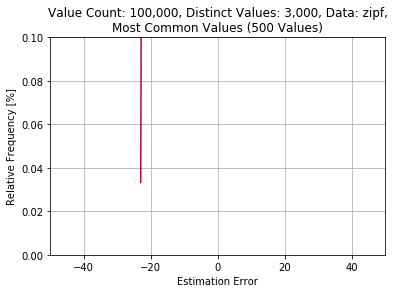

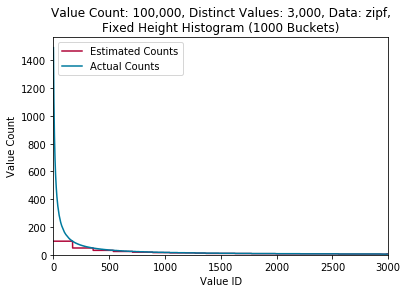

max error: 1393
max relative error: 93.4272300469%
Estimation Technique: postgres1_1000
Sample Size: 3000
Mean Error: 13.5903333333
Mean Squared Error: 6080.01833333
Column Size [kB](uint16_t): 200.0



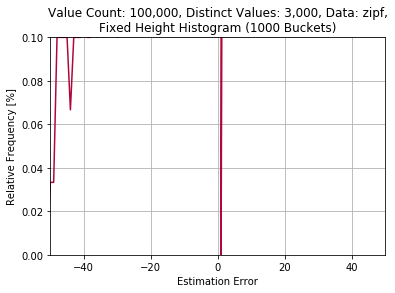

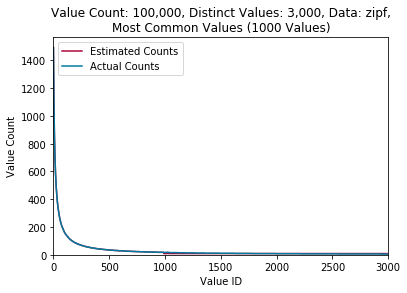

max error: 8
max relative error: 80.0%
Estimation Technique: postgres2_1000
Sample Size: 3000
Mean Error: 1.72033333333
Mean Squared Error: 6.71433333333
Column Size [kB](uint16_t): 200.0



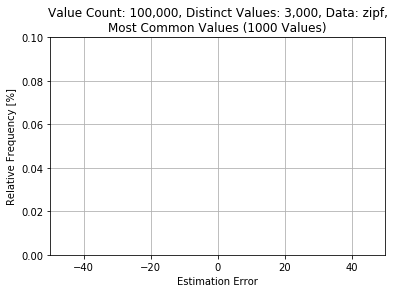

,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,Uniform Estimation,4.0,33.858333,8194.794333
1,Fixed Height Histogram (10 Buckets),40.0,33.936000,8175.040667
2,Fixed Height Histogram (50 Buckets),200.0,33.527333,8092.314667
3,Fixed Height Histogram (100 Buckets),400.0,31.721000,7861.597667
4,Most Common Values (10 Values),40.0,28.356667,4099.660667
5,Most Common Values (50 Values),200.0,19.026667,1167.632667
6,Most Common Values (100 Values),400.0,13.921000,530.070333
7,"Filter (Quotient Size 14, Remainder Size 4)",12288.0,0.374900,111.854384
8,"Filter (Quotient Size 14, Remainder Size 8)",20480.0,0.023404,5.706722
9,"Filter (Quotient Size 14, Remainder Size 16)",36864.0,0.000025,0.000320


,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,"Filter (Quotient Size 14, Remainder Size 4)",12288.0,0.374900,111.854384
1,"Filter (Quotient Size 14, Remainder Size 8)",20480.0,0.023404,5.706722
2,"Filter (Quotient Size 14, Remainder Size 16)",36864.0,0.000025,0.000320
3,"Filter (Quotient Size 15, Remainder Size 2)",16384.0,0.748894,218.276544
4,"Filter (Quotient Size 15, Remainder Size 4)",24576.0,0.186855,57.573207
5,"Filter (Quotient Size 15, Remainder Size 8)",40960.0,0.012668,3.850359
6,"Filter (Quotient Size 15, Remainder Size 16)",73728.0,0.000025,0.000348
7,"Filter (Quotient Size 16, Remainder Size 2)",32768.0,0.375522,114.073794
8,"Filter (Quotient Size 16, Remainder Size 4)",49152.0,0.096803,30.653920
9,"Filter (Quotient Size 16, Remainder Size 8)",81920.0,0.006781,2.577191


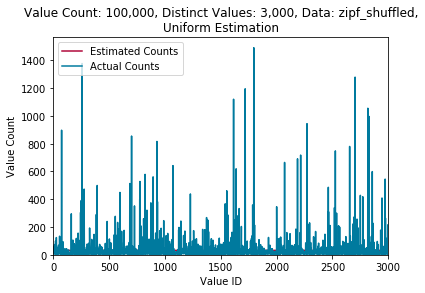

max error: 1459
max relative error: 540.0%
Estimation Technique: uniform
Sample Size: 3000
Mean Error: 33.8583333333
Mean Squared Error: 8194.79433333
Column Size [kB](uint16_t): 200.0



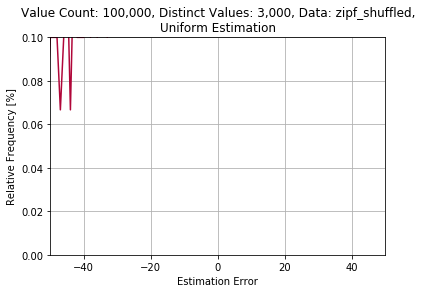

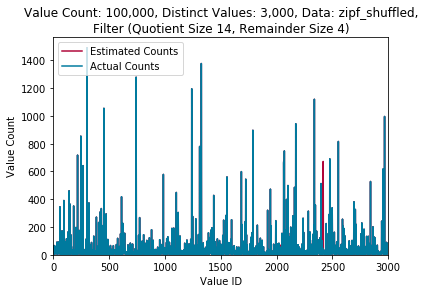

max error: 665
max relative error: 9500.0%
Estimation Technique: filter_14_4
Sample Size: 30000000
Mean Error: 0.374900366667
Mean Squared Error: 111.854383967
Column Size [kB](uint16_t): 200.0



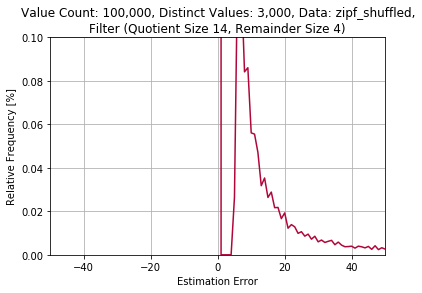

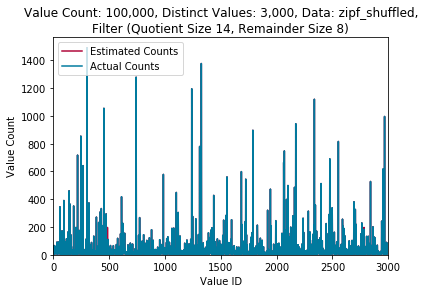

max error: 185
max relative error: 1541.66666667%
Estimation Technique: filter_14_8
Sample Size: 30000000
Mean Error: 0.0234043
Mean Squared Error: 5.7067217
Column Size [kB](uint16_t): 200.0



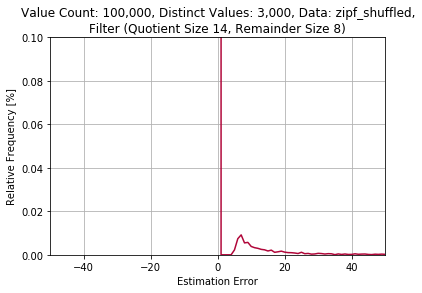

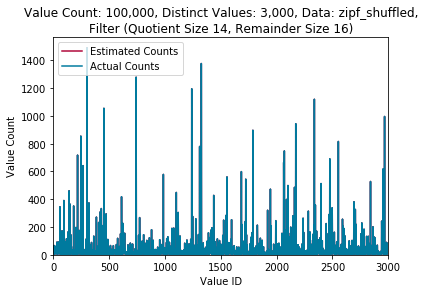

max error: 0
max relative error: 0%
Estimation Technique: filter_14_16
Sample Size: 30000000
Mean Error: 2.53e-05
Mean Squared Error: 0.000320166666667
Column Size [kB](uint16_t): 200.0



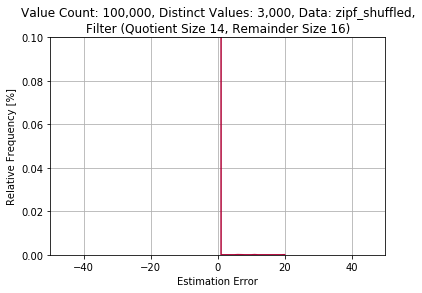

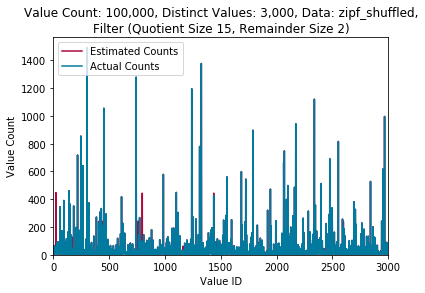

max error: 438
max relative error: 4380.0%
Estimation Technique: filter_15_2
Sample Size: 30000000
Mean Error: 0.748894466667
Mean Squared Error: 218.276544267
Column Size [kB](uint16_t): 200.0



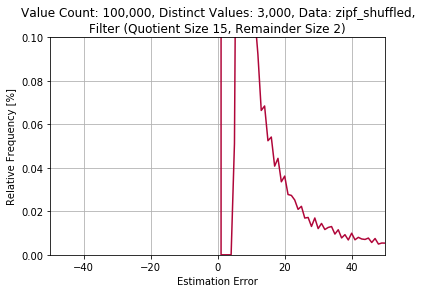

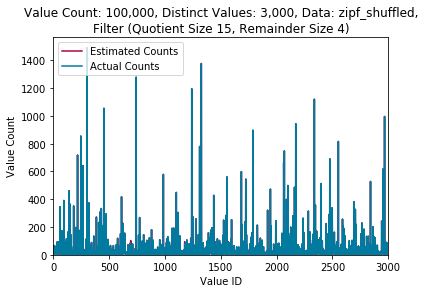

max error: 112
max relative error: 1400.0%
Estimation Technique: filter_15_4
Sample Size: 30000000
Mean Error: 0.186855266667
Mean Squared Error: 57.573207
Column Size [kB](uint16_t): 200.0



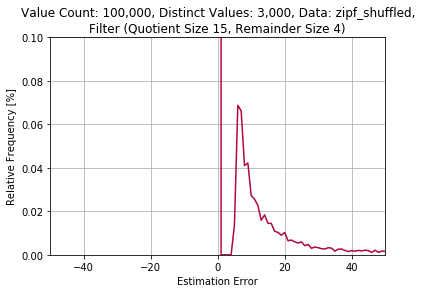

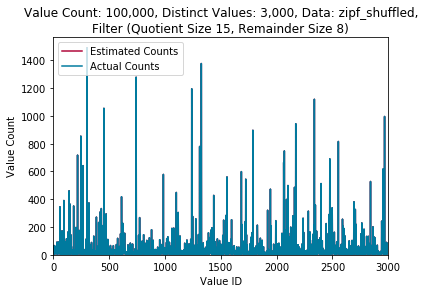

max error: 15
max relative error: 166.666666667%
Estimation Technique: filter_15_8
Sample Size: 30000000
Mean Error: 0.0126676333333
Mean Squared Error: 3.85035896667
Column Size [kB](uint16_t): 200.0



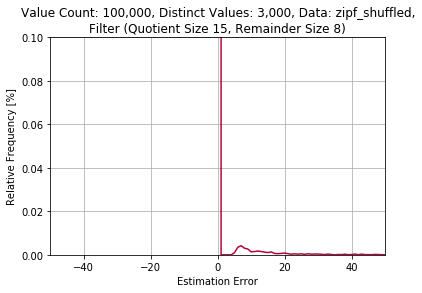

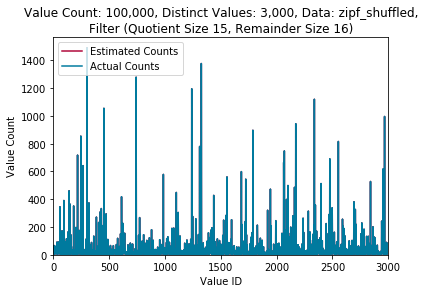

max error: 0
max relative error: 0%
Estimation Technique: filter_15_16
Sample Size: 30000000
Mean Error: 2.47e-05
Mean Squared Error: 0.0003479
Column Size [kB](uint16_t): 200.0



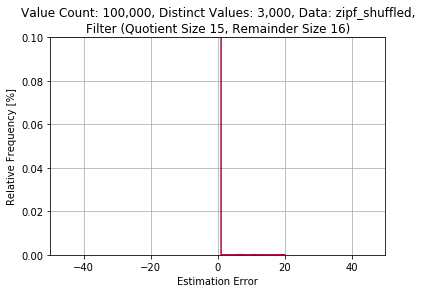

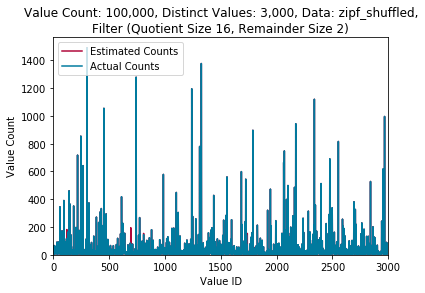

max error: 183
max relative error: 1611.11111111%
Estimation Technique: filter_16_2
Sample Size: 30000000
Mean Error: 0.375522233333
Mean Squared Error: 114.073793967
Column Size [kB](uint16_t): 200.0



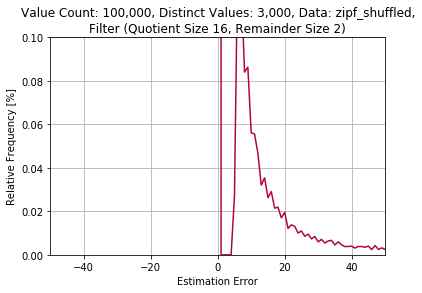

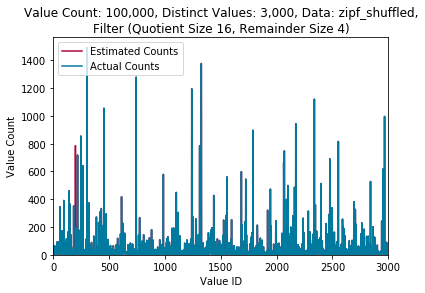

max error: 780
max relative error: 13000.0%
Estimation Technique: filter_16_4
Sample Size: 30000000
Mean Error: 0.0968028666667
Mean Squared Error: 30.6539198
Column Size [kB](uint16_t): 200.0



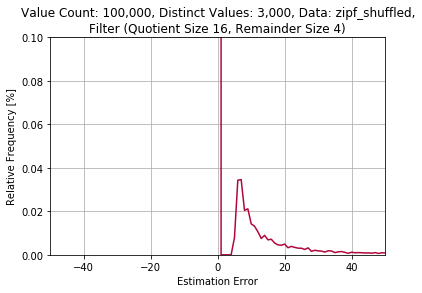

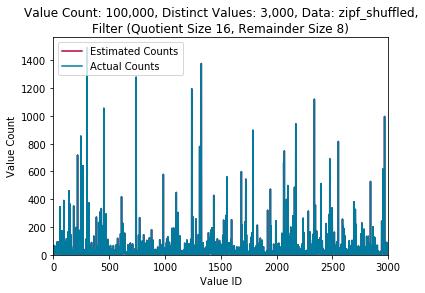

max error: 0
max relative error: 0%
Estimation Technique: filter_16_8
Sample Size: 30000000
Mean Error: 0.00678123333333
Mean Squared Error: 2.57719103333
Column Size [kB](uint16_t): 200.0



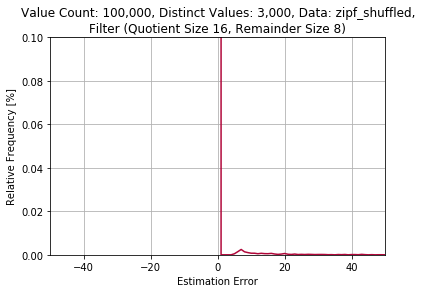

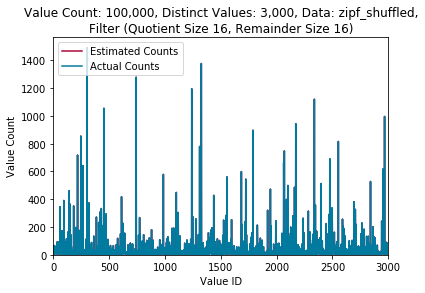

max error: 0
max relative error: 0%
Estimation Technique: filter_16_16
Sample Size: 30000000
Mean Error: 3e-05
Mean Squared Error: 0.000423466666667
Column Size [kB](uint16_t): 200.0



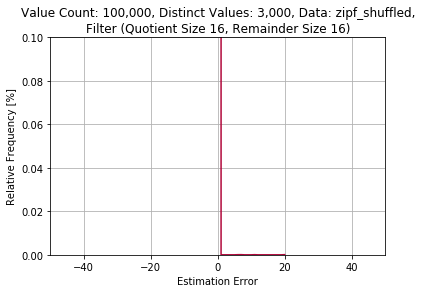

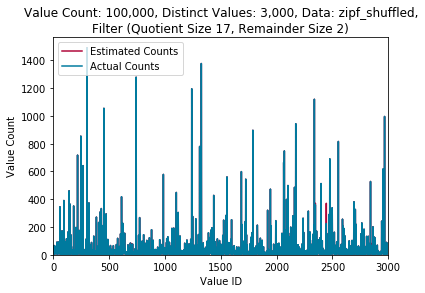

max error: 359
max relative error: 2991.66666667%
Estimation Technique: filter_17_2
Sample Size: 30000000
Mean Error: 0.1852114
Mean Squared Error: 54.8254929333
Column Size [kB](uint16_t): 200.0



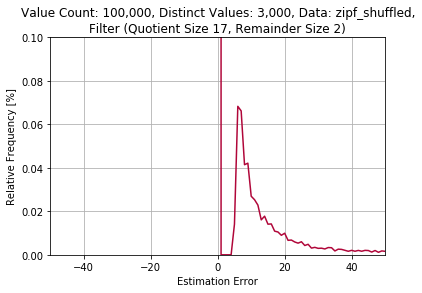

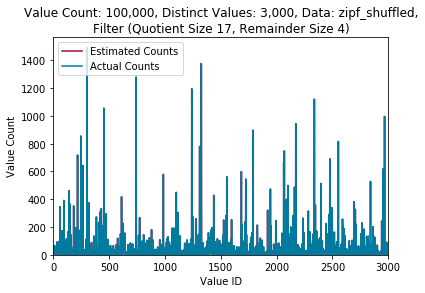

max error: 8
max relative error: 133.333333333%
Estimation Technique: filter_17_4
Sample Size: 30000000
Mean Error: 0.0466183
Mean Squared Error: 11.4711169
Column Size [kB](uint16_t): 200.0



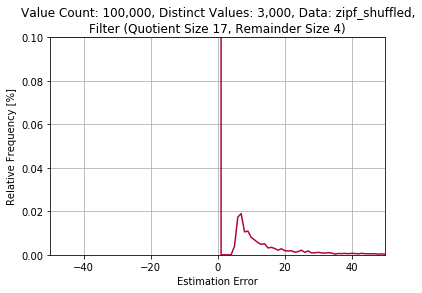

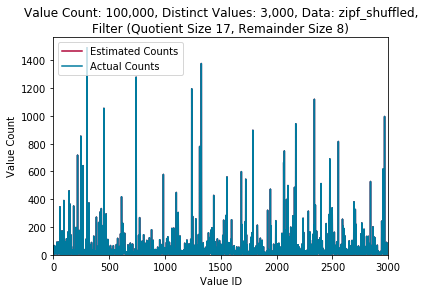

max error: 0
max relative error: 0%
Estimation Technique: filter_17_8
Sample Size: 30000000
Mean Error: 0.00227386666667
Mean Squared Error: 0.1973684
Column Size [kB](uint16_t): 200.0



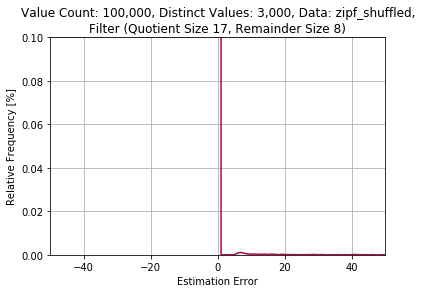

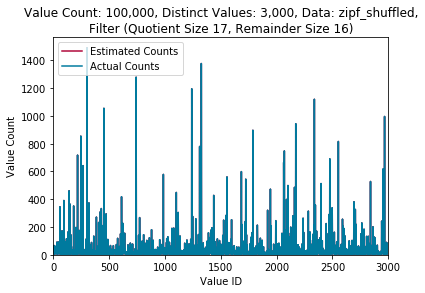

max error: 0
max relative error: 0%
Estimation Technique: filter_17_16
Sample Size: 30000000
Mean Error: 3.43e-05
Mean Squared Error: 0.000469833333333
Column Size [kB](uint16_t): 200.0



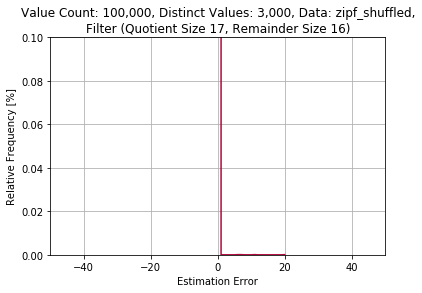

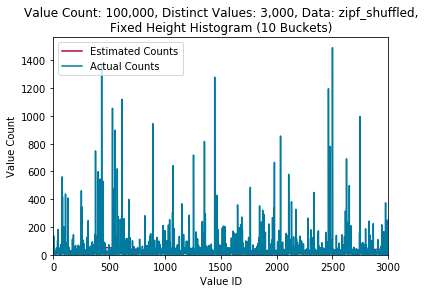

max error: 1456
max relative error: 920.0%
Estimation Technique: postgres1_10
Sample Size: 3000
Mean Error: 33.936
Mean Squared Error: 8175.04066667
Column Size [kB](uint16_t): 200.0



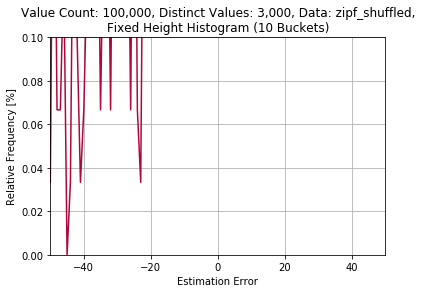

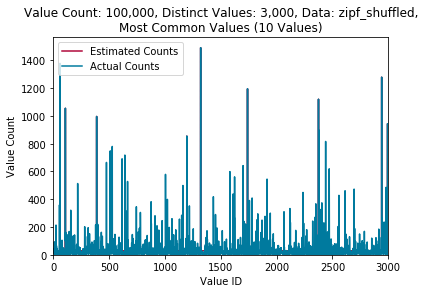

max error: 787
max relative error: 480.0%
Estimation Technique: postgres2_10
Sample Size: 3000
Mean Error: 28.3566666667
Mean Squared Error: 4099.66066667
Column Size [kB](uint16_t): 200.0



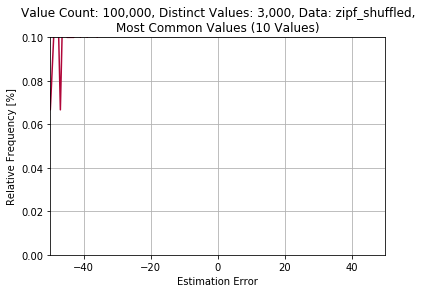

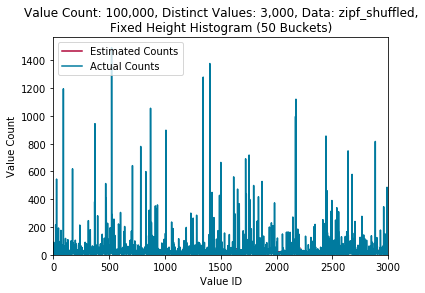

max error: 1432
max relative error: 3183.33333333%
Estimation Technique: postgres1_50
Sample Size: 3000
Mean Error: 33.5273333333
Mean Squared Error: 8092.31466667
Column Size [kB](uint16_t): 200.0



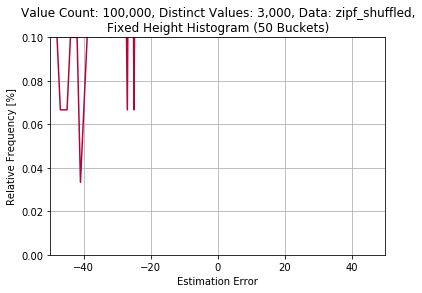

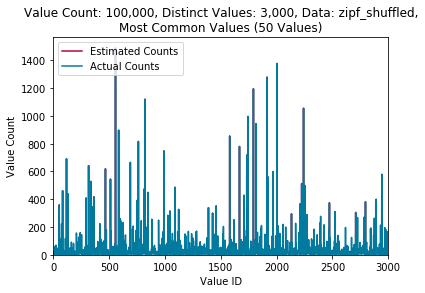

max error: 267
max relative error: 360.0%
Estimation Technique: postgres2_50
Sample Size: 3000
Mean Error: 19.0266666667
Mean Squared Error: 1167.63266667
Column Size [kB](uint16_t): 200.0



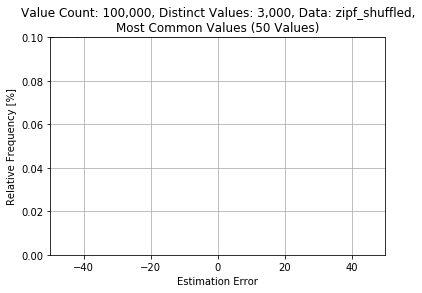

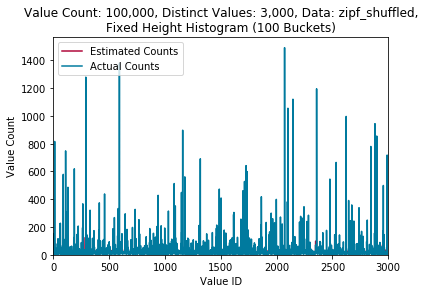

max error: 1445
max relative error: 2080.0%
Estimation Technique: postgres1_100
Sample Size: 3000
Mean Error: 31.721
Mean Squared Error: 7861.59766667
Column Size [kB](uint16_t): 200.0



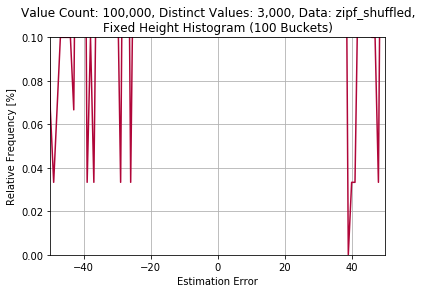

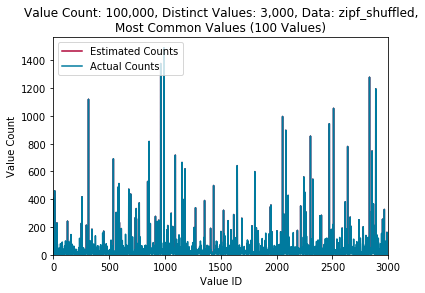

max error: 141
max relative error: 280.0%
Estimation Technique: postgres2_100
Sample Size: 3000
Mean Error: 13.921
Mean Squared Error: 530.070333333
Column Size [kB](uint16_t): 200.0



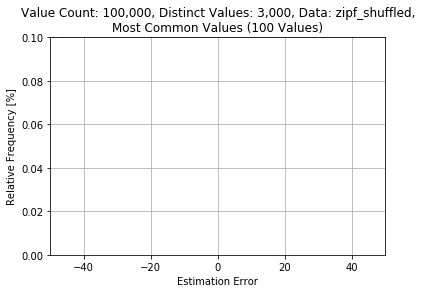

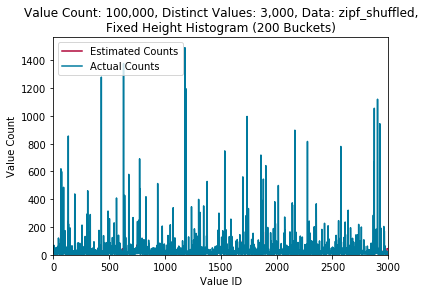

max error: 1473
max relative error: 2975.0%
Estimation Technique: postgres1_200
Sample Size: 3000
Mean Error: 29.0363333333
Mean Squared Error: 7706.20033333
Column Size [kB](uint16_t): 200.0



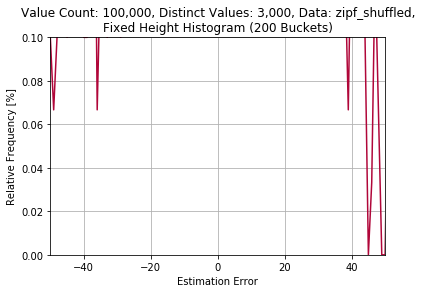

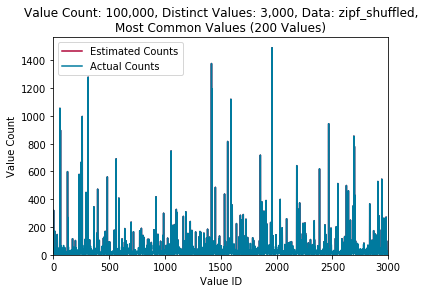

max error: 68
max relative error: 220.0%
Estimation Technique: postgres2_200
Sample Size: 3000
Mean Error: 9.50233333333
Mean Squared Error: 203.437666667
Column Size [kB](uint16_t): 200.0



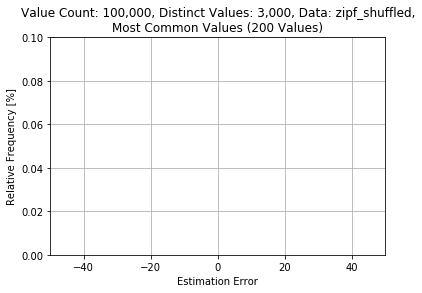

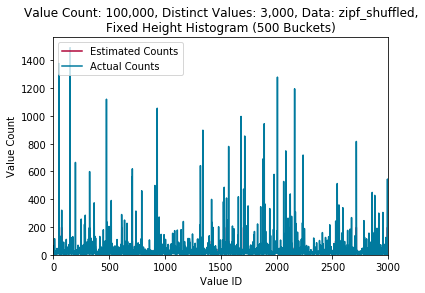

max error: 1459
max relative error: 1860.0%
Estimation Technique: postgres1_500
Sample Size: 3000
Mean Error: 25.6483333333
Mean Squared Error: 7087.44633333
Column Size [kB](uint16_t): 200.0



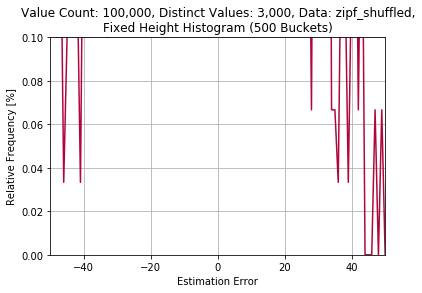

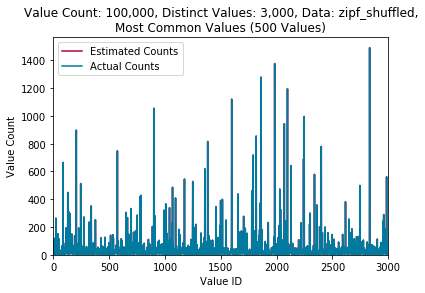

max error: 23
max relative error: 140.0%
Estimation Technique: postgres2_500
Sample Size: 3000
Mean Error: 4.467
Mean Squared Error: 39.6796666667
Column Size [kB](uint16_t): 200.0



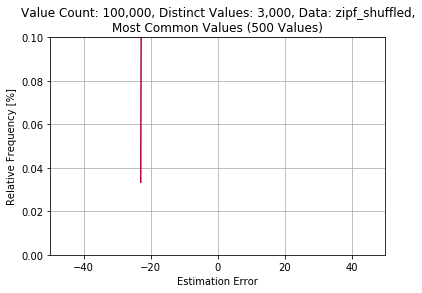

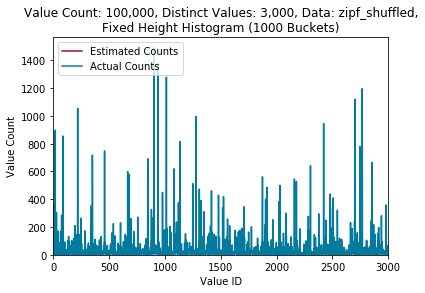

max error: 1477
max relative error: 880.0%
Estimation Technique: postgres1_1000
Sample Size: 3000
Mean Error: 24.072
Mean Squared Error: 7769.62266667
Column Size [kB](uint16_t): 200.0



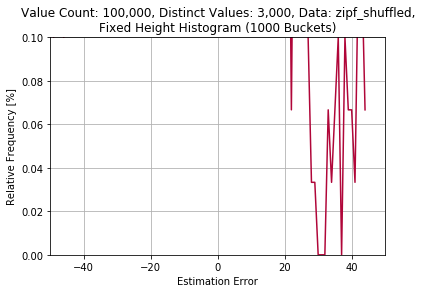

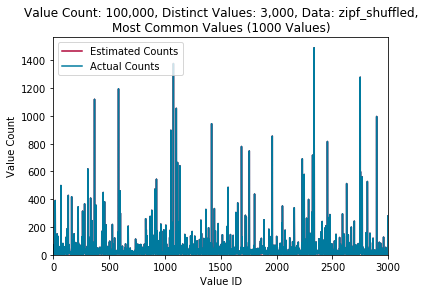

max error: 8
max relative error: 80.0%
Estimation Technique: postgres2_1000
Sample Size: 3000
Mean Error: 1.72033333333
Mean Squared Error: 6.71433333333
Column Size [kB](uint16_t): 200.0



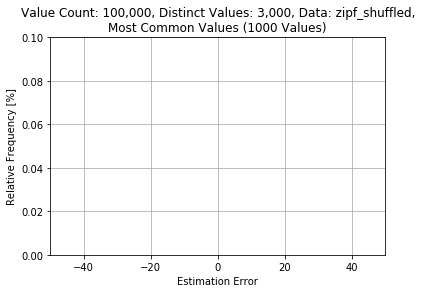

,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,Uniform Estimation,4.0,0.000000,0.000000
1,Fixed Height Histogram (10 Buckets),40.0,0.000000,0.000000
2,Fixed Height Histogram (50 Buckets),200.0,0.000000,0.000000
3,Fixed Height Histogram (100 Buckets),400.0,0.000000,0.000000
4,Most Common Values (10 Values),40.0,0.000000,0.000000
5,Most Common Values (50 Values),200.0,0.000000,0.000000
6,Most Common Values (100 Values),400.0,0.000000,0.000000
7,"Filter (Quotient Size 14, Remainder Size 4)",12288.0,0.376541,12.574175
8,"Filter (Quotient Size 14, Remainder Size 8)",20480.0,0.024759,0.817040
9,"Filter (Quotient Size 14, Remainder Size 16)",36864.0,0.000086,0.002831


,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,"Filter (Quotient Size 14, Remainder Size 4)",12288.0,0.376541,12.574175
1,"Filter (Quotient Size 14, Remainder Size 8)",20480.0,0.024759,0.817040
2,"Filter (Quotient Size 14, Remainder Size 16)",36864.0,0.000086,0.002831
3,"Filter (Quotient Size 15, Remainder Size 2)",16384.0,0.753757,25.415227
4,"Filter (Quotient Size 15, Remainder Size 4)",24576.0,0.187403,6.245488
5,"Filter (Quotient Size 15, Remainder Size 8)",40960.0,0.012300,0.405907
6,"Filter (Quotient Size 15, Remainder Size 16)",73728.0,0.000103,0.003412
7,"Filter (Quotient Size 16, Remainder Size 2)",32768.0,0.378222,12.622454
8,"Filter (Quotient Size 16, Remainder Size 4)",49152.0,0.094677,3.134142
9,"Filter (Quotient Size 16, Remainder Size 8)",81920.0,0.005951,0.196383


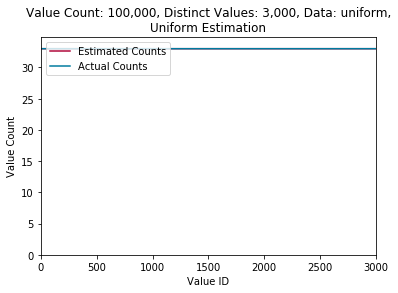

max error: 0
max relative error: 0%
Estimation Technique: uniform
Sample Size: 3000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



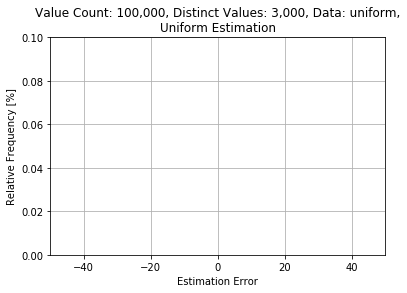

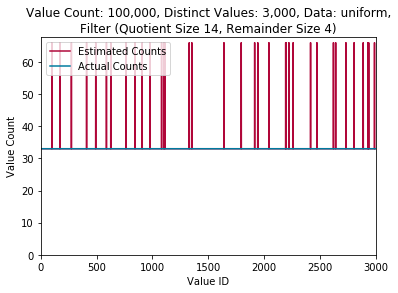

max error: 33
max relative error: 100.0%
Estimation Technique: filter_14_4
Sample Size: 30000000
Mean Error: 0.376541
Mean Squared Error: 12.5741748
Column Size [kB](uint16_t): 200.0



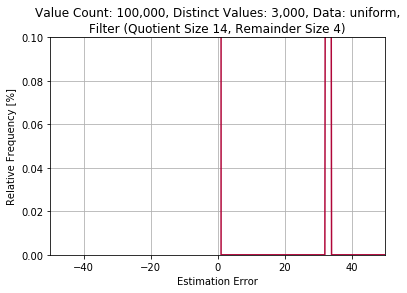

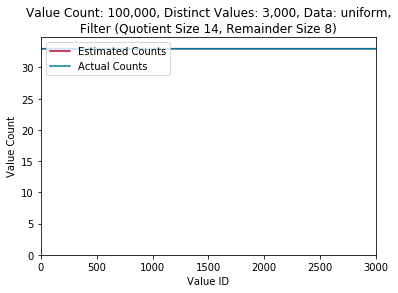

max error: 0
max relative error: 0%
Estimation Technique: filter_14_8
Sample Size: 30000000
Mean Error: 0.0247588
Mean Squared Error: 0.8170404
Column Size [kB](uint16_t): 200.0



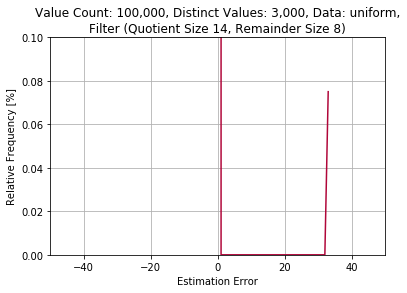

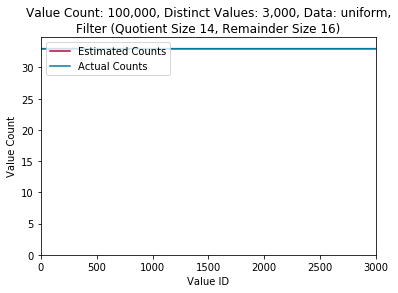

max error: 0
max relative error: 0%
Estimation Technique: filter_14_16
Sample Size: 30000000
Mean Error: 8.58e-05
Mean Squared Error: 0.0028314
Column Size [kB](uint16_t): 200.0



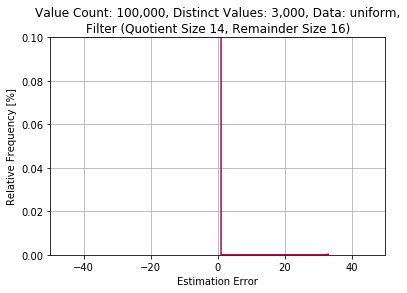

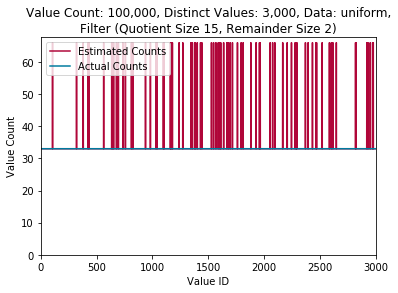

max error: 33
max relative error: 100.0%
Estimation Technique: filter_15_2
Sample Size: 30000000
Mean Error: 0.7537574
Mean Squared Error: 25.4152272
Column Size [kB](uint16_t): 200.0



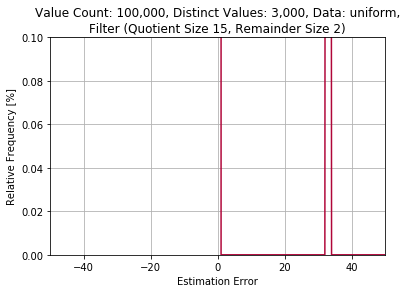

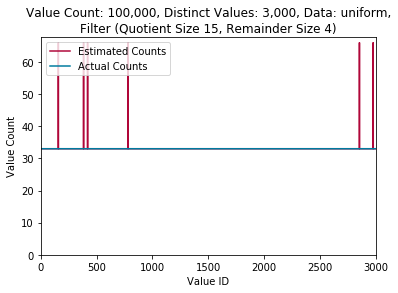

max error: 33
max relative error: 100.0%
Estimation Technique: filter_15_4
Sample Size: 30000000
Mean Error: 0.1874026
Mean Squared Error: 6.2454876
Column Size [kB](uint16_t): 200.0



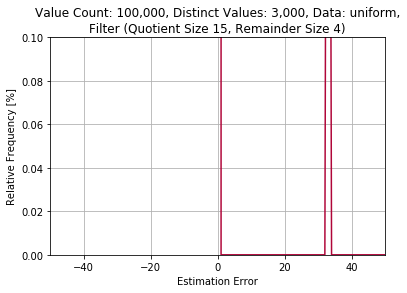

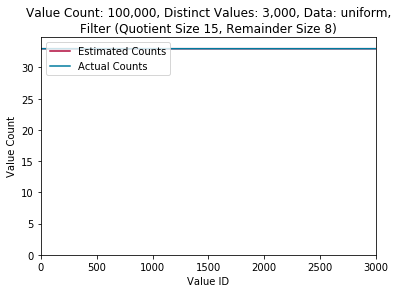

max error: 0
max relative error: 0%
Estimation Technique: filter_15_8
Sample Size: 30000000
Mean Error: 0.0123002
Mean Squared Error: 0.4059066
Column Size [kB](uint16_t): 200.0



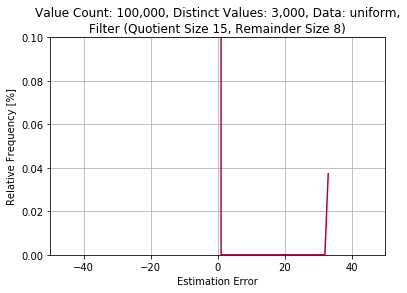

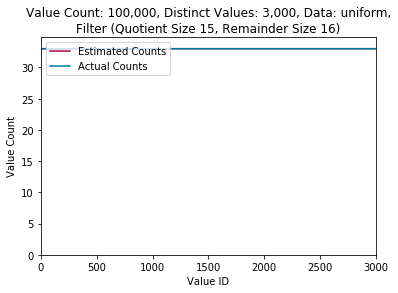

max error: 0
max relative error: 0%
Estimation Technique: filter_15_16
Sample Size: 30000000
Mean Error: 0.0001034
Mean Squared Error: 0.0034122
Column Size [kB](uint16_t): 200.0



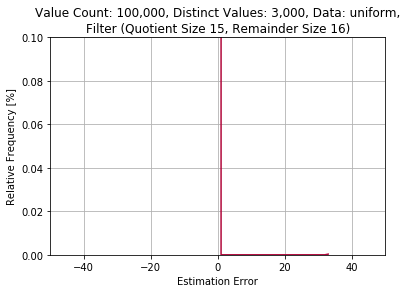

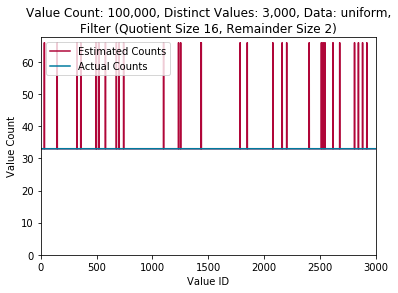

max error: 33
max relative error: 100.0%
Estimation Technique: filter_16_2
Sample Size: 30000000
Mean Error: 0.3782218
Mean Squared Error: 12.6224538
Column Size [kB](uint16_t): 200.0



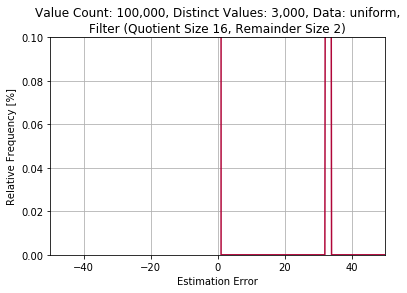

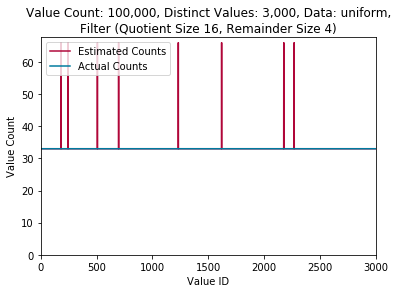

max error: 33
max relative error: 100.0%
Estimation Technique: filter_16_4
Sample Size: 30000000
Mean Error: 0.094677
Mean Squared Error: 3.134142
Column Size [kB](uint16_t): 200.0



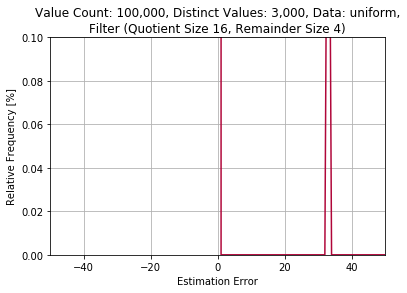

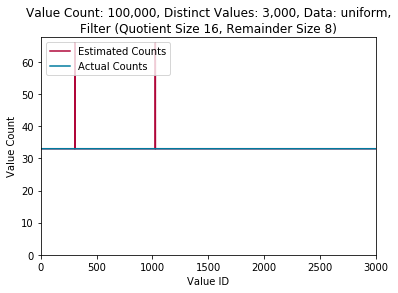

max error: 33
max relative error: 100.0%
Estimation Technique: filter_16_8
Sample Size: 30000000
Mean Error: 0.005951
Mean Squared Error: 0.196383
Column Size [kB](uint16_t): 200.0



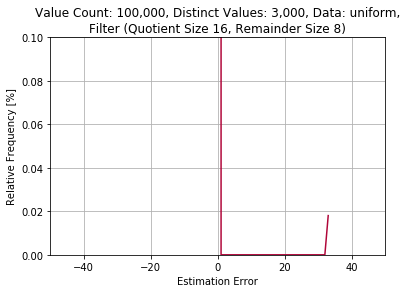

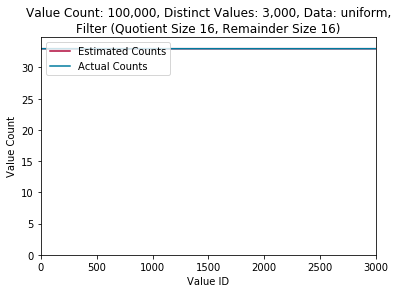

max error: 0
max relative error: 0%
Estimation Technique: filter_16_16
Sample Size: 30000000
Mean Error: 7.92e-05
Mean Squared Error: 0.0026136
Column Size [kB](uint16_t): 200.0



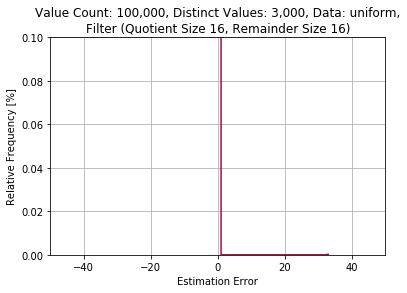

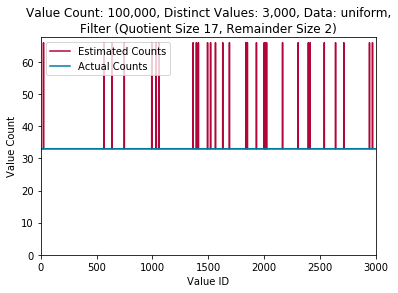

max error: 33
max relative error: 100.0%
Estimation Technique: filter_17_2
Sample Size: 30000000
Mean Error: 0.1876204
Mean Squared Error: 6.2541996
Column Size [kB](uint16_t): 200.0



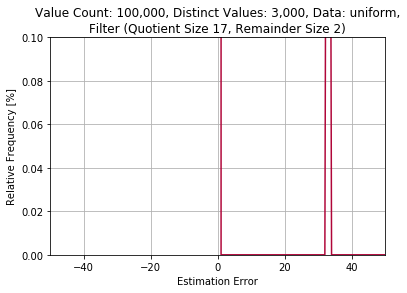

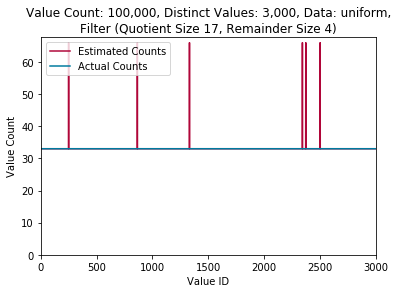

max error: 33
max relative error: 100.0%
Estimation Technique: filter_17_4
Sample Size: 30000000
Mean Error: 0.0490028
Mean Squared Error: 1.6194882
Column Size [kB](uint16_t): 200.0



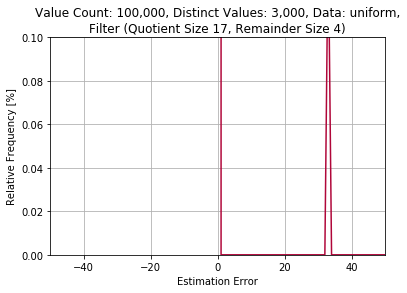

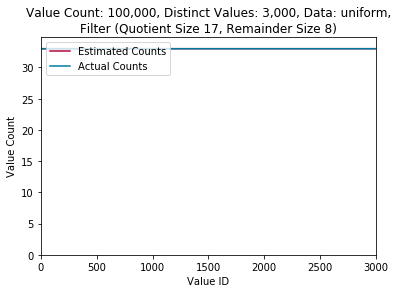

max error: 0
max relative error: 0%
Estimation Technique: filter_17_8
Sample Size: 30000000
Mean Error: 0.002717
Mean Squared Error: 0.089661
Column Size [kB](uint16_t): 200.0



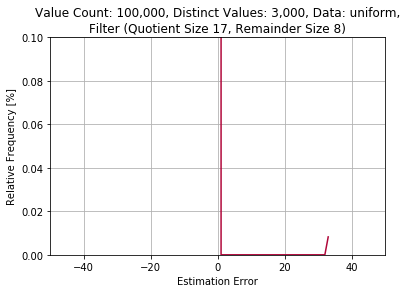

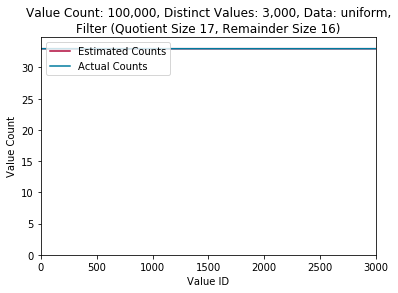

max error: 0
max relative error: 0%
Estimation Technique: filter_17_16
Sample Size: 30000000
Mean Error: 7.92e-05
Mean Squared Error: 0.0026136
Column Size [kB](uint16_t): 200.0



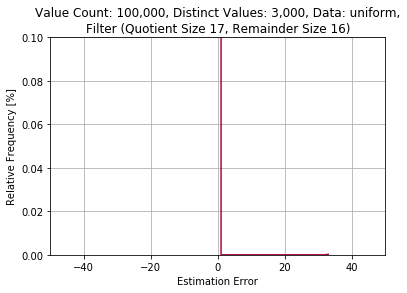

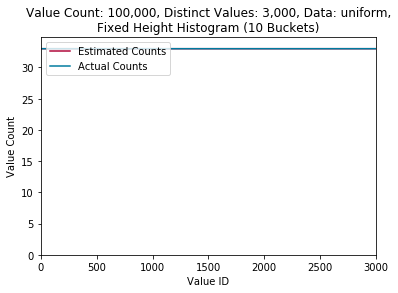

max error: 0
max relative error: 0%
Estimation Technique: postgres1_10
Sample Size: 3000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



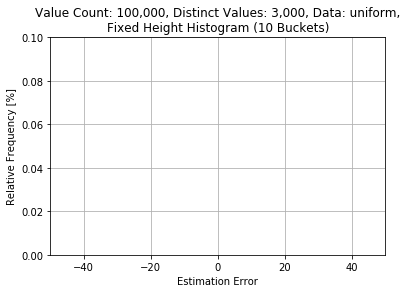

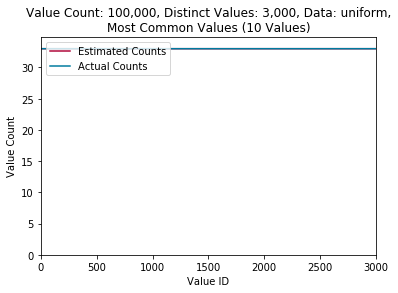

max error: 0
max relative error: 0%
Estimation Technique: postgres2_10
Sample Size: 3000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



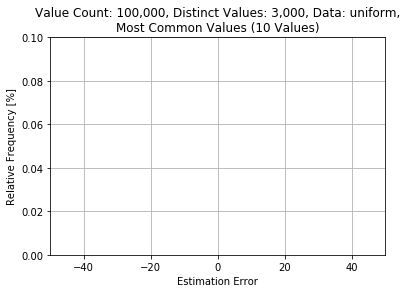

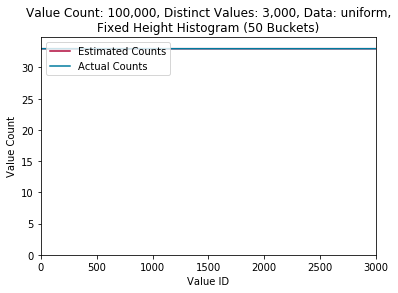

max error: 0
max relative error: 0%
Estimation Technique: postgres1_50
Sample Size: 3000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



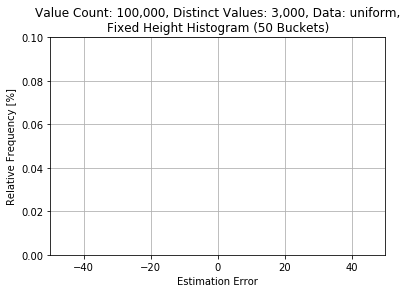

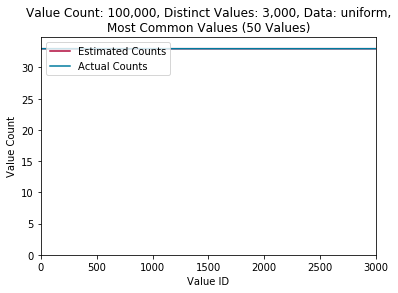

max error: 0
max relative error: 0%
Estimation Technique: postgres2_50
Sample Size: 3000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



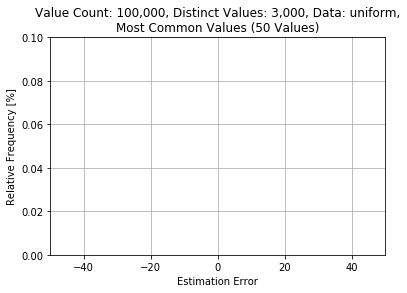

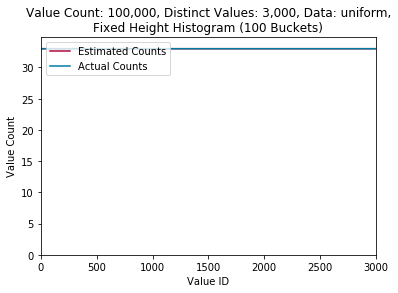

max error: 0
max relative error: 0%
Estimation Technique: postgres1_100
Sample Size: 3000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



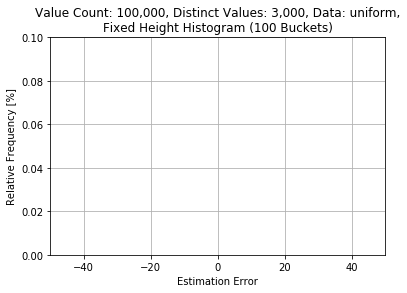

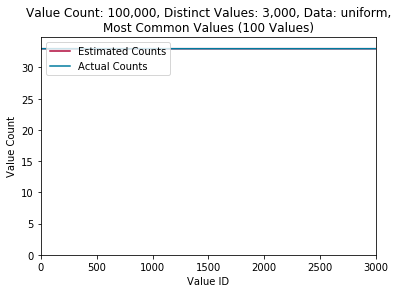

max error: 0
max relative error: 0%
Estimation Technique: postgres2_100
Sample Size: 3000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



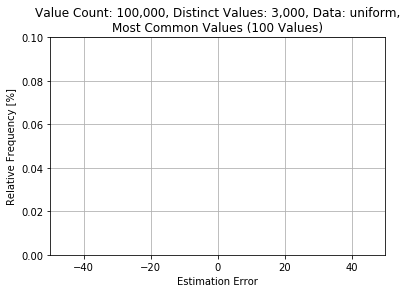

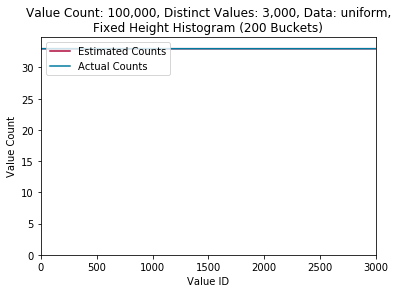

max error: 0
max relative error: 0%
Estimation Technique: postgres1_200
Sample Size: 3000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



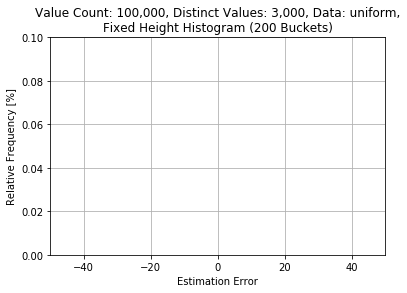

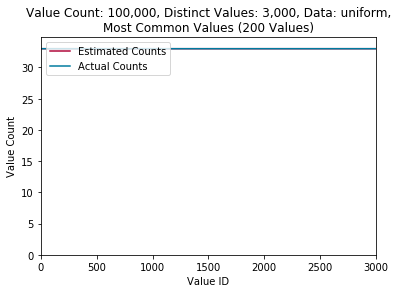

max error: 0
max relative error: 0%
Estimation Technique: postgres2_200
Sample Size: 3000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



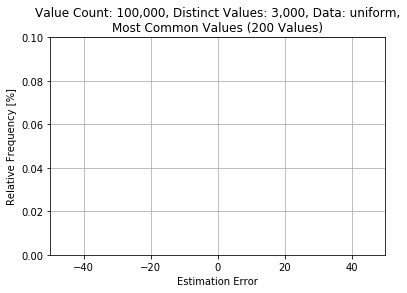

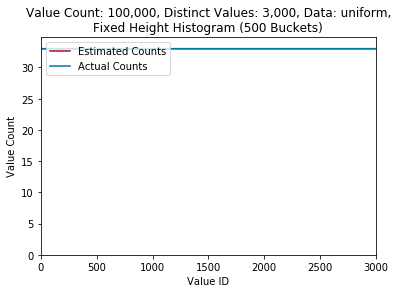

max error: 0
max relative error: 0%
Estimation Technique: postgres1_500
Sample Size: 3000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



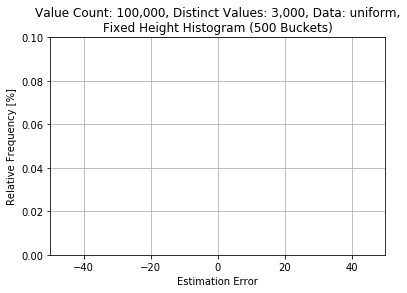

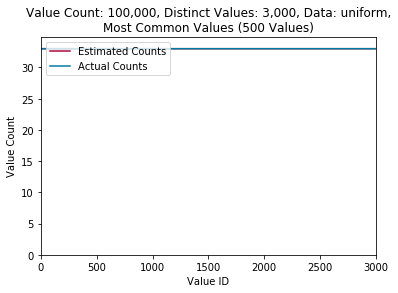

max error: 0
max relative error: 0%
Estimation Technique: postgres2_500
Sample Size: 3000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



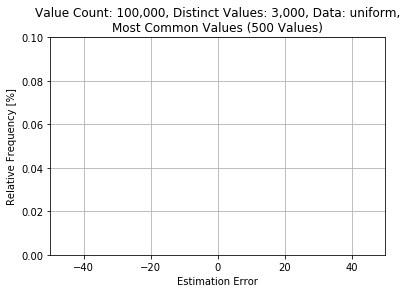

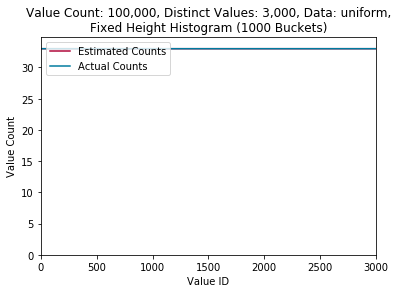

max error: 0
max relative error: 0%
Estimation Technique: postgres1_1000
Sample Size: 3000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



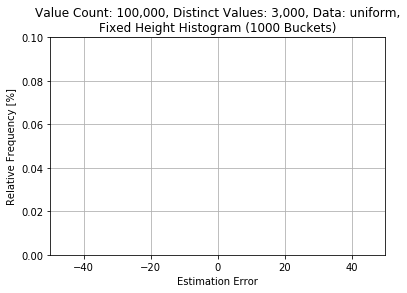

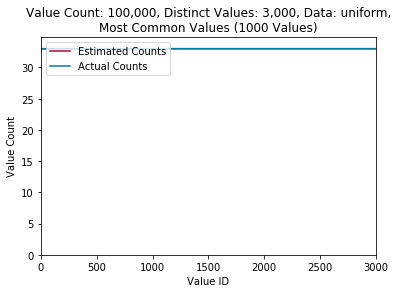

max error: 0
max relative error: 0%
Estimation Technique: postgres2_1000
Sample Size: 3000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



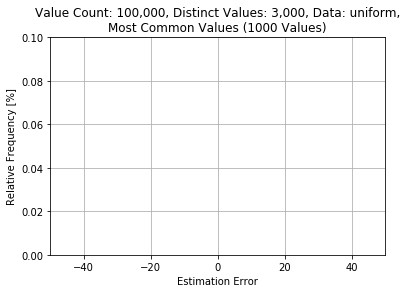

,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,Uniform Estimation,4.0,0.761618,243.016968
1,Fixed Height Histogram (10 Buckets),40.0,0.866816,210.545536
2,Fixed Height Histogram (50 Buckets),200.0,0.558355,73.544195
3,Fixed Height Histogram (100 Buckets),400.0,0.548520,80.490077
4,Most Common Values (10 Values),40.0,0.587012,70.244579
5,Most Common Values (50 Values),200.0,0.408362,18.417861
6,Most Common Values (100 Values),400.0,0.298203,2.152006
7,"Filter (Quotient Size 17, Remainder Size 2)",65536.0,0.190277,26.722027
8,"Filter (Quotient Size 17, Remainder Size 4)",98304.0,0.048086,7.332300
9,"Filter (Quotient Size 17, Remainder Size 8)",163840.0,0.002895,0.326013


,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,"Filter (Quotient Size 17, Remainder Size 2)",65536.0,0.190277,26.722027
1,"Filter (Quotient Size 17, Remainder Size 4)",98304.0,0.048086,7.332300
2,"Filter (Quotient Size 17, Remainder Size 8)",163840.0,0.002895,0.326013
3,"Filter (Quotient Size 17, Remainder Size 16)",294912.0,0.000011,0.000121


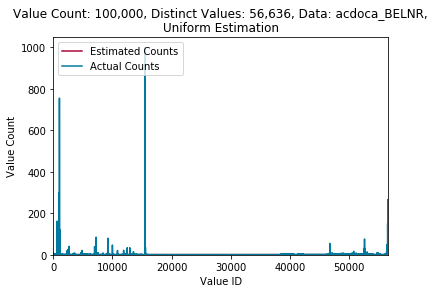

max error: 997
max relative error: 99.8997995992%
Estimation Technique: uniform
Sample Size: 56636
Mean Error: 0.761618052122
Mean Squared Error: 243.016968006
Column Size [kB](uint16_t): 200.0



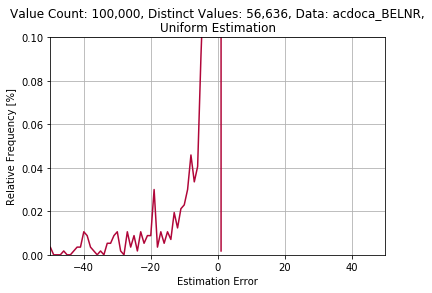

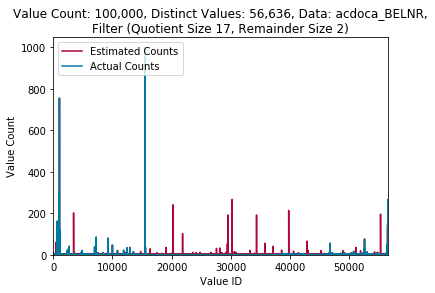

max error: 266
max relative error: 26600.0%
Estimation Technique: filter_17_2
Sample Size: 30000000
Mean Error: 0.190276733333
Mean Squared Error: 26.7220271333
Column Size [kB](uint16_t): 200.0



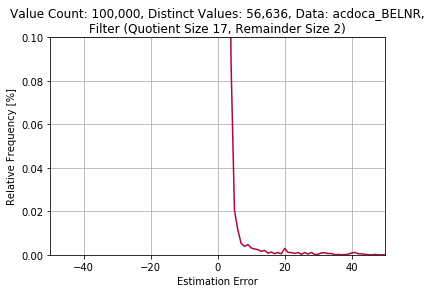

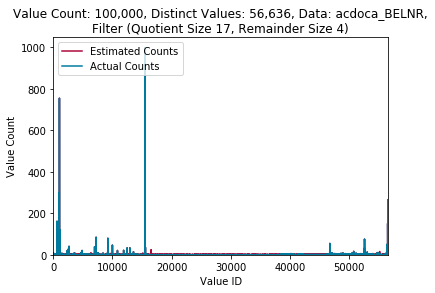

max error: 24
max relative error: 2400.0%
Estimation Technique: filter_17_4
Sample Size: 30000000
Mean Error: 0.0480855666667
Mean Squared Error: 7.33229963333
Column Size [kB](uint16_t): 200.0



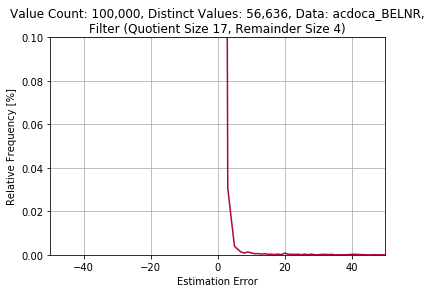

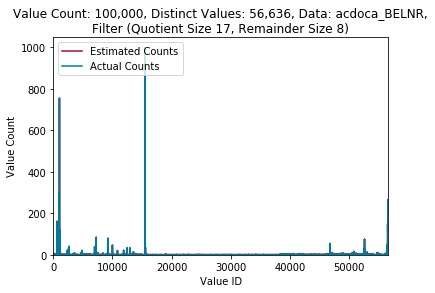

max error: 4
max relative error: 400.0%
Estimation Technique: filter_17_8
Sample Size: 30000000
Mean Error: 0.00289456666667
Mean Squared Error: 0.326013166667
Column Size [kB](uint16_t): 200.0



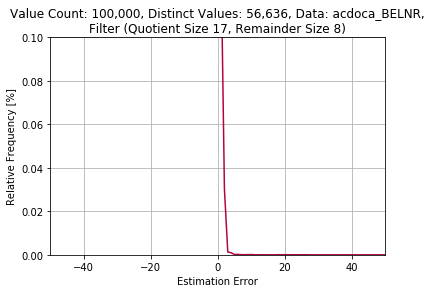

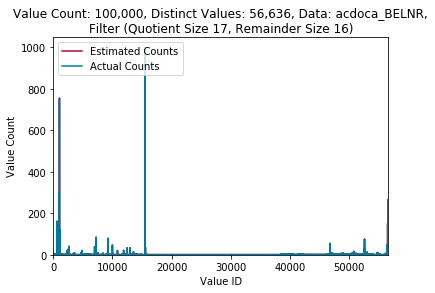

max error: 0
max relative error: 0%
Estimation Technique: filter_17_16
Sample Size: 30000000
Mean Error: 1.10333333333e-05
Mean Squared Error: 0.0001205
Column Size [kB](uint16_t): 200.0



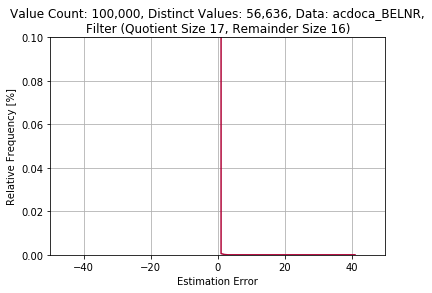

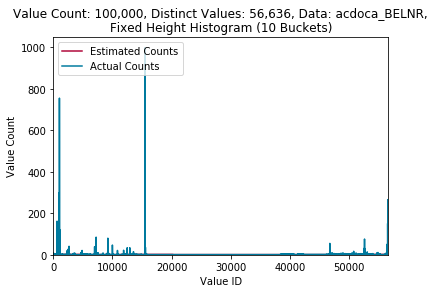

max error: 996
max relative error: 3057.14285714%
Estimation Technique: postgres1_10
Sample Size: 56636
Mean Error: 0.866816159333
Mean Squared Error: 210.545536408
Column Size [kB](uint16_t): 200.0



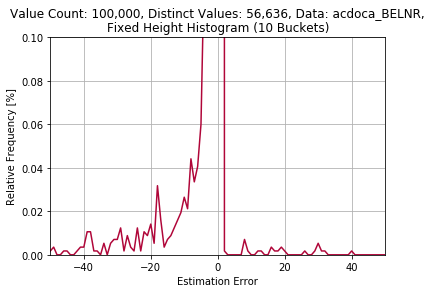

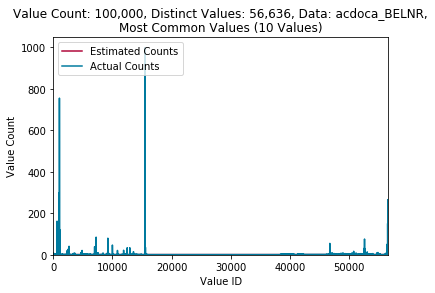

max error: 754
max relative error: 99.8675496689%
Estimation Technique: postgres2_10
Sample Size: 56636
Mean Error: 0.587011794618
Mean Squared Error: 70.2445794195
Column Size [kB](uint16_t): 200.0



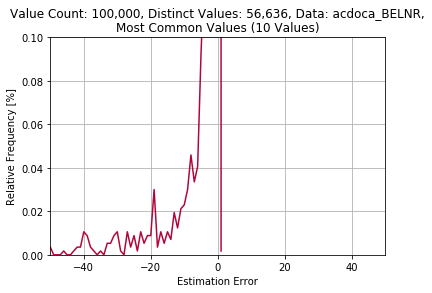

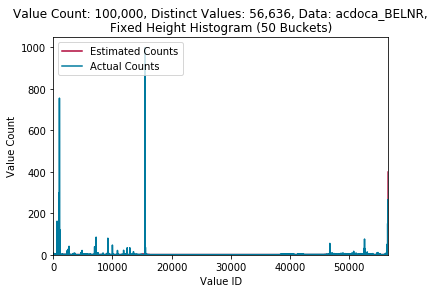

max error: 994
max relative error: 2485.71428571%
Estimation Technique: postgres1_50
Sample Size: 56636
Mean Error: 0.558355109824
Mean Squared Error: 73.5441945053
Column Size [kB](uint16_t): 200.0



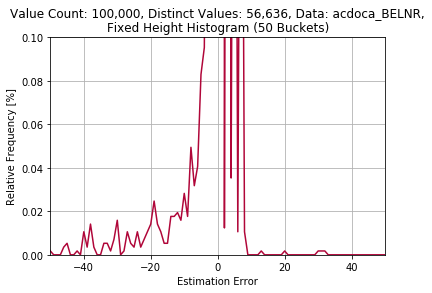

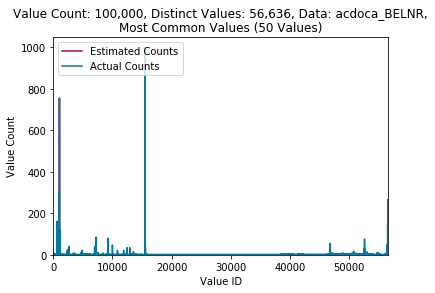

max error: 202
max relative error: 99.5073891626%
Estimation Technique: postgres2_50
Sample Size: 56636
Mean Error: 0.40836217247
Mean Squared Error: 18.4178614309
Column Size [kB](uint16_t): 200.0



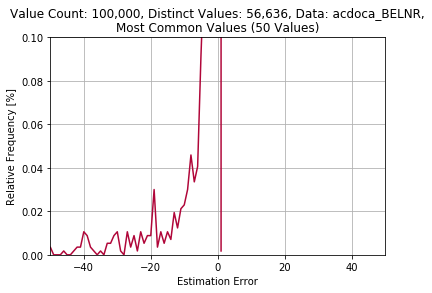

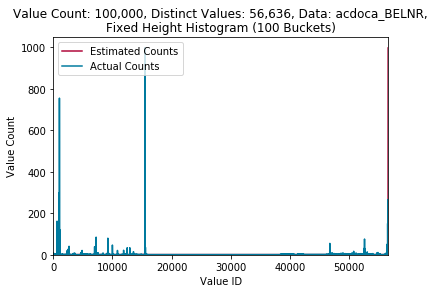

max error: 997
max relative error: 8900.0%
Estimation Technique: postgres1_100
Sample Size: 56636
Mean Error: 0.548520375733
Mean Squared Error: 80.4900769828
Column Size [kB](uint16_t): 200.0



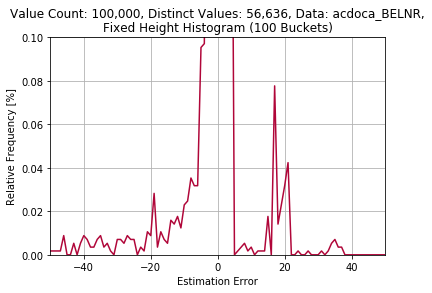

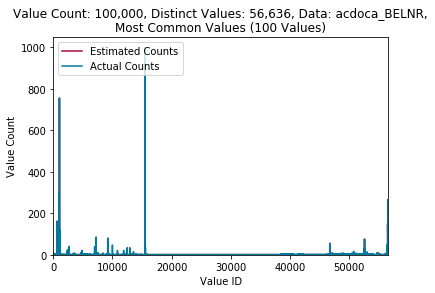

max error: 54
max relative error: 98.1818181818%
Estimation Technique: postgres2_100
Sample Size: 56636
Mean Error: 0.298202556678
Mean Squared Error: 2.15200579137
Column Size [kB](uint16_t): 200.0



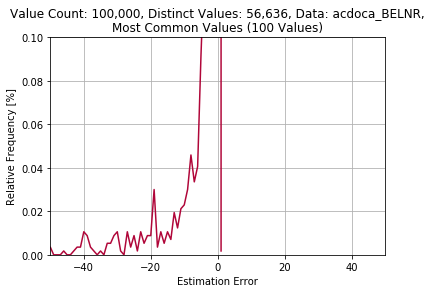

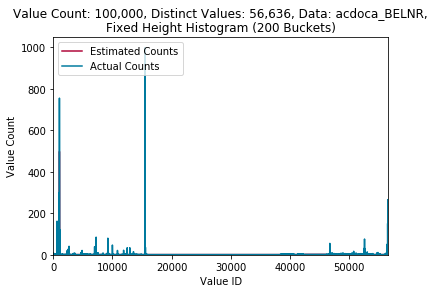

max error: 969
max relative error: 6100.0%
Estimation Technique: postgres1_200
Sample Size: 56636
Mean Error: 0.481725404336
Mean Squared Error: 80.072303835
Column Size [kB](uint16_t): 200.0



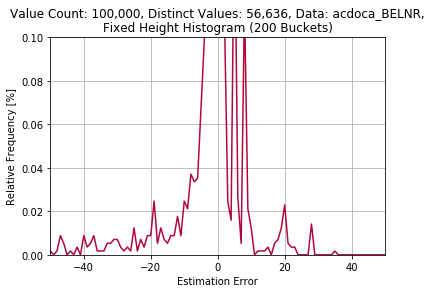

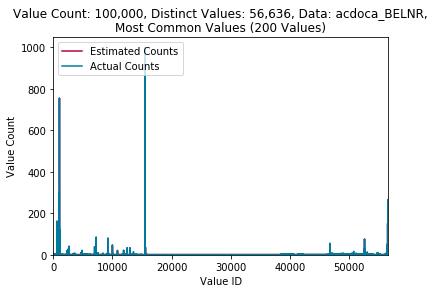

max error: 17
max relative error: 94.4444444444%
Estimation Technique: postgres2_200
Sample Size: 56636
Mean Error: 0.247792923229
Mean Squared Error: 0.55304046896
Column Size [kB](uint16_t): 200.0



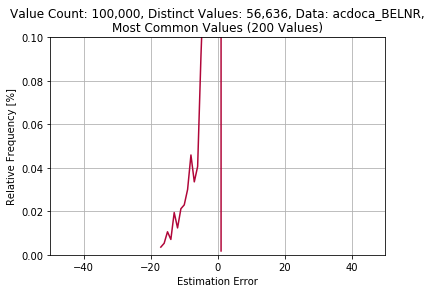

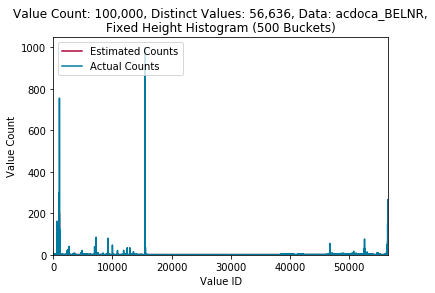

max error: 983
max relative error: 1400.0%
Estimation Technique: postgres1_500
Sample Size: 56636
Mean Error: 0.556907267462
Mean Squared Error: 139.121530475
Column Size [kB](uint16_t): 200.0



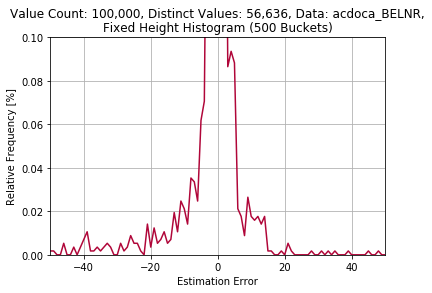

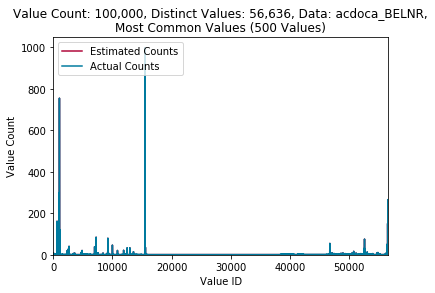

max error: 3
max relative error: 75.0%
Estimation Technique: postgres2_500
Sample Size: 56636
Mean Error: 0.212479694894
Mean Squared Error: 0.2585987711
Column Size [kB](uint16_t): 200.0



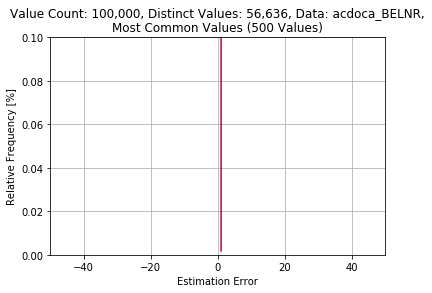

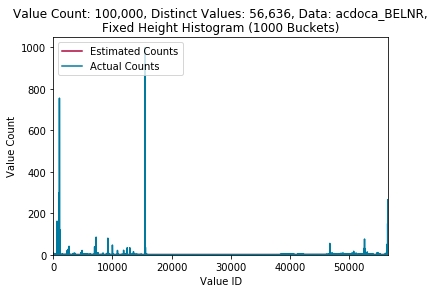

max error: 989
max relative error: 1300.0%
Estimation Technique: postgres1_1000
Sample Size: 56636
Mean Error: 0.611695741225
Mean Squared Error: 176.716152271
Column Size [kB](uint16_t): 200.0



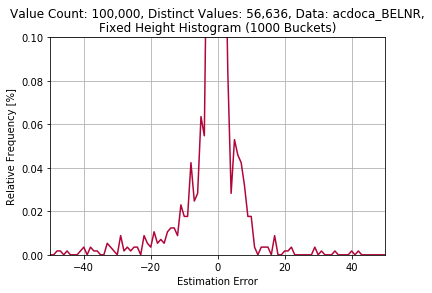

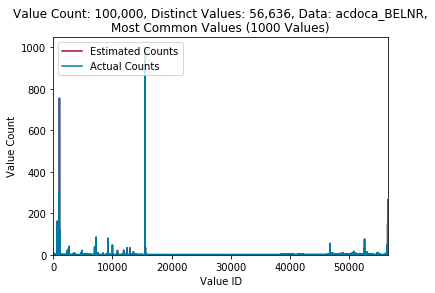

max error: 2
max relative error: 66.6666666667%
Estimation Technique: postgres2_1000
Sample Size: 56636
Mean Error: 0.189561409704
Mean Squared Error: 0.196977187654
Column Size [kB](uint16_t): 200.0



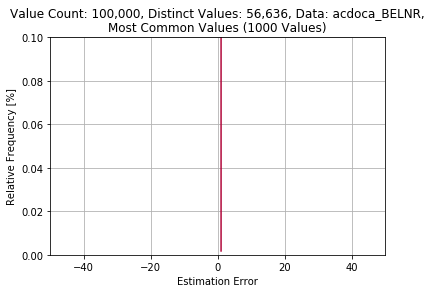

,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,Uniform Estimation,4.0,1265.272727,9.854754e+06
1,Fixed Height Histogram (10 Buckets),40.0,850.474747,5.805989e+06
2,Fixed Height Histogram (50 Buckets),200.0,793.777778,8.585719e+06
3,Fixed Height Histogram (100 Buckets),400.0,818.878788,9.597039e+06
4,Most Common Values (10 Values),40.0,240.373737,9.652930e+04
5,Most Common Values (50 Values),200.0,42.313131,4.460818e+03
6,Most Common Values (100 Values),400.0,1005.828283,1.086644e+07
7,"Filter (Quotient Size 12, Remainder Size 2)",2048.0,6.296163,6.526778e+04
8,"Filter (Quotient Size 12, Remainder Size 4)",3072.0,1.969940,2.206256e+04
9,"Filter (Quotient Size 12, Remainder Size 8)",5120.0,0.015214,1.119537e+01


,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,"Filter (Quotient Size 12, Remainder Size 2)",2048.0,6.296163,65267.778032
1,"Filter (Quotient Size 12, Remainder Size 4)",3072.0,1.969940,22062.560194
2,"Filter (Quotient Size 12, Remainder Size 8)",5120.0,0.015214,11.195371
3,"Filter (Quotient Size 12, Remainder Size 16)",9216.0,0.000000,0.000000
4,"Filter (Quotient Size 13, Remainder Size 2)",4096.0,3.005579,28955.373346
5,"Filter (Quotient Size 13, Remainder Size 4)",6144.0,0.681670,5554.438892
6,"Filter (Quotient Size 13, Remainder Size 8)",10240.0,0.000000,0.000000
7,"Filter (Quotient Size 13, Remainder Size 16)",18432.0,0.000000,0.000000
8,"Filter (Quotient Size 14, Remainder Size 2)",8192.0,1.931629,21621.645699
9,"Filter (Quotient Size 14, Remainder Size 4)",12288.0,0.105320,71.451697


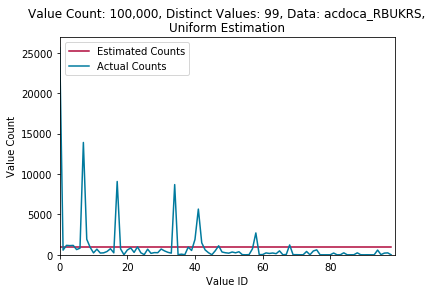

max error: 24618
max relative error: 100400.0%
Estimation Technique: uniform
Sample Size: 99
Mean Error: 1265.27272727
Mean Squared Error: 9854754.42424
Column Size [kB](uint16_t): 200.0



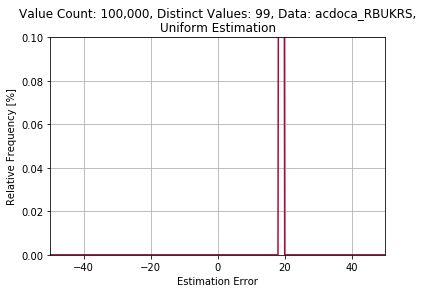

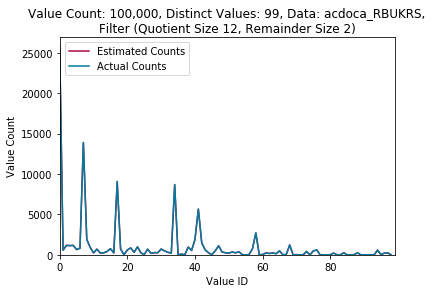

max error: 0
max relative error: 0%
Estimation Technique: filter_12_2
Sample Size: 30000000
Mean Error: 6.29616336667
Mean Squared Error: 65267.7780316
Column Size [kB](uint16_t): 200.0



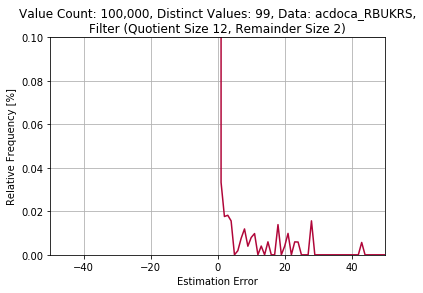

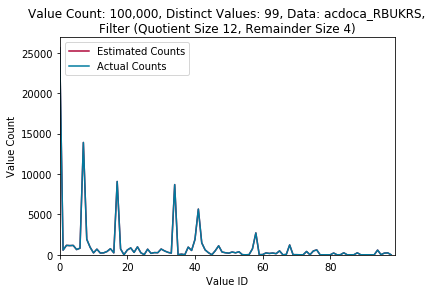

max error: 0
max relative error: 0%
Estimation Technique: filter_12_4
Sample Size: 30000000
Mean Error: 1.96994006667
Mean Squared Error: 22062.5601942
Column Size [kB](uint16_t): 200.0



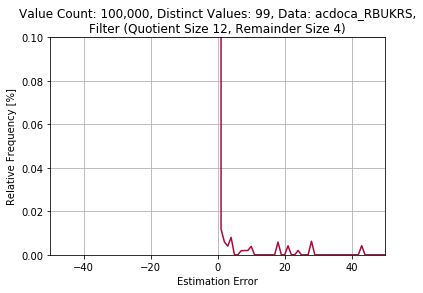

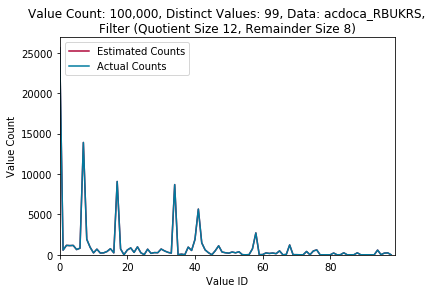

max error: 0
max relative error: 0%
Estimation Technique: filter_12_8
Sample Size: 30000000
Mean Error: 0.0152144
Mean Squared Error: 11.1953712
Column Size [kB](uint16_t): 200.0



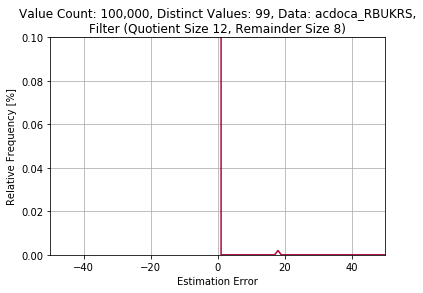

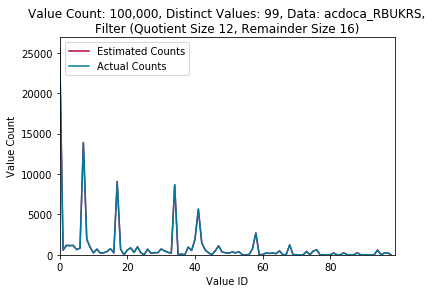

max error: 0
max relative error: 0%
Estimation Technique: filter_12_16
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



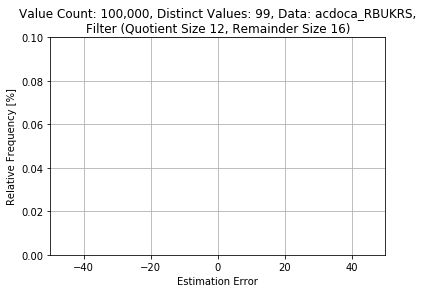

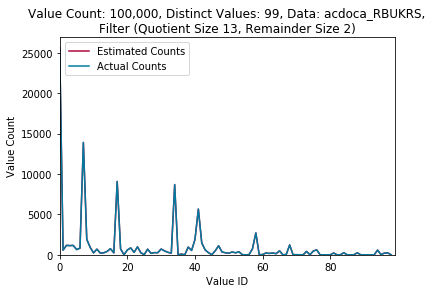

max error: 0
max relative error: 0%
Estimation Technique: filter_13_2
Sample Size: 30000000
Mean Error: 3.00557913333
Mean Squared Error: 28955.3733462
Column Size [kB](uint16_t): 200.0



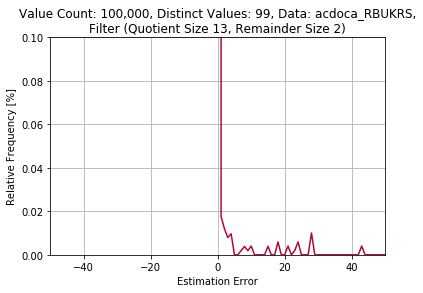

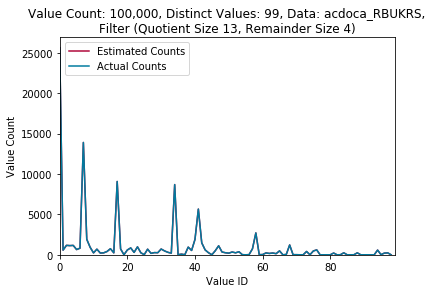

max error: 0
max relative error: 0%
Estimation Technique: filter_13_4
Sample Size: 30000000
Mean Error: 0.6816696
Mean Squared Error: 5554.4388922
Column Size [kB](uint16_t): 200.0



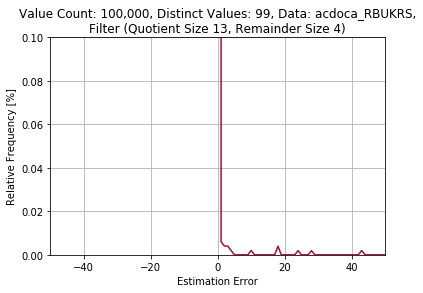

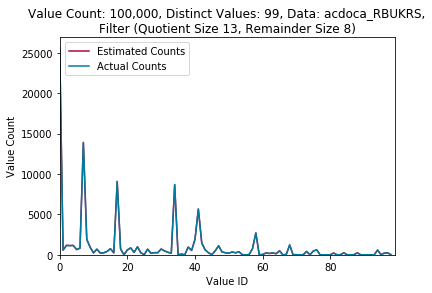

max error: 0
max relative error: 0%
Estimation Technique: filter_13_8
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



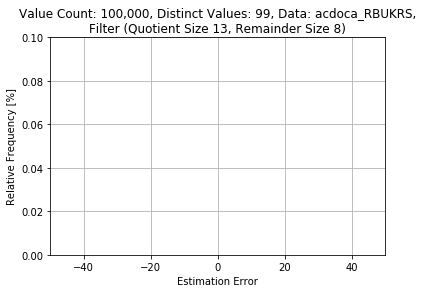

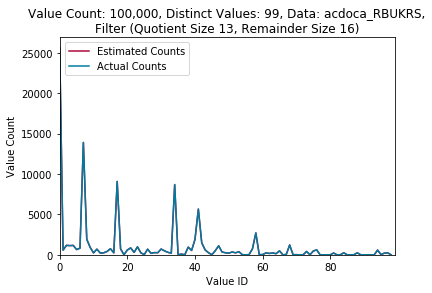

max error: 0
max relative error: 0%
Estimation Technique: filter_13_16
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



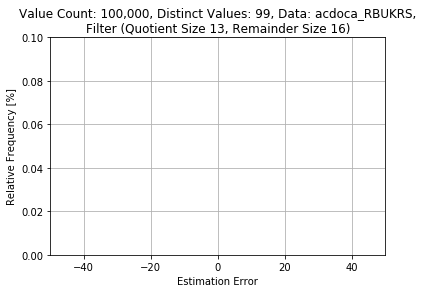

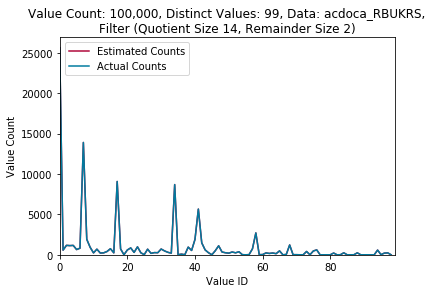

max error: 0
max relative error: 0%
Estimation Technique: filter_14_2
Sample Size: 30000000
Mean Error: 1.9316286
Mean Squared Error: 21621.6456993
Column Size [kB](uint16_t): 200.0



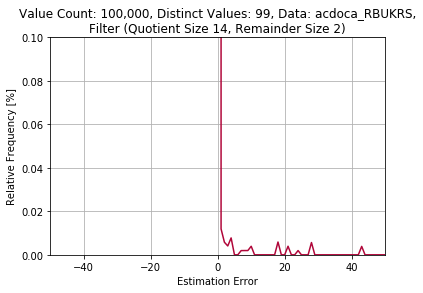

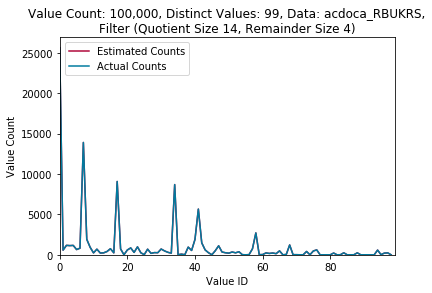

max error: 0
max relative error: 0%
Estimation Technique: filter_14_4
Sample Size: 30000000
Mean Error: 0.10532
Mean Squared Error: 71.4516968
Column Size [kB](uint16_t): 200.0



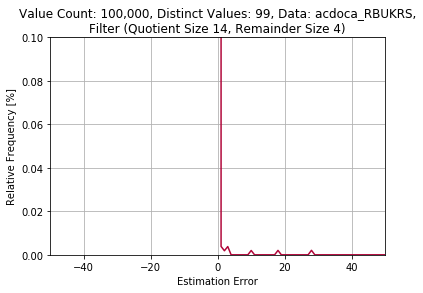

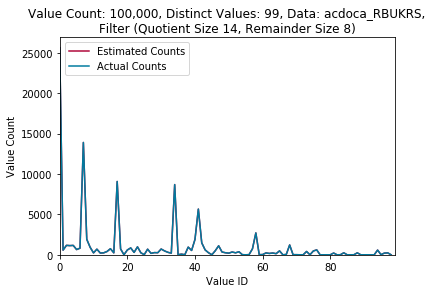

max error: 0
max relative error: 0%
Estimation Technique: filter_14_8
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



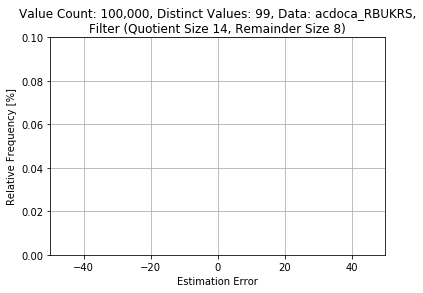

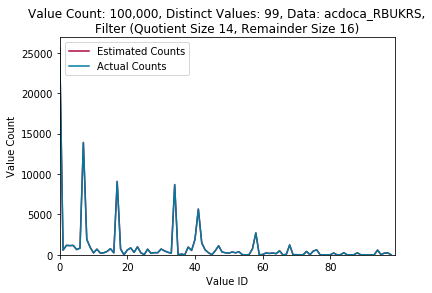

max error: 0
max relative error: 0%
Estimation Technique: filter_14_16
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



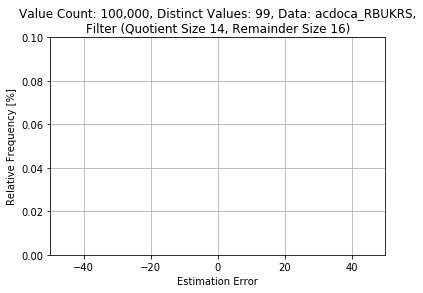

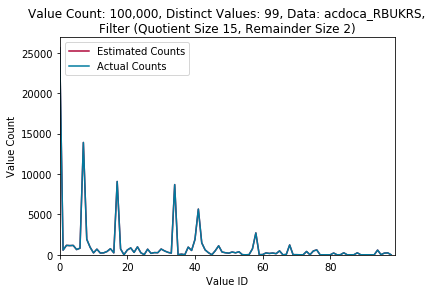

max error: 0
max relative error: 0%
Estimation Technique: filter_15_2
Sample Size: 30000000
Mean Error: 0.681265666667
Mean Squared Error: 5509.44933333
Column Size [kB](uint16_t): 200.0



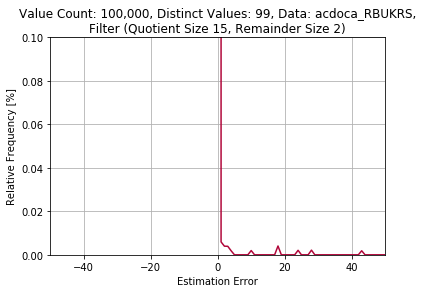

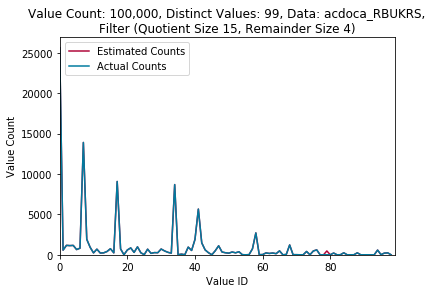

max error: 473
max relative error: 15766.6666667%
Estimation Technique: filter_15_4
Sample Size: 30000000
Mean Error: 0.0795381666667
Mean Squared Error: 50.6832701667
Column Size [kB](uint16_t): 200.0



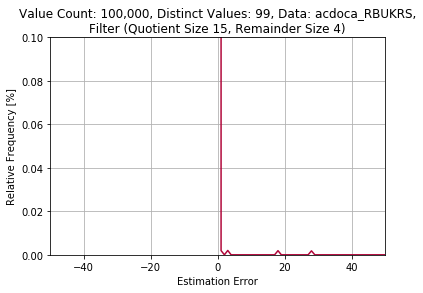

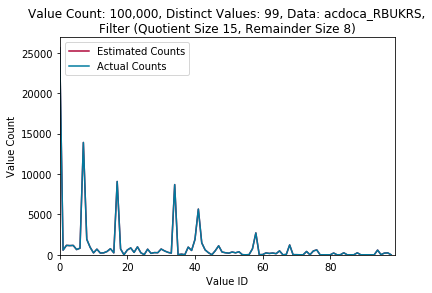

max error: 0
max relative error: 0%
Estimation Technique: filter_15_8
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



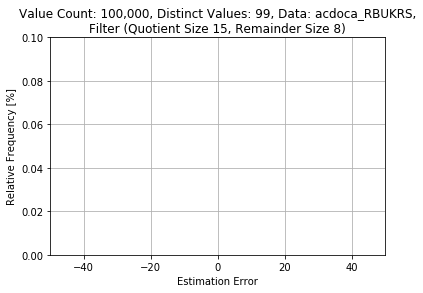

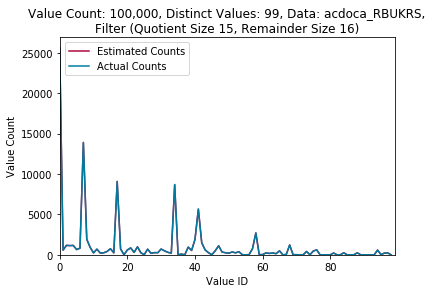

max error: 0
max relative error: 0%
Estimation Technique: filter_15_16
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



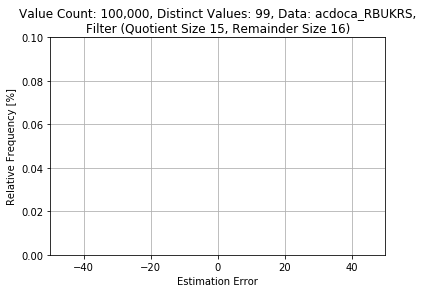

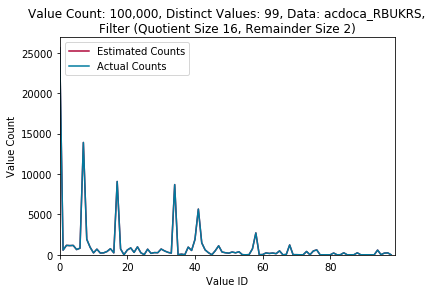

max error: 0
max relative error: 0%
Estimation Technique: filter_16_2
Sample Size: 30000000
Mean Error: 0.102561266667
Mean Squared Error: 69.5002241333
Column Size [kB](uint16_t): 200.0



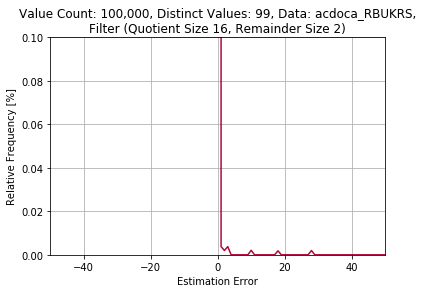

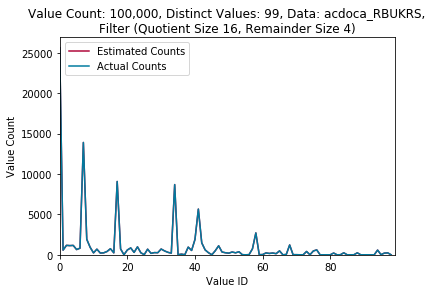

max error: 0
max relative error: 0%
Estimation Technique: filter_16_4
Sample Size: 30000000
Mean Error: 0.0152915
Mean Squared Error: 11.2521045
Column Size [kB](uint16_t): 200.0



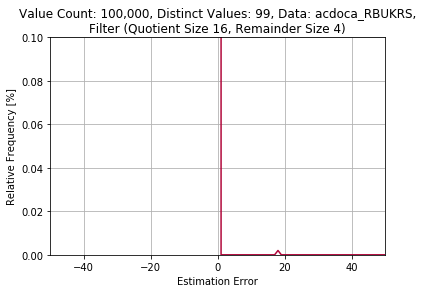

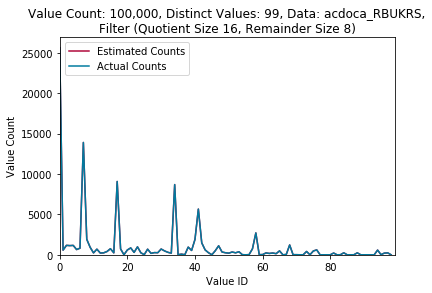

max error: 0
max relative error: 0%
Estimation Technique: filter_16_8
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



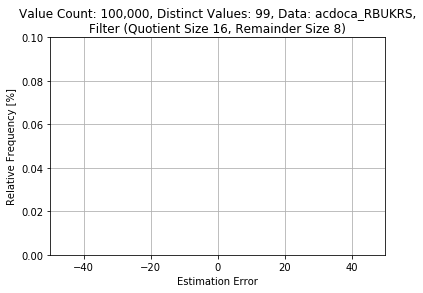

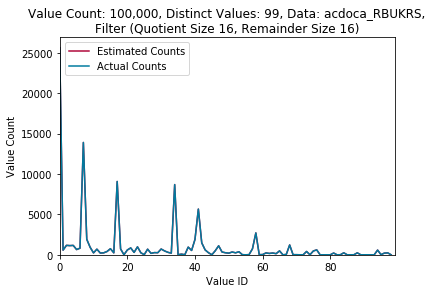

max error: 0
max relative error: 0%
Estimation Technique: filter_16_16
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



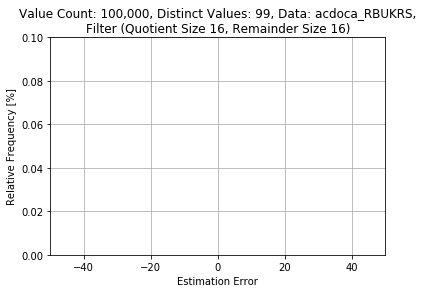

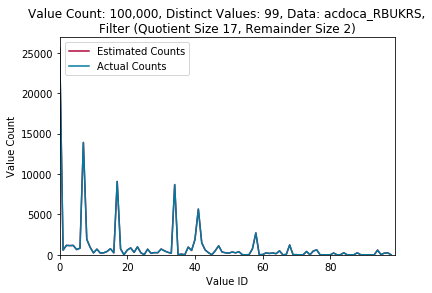

max error: 0
max relative error: 0%
Estimation Technique: filter_17_2
Sample Size: 30000000
Mean Error: 0.0823382333333
Mean Squared Error: 53.0109812333
Column Size [kB](uint16_t): 200.0



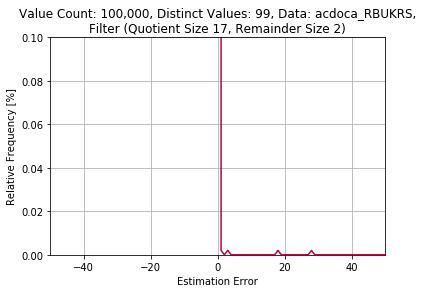

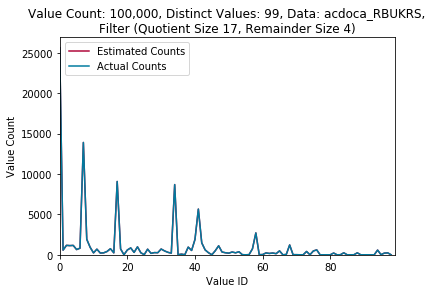

max error: 0
max relative error: 0%
Estimation Technique: filter_17_4
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



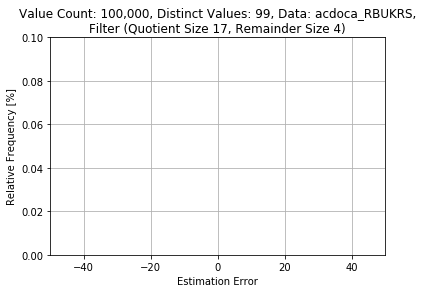

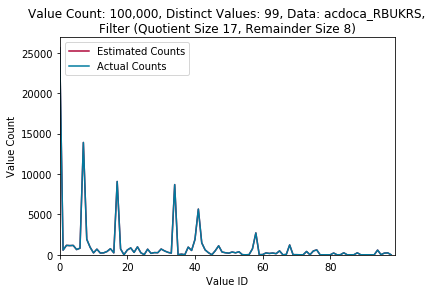

max error: 0
max relative error: 0%
Estimation Technique: filter_17_8
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



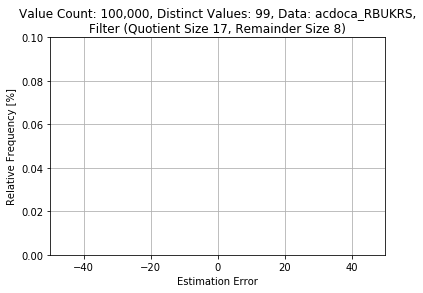

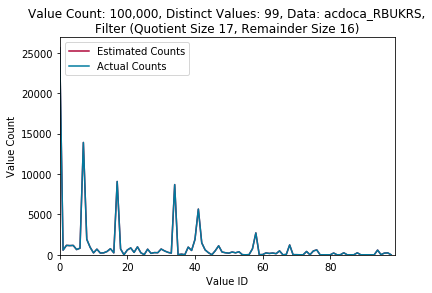

max error: 0
max relative error: 0%
Estimation Technique: filter_17_16
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



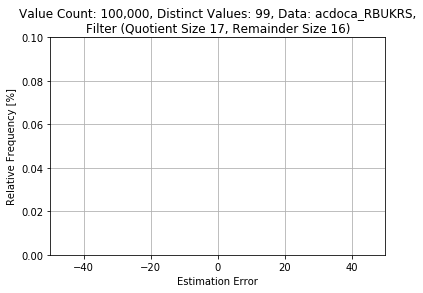

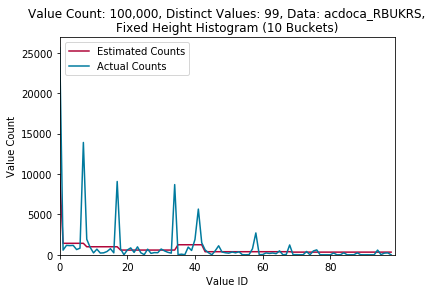

max error: 15666
max relative error: 38100.0%
Estimation Technique: postgres1_10
Sample Size: 99
Mean Error: 850.474747475
Mean Squared Error: 5805988.53535
Column Size [kB](uint16_t): 200.0



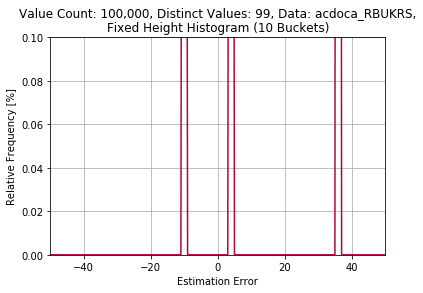

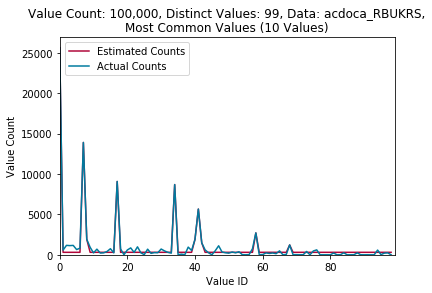

max error: 861
max relative error: 30700.0%
Estimation Technique: postgres2_10
Sample Size: 99
Mean Error: 240.373737374
Mean Squared Error: 96529.3030303
Column Size [kB](uint16_t): 200.0



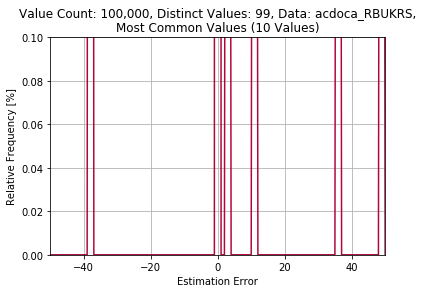

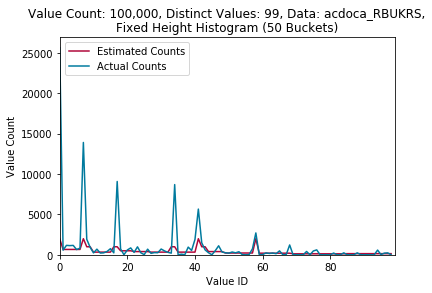

max error: 23632
max relative error: 22000.0%
Estimation Technique: postgres1_50
Sample Size: 99
Mean Error: 793.777777778
Mean Squared Error: 8585719.27273
Column Size [kB](uint16_t): 200.0



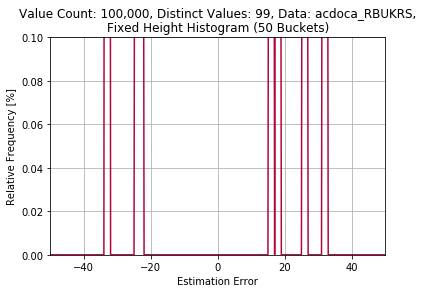

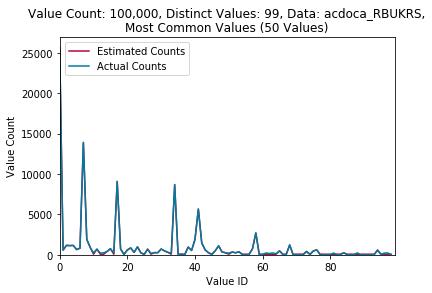

max error: 170
max relative error: 7200.0%
Estimation Technique: postgres2_50
Sample Size: 99
Mean Error: 42.3131313131
Mean Squared Error: 4460.81818182
Column Size [kB](uint16_t): 200.0



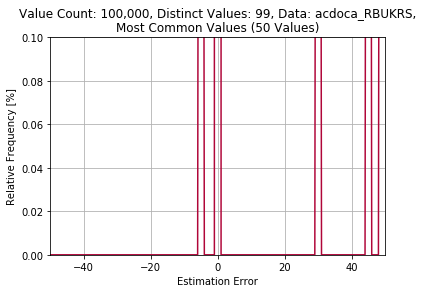

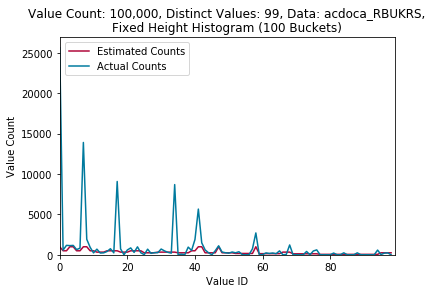

max error: 24628
max relative error: 33000.0%
Estimation Technique: postgres1_100
Sample Size: 99
Mean Error: 818.878787879
Mean Squared Error: 9597038.65657
Column Size [kB](uint16_t): 200.0



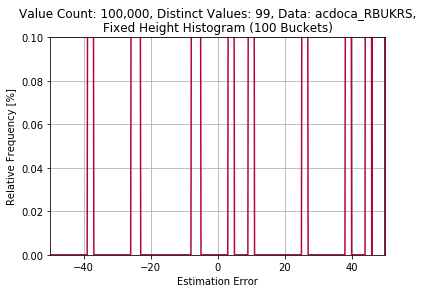

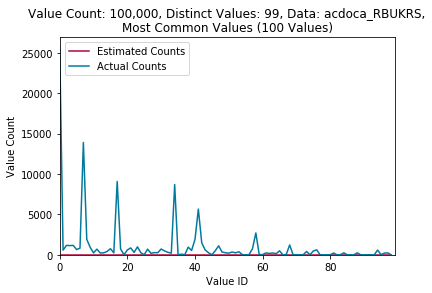

max error: 25623
max relative error: 100.0%
Estimation Technique: postgres2_100
Sample Size: 99
Mean Error: 1005.82828283
Mean Squared Error: 10866444.2727
Column Size [kB](uint16_t): 200.0



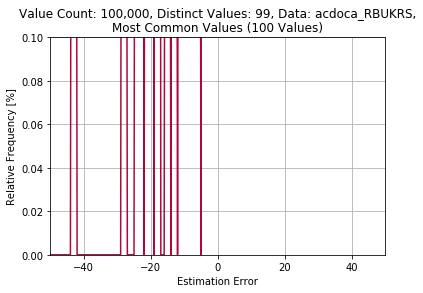

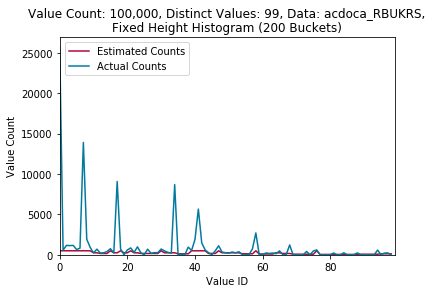

max error: 25126
max relative error: 16400.0%
Estimation Technique: postgres1_200
Sample Size: 99
Mean Error: 846.424242424
Mean Squared Error: 10136447.2929
Column Size [kB](uint16_t): 200.0



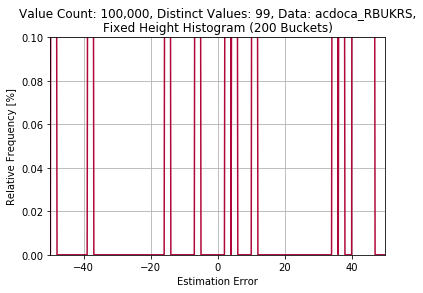

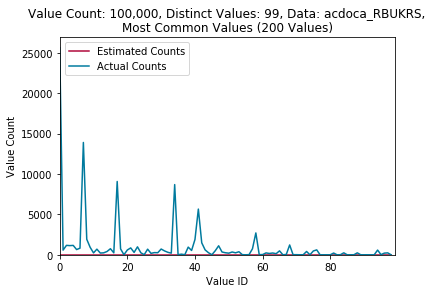

max error: 25623
max relative error: 100.0%
Estimation Technique: postgres2_200
Sample Size: 99
Mean Error: 1005.82828283
Mean Squared Error: 10866444.2727
Column Size [kB](uint16_t): 200.0



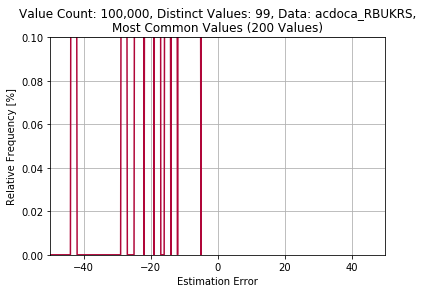

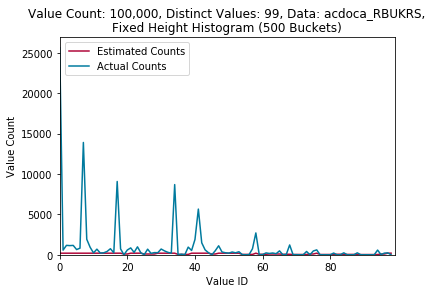

max error: 25424
max relative error: 9800.0%
Estimation Technique: postgres1_500
Sample Size: 99
Mean Error: 912.555555556
Mean Squared Error: 10510520.798
Column Size [kB](uint16_t): 200.0



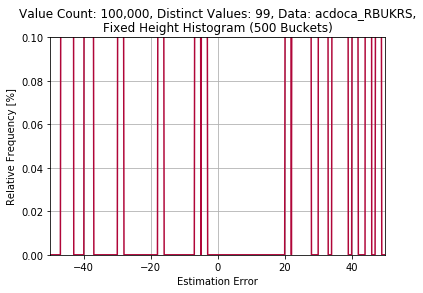

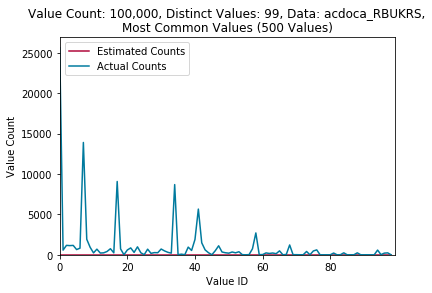

max error: 25623
max relative error: 100.0%
Estimation Technique: postgres2_500
Sample Size: 99
Mean Error: 1005.82828283
Mean Squared Error: 10866444.2727
Column Size [kB](uint16_t): 200.0



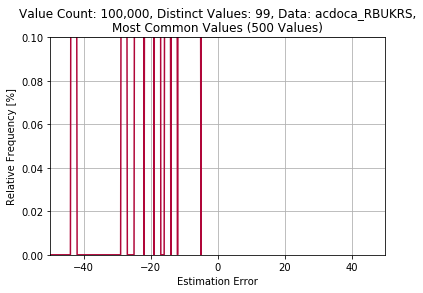

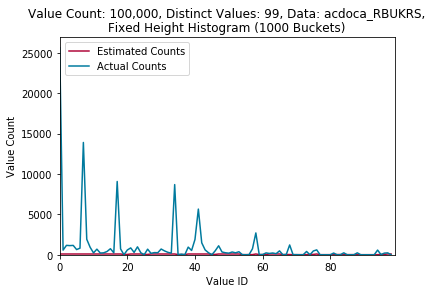

max error: 25524
max relative error: 4800.0%
Estimation Technique: postgres1_1000
Sample Size: 99
Mean Error: 952.626262626
Mean Squared Error: 10681803.4141
Column Size [kB](uint16_t): 200.0



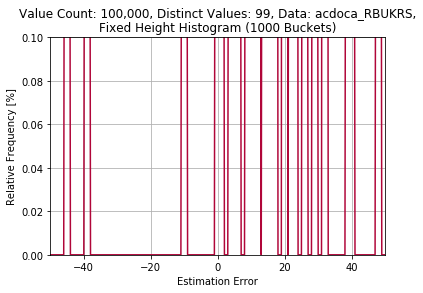

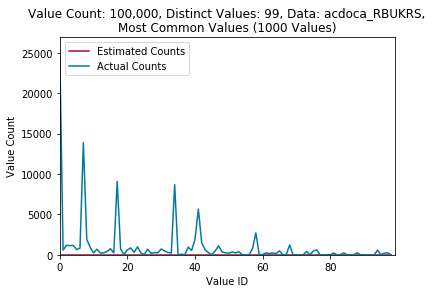

max error: 25623
max relative error: 100.0%
Estimation Technique: postgres2_1000
Sample Size: 99
Mean Error: 1005.82828283
Mean Squared Error: 10866444.2727
Column Size [kB](uint16_t): 200.0



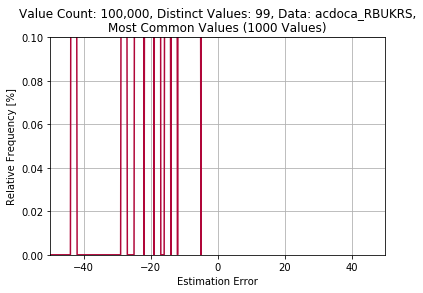

,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,Uniform Estimation,4.0,152.318217,7.365649e+06
1,Fixed Height Histogram (10 Buckets),40.0,74.092260,5.931743e+06
2,Fixed Height Histogram (50 Buckets),200.0,76.394058,7.071362e+06
3,Fixed Height Histogram (100 Buckets),400.0,76.742768,7.220852e+06
4,Most Common Values (10 Values),40.0,0.624707,2.332291e+00
5,Most Common Values (50 Values),200.0,0.419077,8.881939e-01
6,Most Common Values (100 Values),400.0,0.290852,4.597342e-01
7,"Filter (Quotient Size 12, Remainder Size 2)",2048.0,4.930135,4.607465e+05
8,"Filter (Quotient Size 12, Remainder Size 4)",3072.0,0.705263,6.349083e+04
9,"Filter (Quotient Size 12, Remainder Size 8)",5120.0,0.002780,3.664564e-01


,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,"Filter (Quotient Size 12, Remainder Size 2)",2048.0,4.930135,460746.545263
1,"Filter (Quotient Size 12, Remainder Size 4)",3072.0,0.705263,63490.833179
2,"Filter (Quotient Size 12, Remainder Size 8)",5120.0,0.002780,0.366456
3,"Filter (Quotient Size 12, Remainder Size 16)",9216.0,0.000009,0.000013
4,"Filter (Quotient Size 13, Remainder Size 2)",4096.0,2.073492,191719.868119
5,"Filter (Quotient Size 13, Remainder Size 4)",6144.0,0.186669,15404.693954
6,"Filter (Quotient Size 13, Remainder Size 8)",10240.0,0.001710,0.333809
7,"Filter (Quotient Size 13, Remainder Size 16)",18432.0,0.000003,0.000003
8,"Filter (Quotient Size 14, Remainder Size 2)",8192.0,0.633972,56576.689009
9,"Filter (Quotient Size 14, Remainder Size 4)",12288.0,0.012383,1.916033


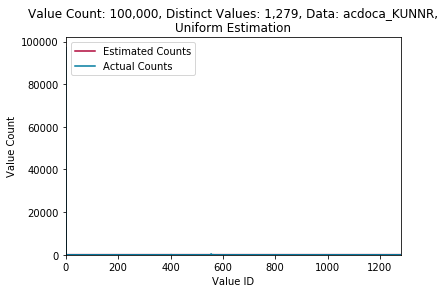

max error: 97021
max relative error: 7700.0%
Estimation Technique: uniform
Sample Size: 1279
Mean Error: 152.318217357
Mean Squared Error: 7365648.83581
Column Size [kB](uint16_t): 200.0



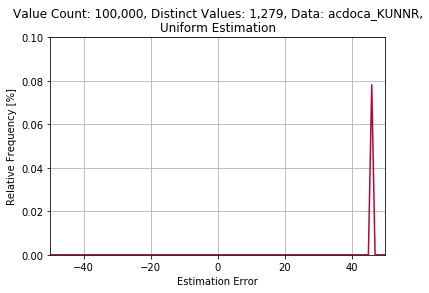

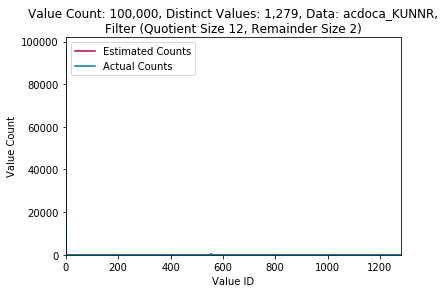

max error: 7
max relative error: 700.0%
Estimation Technique: filter_12_2
Sample Size: 30000000
Mean Error: 4.9301345
Mean Squared Error: 460746.545263
Column Size [kB](uint16_t): 200.0



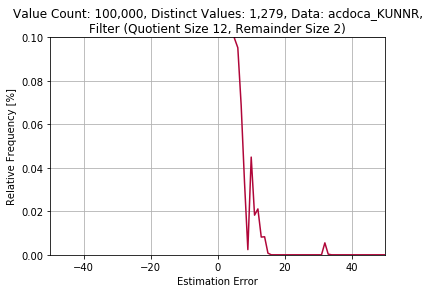

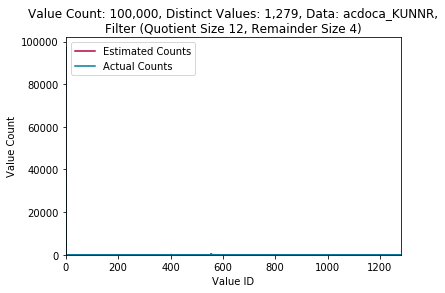

max error: 8
max relative error: 500.0%
Estimation Technique: filter_12_4
Sample Size: 30000000
Mean Error: 0.705262866667
Mean Squared Error: 63490.8331795
Column Size [kB](uint16_t): 200.0



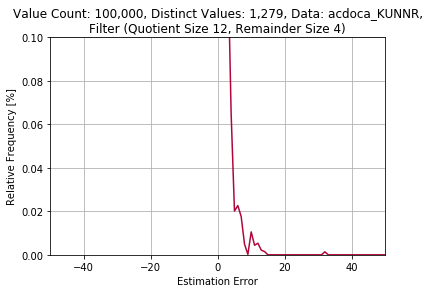

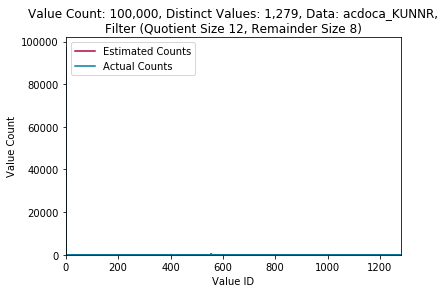

max error: 0
max relative error: 0%
Estimation Technique: filter_12_8
Sample Size: 30000000
Mean Error: 0.00278023333333
Mean Squared Error: 0.366456366667
Column Size [kB](uint16_t): 200.0



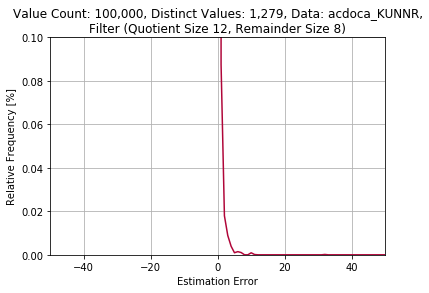

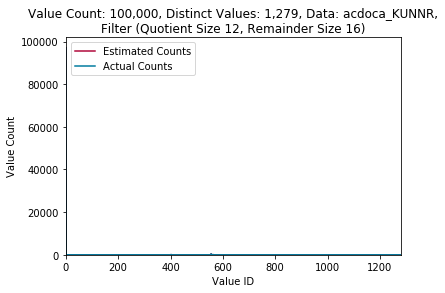

max error: 0
max relative error: 0%
Estimation Technique: filter_12_16
Sample Size: 30000000
Mean Error: 8.53333333333e-06
Mean Squared Error: 1.33333333333e-05
Column Size [kB](uint16_t): 200.0



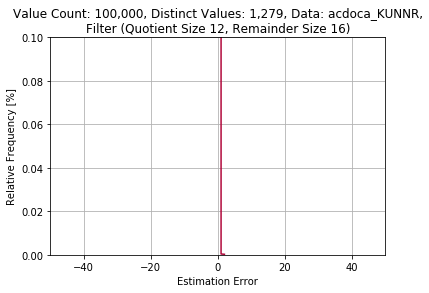

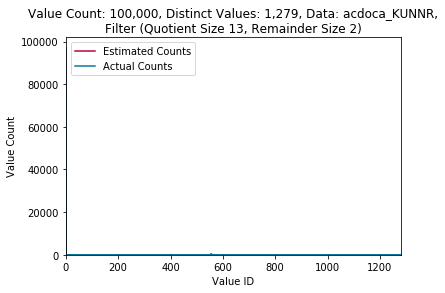

max error: 13
max relative error: 1300.0%
Estimation Technique: filter_13_2
Sample Size: 30000000
Mean Error: 2.0734917
Mean Squared Error: 191719.868119
Column Size [kB](uint16_t): 200.0



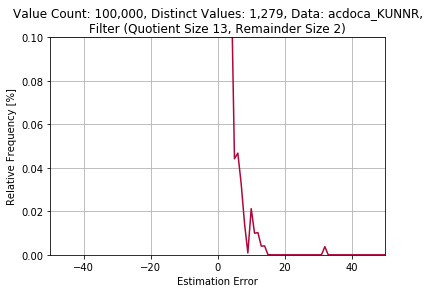

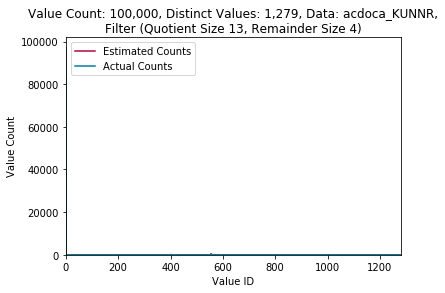

max error: 1
max relative error: 100.0%
Estimation Technique: filter_13_4
Sample Size: 30000000
Mean Error: 0.186668566667
Mean Squared Error: 15404.6939536
Column Size [kB](uint16_t): 200.0



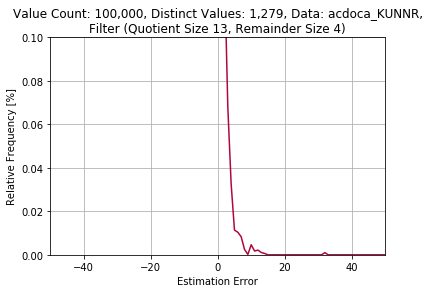

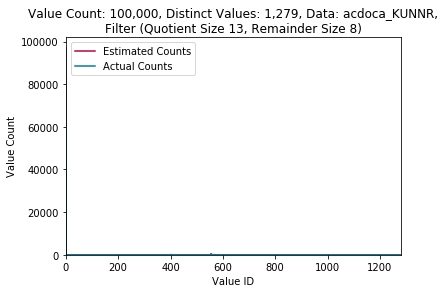

max error: 0
max relative error: 0%
Estimation Technique: filter_13_8
Sample Size: 30000000
Mean Error: 0.00170966666667
Mean Squared Error: 0.333809333333
Column Size [kB](uint16_t): 200.0



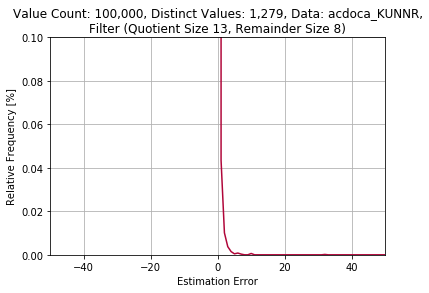

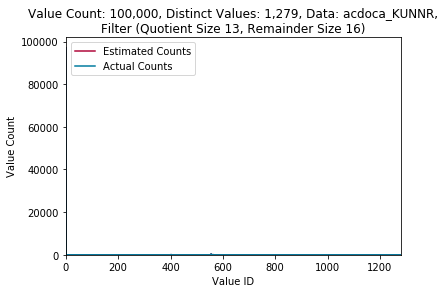

max error: 0
max relative error: 0%
Estimation Technique: filter_13_16
Sample Size: 30000000
Mean Error: 3.06666666667e-06
Mean Squared Error: 3.06666666667e-06
Column Size [kB](uint16_t): 200.0



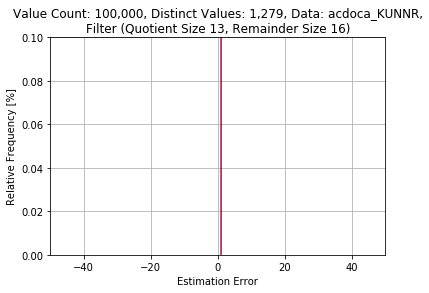

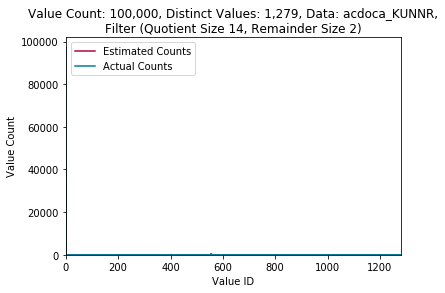

max error: 32
max relative error: 3200.0%
Estimation Technique: filter_14_2
Sample Size: 30000000
Mean Error: 0.6339723
Mean Squared Error: 56576.689009
Column Size [kB](uint16_t): 200.0



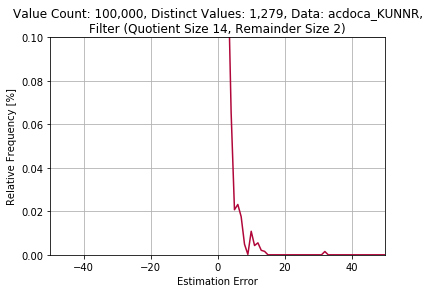

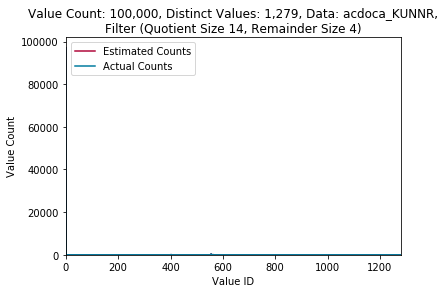

max error: 3
max relative error: 300.0%
Estimation Technique: filter_14_4
Sample Size: 30000000
Mean Error: 0.0123834666667
Mean Squared Error: 1.91603266667
Column Size [kB](uint16_t): 200.0



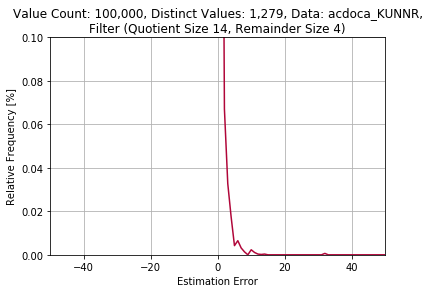

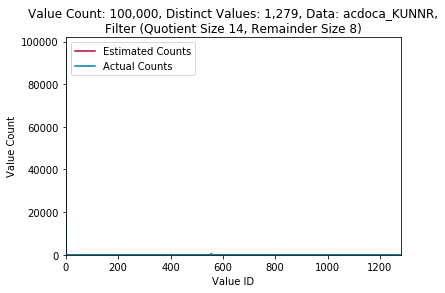

max error: 0
max relative error: 0%
Estimation Technique: filter_14_8
Sample Size: 30000000
Mean Error: 0.000529166666667
Mean Squared Error: 0.00292723333333
Column Size [kB](uint16_t): 200.0



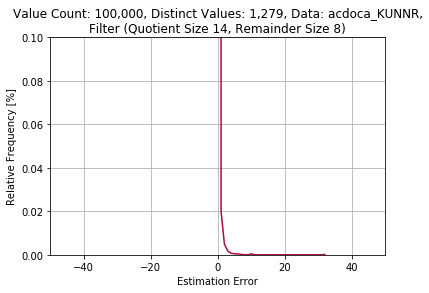

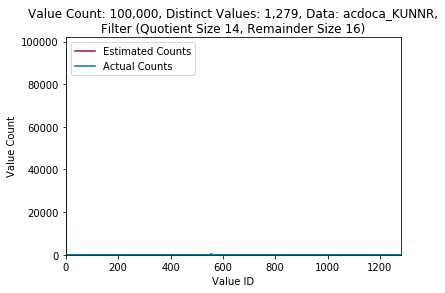

max error: 0
max relative error: 0%
Estimation Technique: filter_14_16
Sample Size: 30000000
Mean Error: 3e-06
Mean Squared Error: 3e-06
Column Size [kB](uint16_t): 200.0



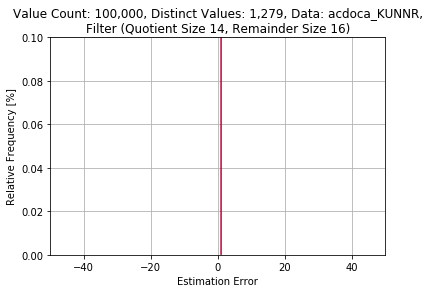

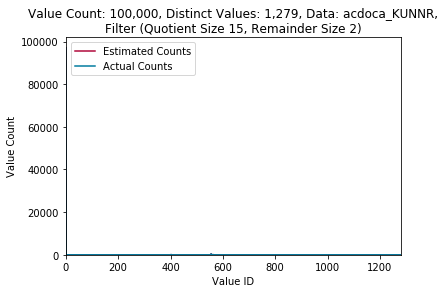

max error: 5
max relative error: 500.0%
Estimation Technique: filter_15_2
Sample Size: 30000000
Mean Error: 0.151308733333
Mean Squared Error: 11947.8745781
Column Size [kB](uint16_t): 200.0



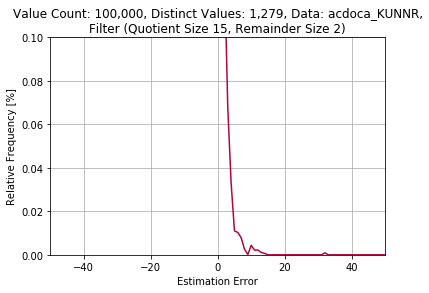

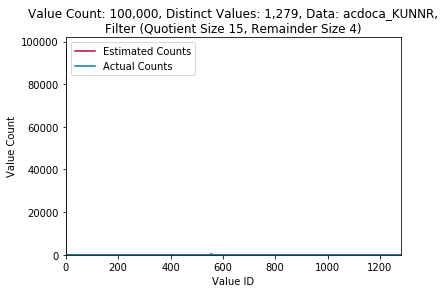

max error: 1
max relative error: 100.0%
Estimation Technique: filter_15_4
Sample Size: 30000000
Mean Error: 0.00646326666667
Mean Squared Error: 1.16786713333
Column Size [kB](uint16_t): 200.0



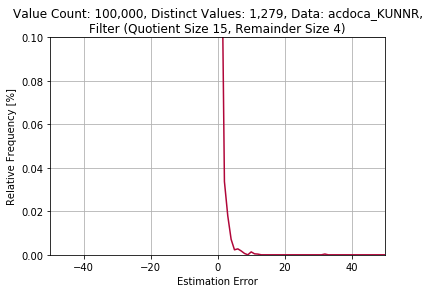

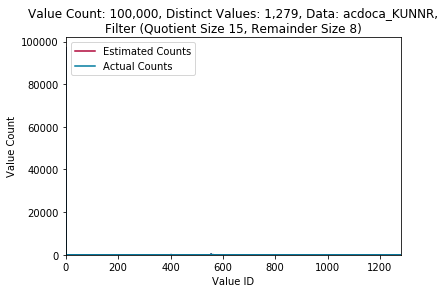

max error: 0
max relative error: 0%
Estimation Technique: filter_15_8
Sample Size: 30000000
Mean Error: 0.0002532
Mean Squared Error: 0.000738866666667
Column Size [kB](uint16_t): 200.0



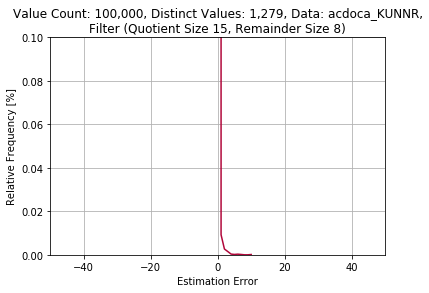

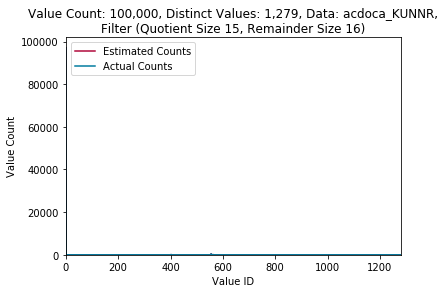

max error: 0
max relative error: 0%
Estimation Technique: filter_15_16
Sample Size: 30000000
Mean Error: 3.2e-06
Mean Squared Error: 3.2e-06
Column Size [kB](uint16_t): 200.0



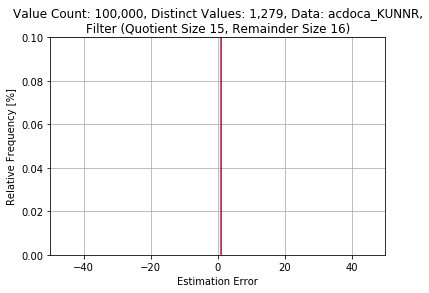

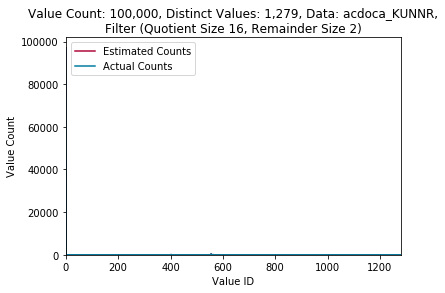

max error: 6
max relative error: 400.0%
Estimation Technique: filter_16_2
Sample Size: 30000000
Mean Error: 0.0120826333333
Mean Squared Error: 1.78678263333
Column Size [kB](uint16_t): 200.0



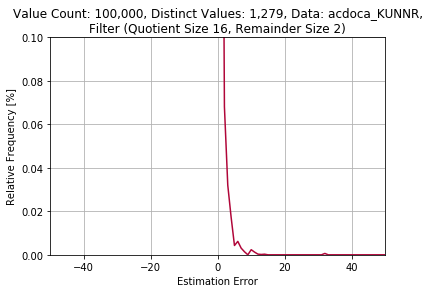

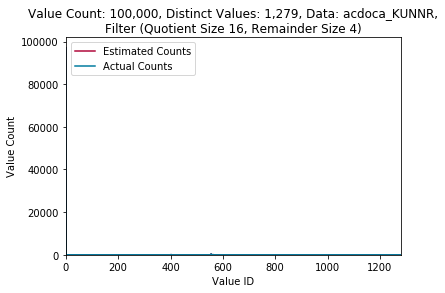

max error: 4
max relative error: 400.0%
Estimation Technique: filter_16_4
Sample Size: 30000000
Mean Error: 0.00267523333333
Mean Squared Error: 0.3213683
Column Size [kB](uint16_t): 200.0



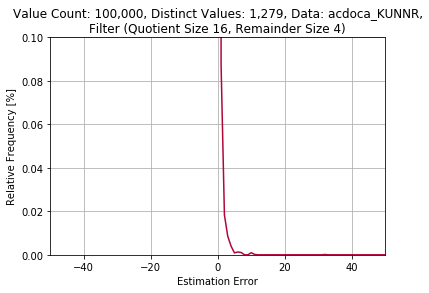

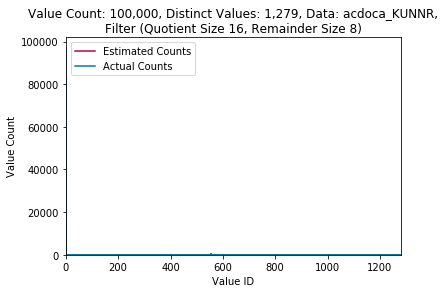

max error: 0
max relative error: 0%
Estimation Technique: filter_16_8
Sample Size: 30000000
Mean Error: 0.000132766666667
Mean Squared Error: 0.0004381
Column Size [kB](uint16_t): 200.0



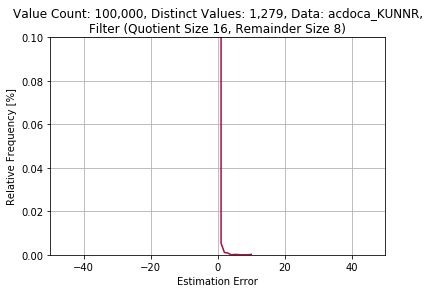

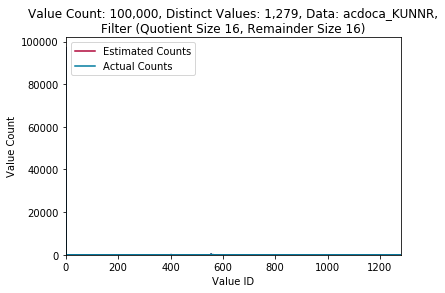

max error: 0
max relative error: 0%
Estimation Technique: filter_16_16
Sample Size: 30000000
Mean Error: 3e-06
Mean Squared Error: 3e-06
Column Size [kB](uint16_t): 200.0



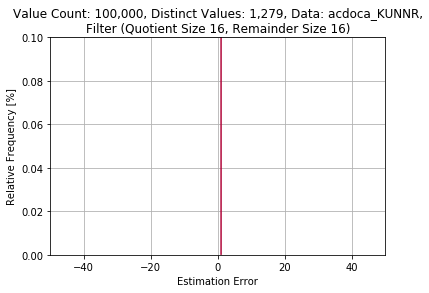

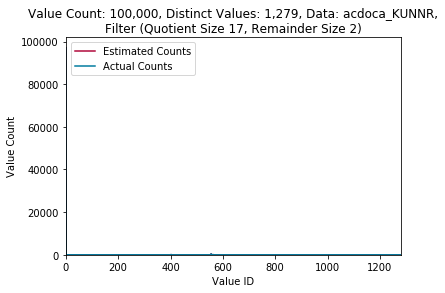

max error: 2
max relative error: 200.0%
Estimation Technique: filter_17_2
Sample Size: 30000000
Mean Error: 0.0059051
Mean Squared Error: 0.905300433333
Column Size [kB](uint16_t): 200.0



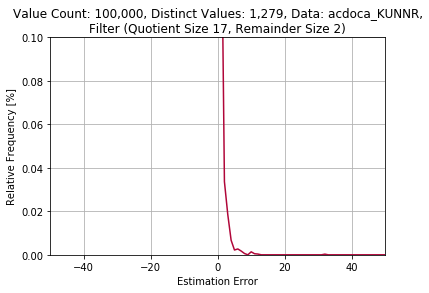

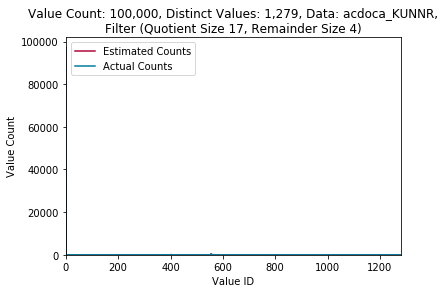

max error: 0
max relative error: 0%
Estimation Technique: filter_17_4
Sample Size: 30000000
Mean Error: 0.00157163333333
Mean Squared Error: 0.2810191
Column Size [kB](uint16_t): 200.0



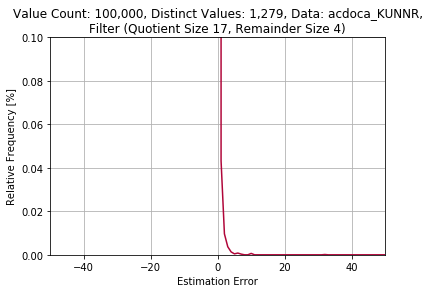

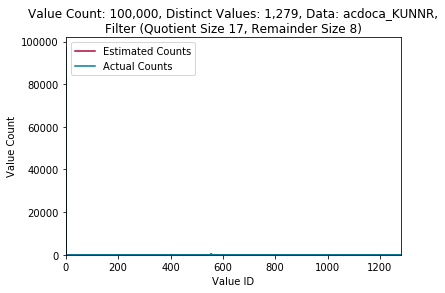

max error: 0
max relative error: 0%
Estimation Technique: filter_17_8
Sample Size: 30000000
Mean Error: 7.62e-05
Mean Squared Error: 0.000281466666667
Column Size [kB](uint16_t): 200.0



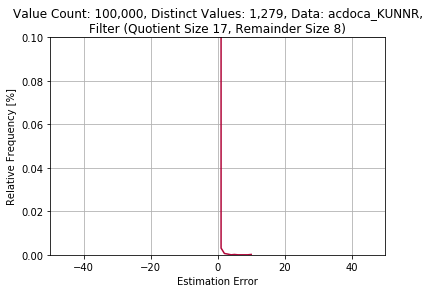

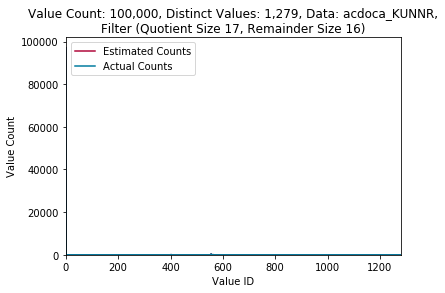

max error: 0
max relative error: 0%
Estimation Technique: filter_17_16
Sample Size: 30000000
Mean Error: 2.93333333333e-06
Mean Squared Error: 2.93333333333e-06
Column Size [kB](uint16_t): 200.0



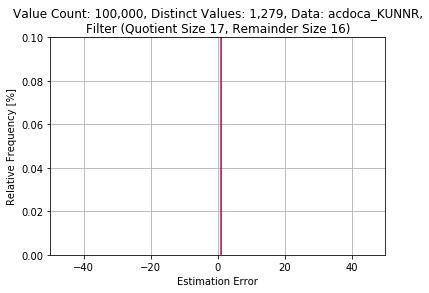

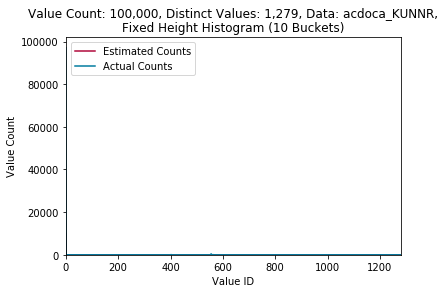

max error: 87100
max relative error: 600.0%
Estimation Technique: postgres1_10
Sample Size: 1279
Mean Error: 74.0922595778
Mean Squared Error: 5931743.1509
Column Size [kB](uint16_t): 200.0



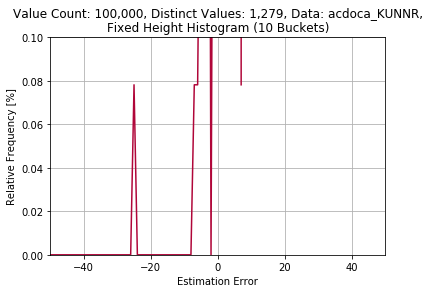

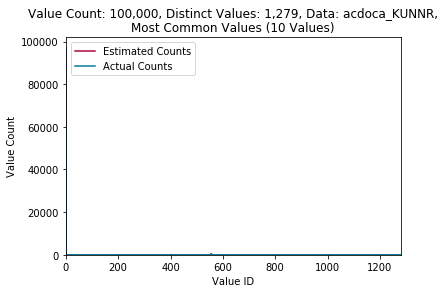

max error: 10
max relative error: 90.9090909091%
Estimation Technique: postgres2_10
Sample Size: 1279
Mean Error: 0.624706802189
Mean Squared Error: 2.33229085223
Column Size [kB](uint16_t): 200.0



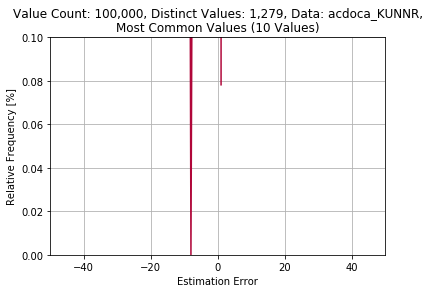

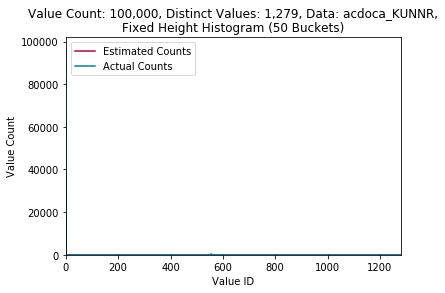

max error: 95100
max relative error: 200.0%
Estimation Technique: postgres1_50
Sample Size: 1279
Mean Error: 76.3940578577
Mean Squared Error: 7071362.08444
Column Size [kB](uint16_t): 200.0



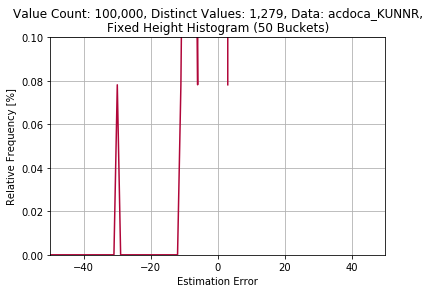

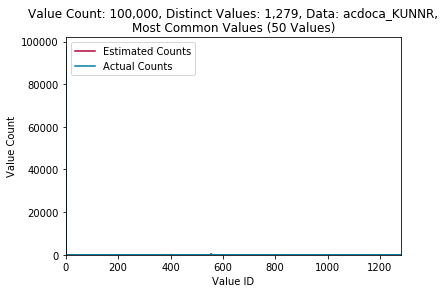

max error: 4
max relative error: 80.0%
Estimation Technique: postgres2_50
Sample Size: 1279
Mean Error: 0.419077404222
Mean Squared Error: 0.888193901486
Column Size [kB](uint16_t): 200.0



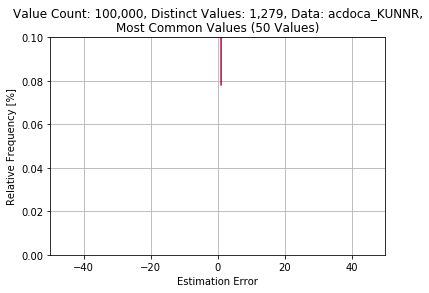

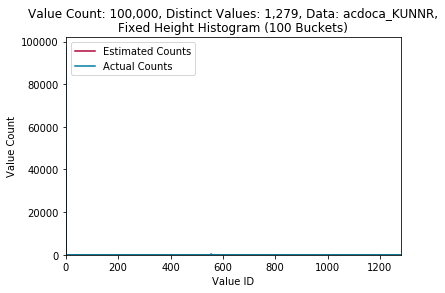

max error: 96100
max relative error: 300.0%
Estimation Technique: postgres1_100
Sample Size: 1279
Mean Error: 76.7427677873
Mean Squared Error: 7220851.78577
Column Size [kB](uint16_t): 200.0



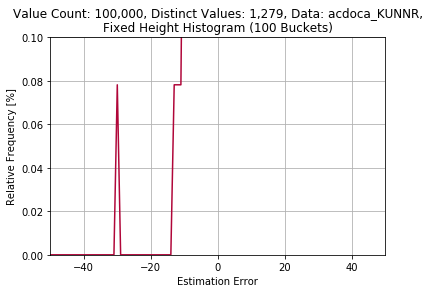

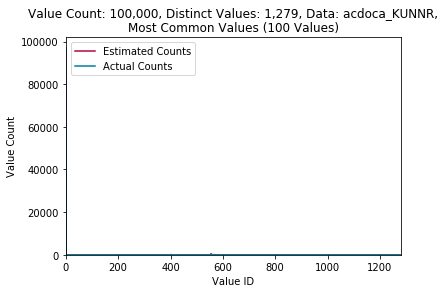

max error: 3
max relative error: 75.0%
Estimation Technique: postgres2_100
Sample Size: 1279
Mean Error: 0.290852228303
Mean Squared Error: 0.459734167318
Column Size [kB](uint16_t): 200.0



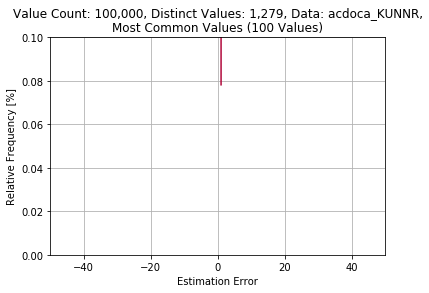

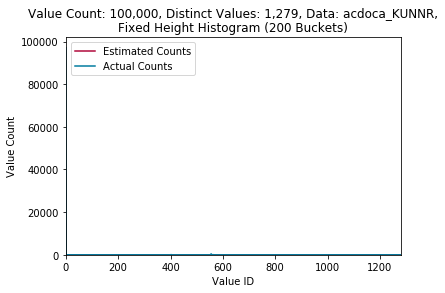

max error: 96600
max relative error: 600.0%
Estimation Technique: postgres1_200
Sample Size: 1279
Mean Error: 77.0961688819
Mean Squared Error: 7296182.7459
Column Size [kB](uint16_t): 200.0



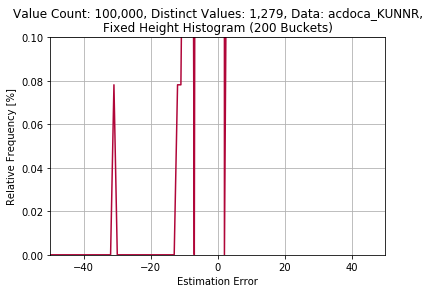

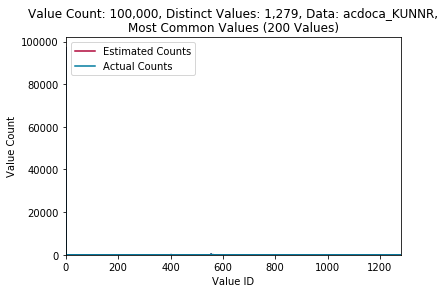

max error: 1
max relative error: 50.0%
Estimation Technique: postgres2_200
Sample Size: 1279
Mean Error: 0.134480062549
Mean Squared Error: 0.134480062549
Column Size [kB](uint16_t): 200.0



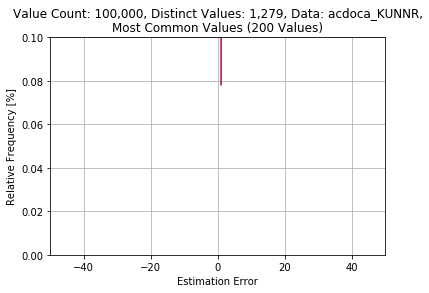

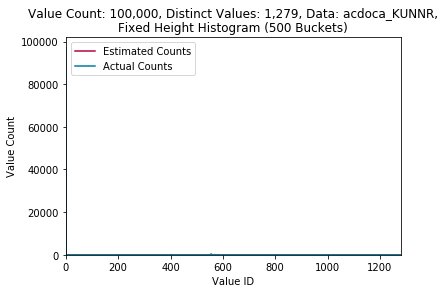

max error: 96900
max relative error: 400.0%
Estimation Technique: postgres1_500
Sample Size: 1279
Mean Error: 77.2071931196
Mean Squared Error: 7341569.99218
Column Size [kB](uint16_t): 200.0



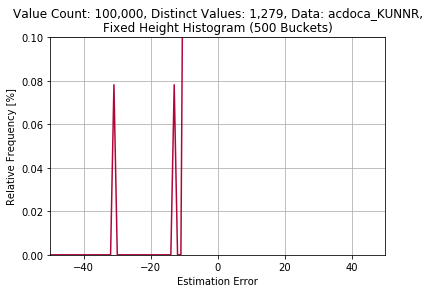

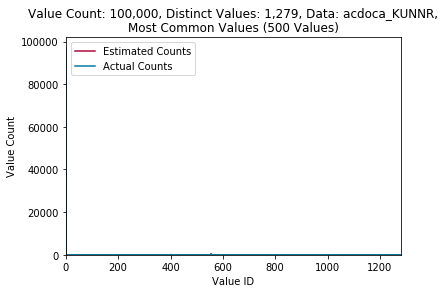

max error: 1
max relative error: 100.0%
Estimation Technique: postgres2_500
Sample Size: 1279
Mean Error: 0.608287724785
Mean Squared Error: 0.608287724785
Column Size [kB](uint16_t): 200.0



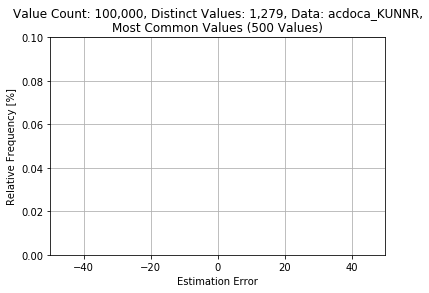

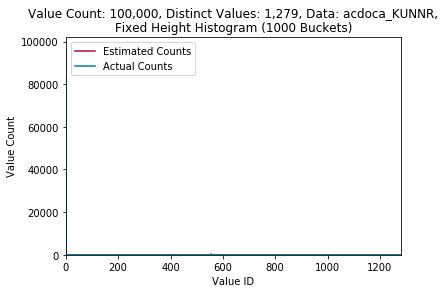

max error: 97000
max relative error: 1300.0%
Estimation Technique: postgres1_1000
Sample Size: 1279
Mean Error: 77.2314308053
Mean Squared Error: 7356729.88819
Column Size [kB](uint16_t): 200.0



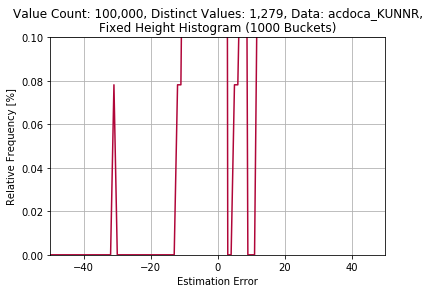

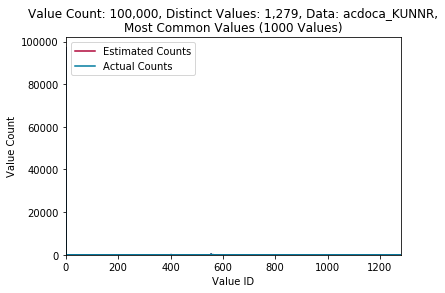

max error: 1
max relative error: 100.0%
Estimation Technique: postgres2_1000
Sample Size: 1279
Mean Error: 0.217357310399
Mean Squared Error: 0.217357310399
Column Size [kB](uint16_t): 200.0



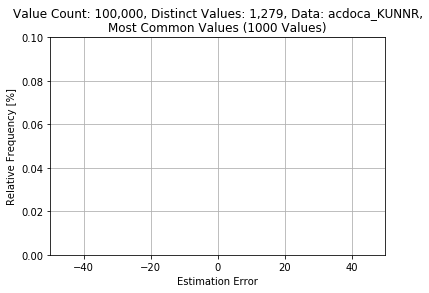

,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,Uniform Estimation,4.0,6981.857143,7.362731e+07
1,Fixed Height Histogram (10 Buckets),40.0,4733.428571,5.215630e+07
2,Fixed Height Histogram (50 Buckets),200.0,5817.142857,9.886502e+07
3,Fixed Height Histogram (100 Buckets),400.0,6356.000000,1.101364e+08
4,Most Common Values (10 Values),40.0,75.142857,2.124957e+04
5,Most Common Values (50 Values),200.0,7031.285714,1.230663e+08
6,Most Common Values (100 Values),400.0,7031.285714,1.230663e+08
7,"Filter (Quotient Size 12, Remainder Size 2)",2048.0,5.601346,7.133943e+04
8,"Filter (Quotient Size 12, Remainder Size 4)",3072.0,2.394525,2.273188e+04
9,"Filter (Quotient Size 12, Remainder Size 8)",5120.0,0.000000,0.000000e+00


,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,"Filter (Quotient Size 12, Remainder Size 2)",2048.0,5.601346,71339.426108
1,"Filter (Quotient Size 12, Remainder Size 4)",3072.0,2.394525,22731.883540
2,"Filter (Quotient Size 12, Remainder Size 8)",5120.0,0.000000,0.000000
3,"Filter (Quotient Size 12, Remainder Size 16)",9216.0,0.000000,0.000000
4,"Filter (Quotient Size 13, Remainder Size 2)",4096.0,5.659186,72455.305052
5,"Filter (Quotient Size 13, Remainder Size 4)",6144.0,0.793921,4274.828283
6,"Filter (Quotient Size 13, Remainder Size 8)",10240.0,0.000000,0.000000
7,"Filter (Quotient Size 13, Remainder Size 16)",18432.0,0.000000,0.000000
8,"Filter (Quotient Size 14, Remainder Size 2)",8192.0,2.436284,23219.347526
9,"Filter (Quotient Size 14, Remainder Size 4)",12288.0,0.000000,0.000000


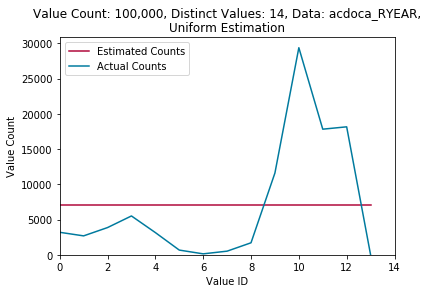

max error: 22361
max relative error: 5108.14814815%
Estimation Technique: uniform
Sample Size: 14
Mean Error: 6981.85714286
Mean Squared Error: 73627307.7143
Column Size [kB](uint16_t): 200.0



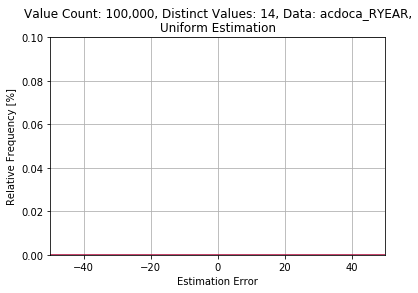

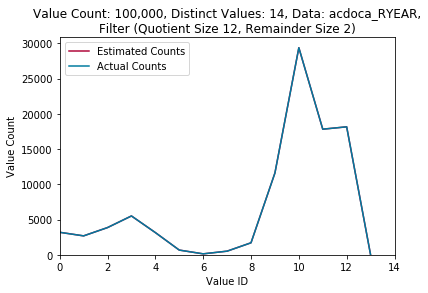

max error: 0
max relative error: 0%
Estimation Technique: filter_12_2
Sample Size: 30000000
Mean Error: 5.60134573333
Mean Squared Error: 71339.4261083
Column Size [kB](uint16_t): 200.0



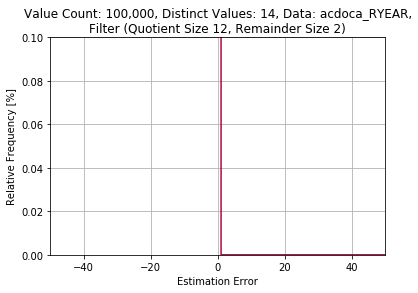

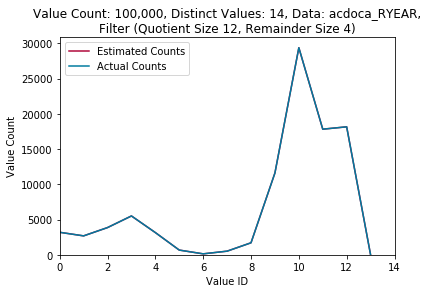

max error: 0
max relative error: 0%
Estimation Technique: filter_12_4
Sample Size: 30000000
Mean Error: 2.39452546667
Mean Squared Error: 22731.8835397
Column Size [kB](uint16_t): 200.0



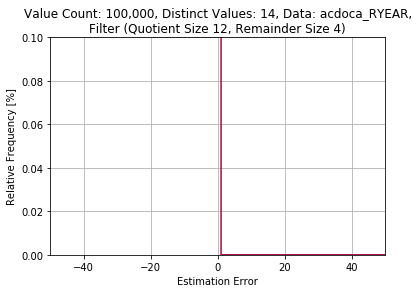

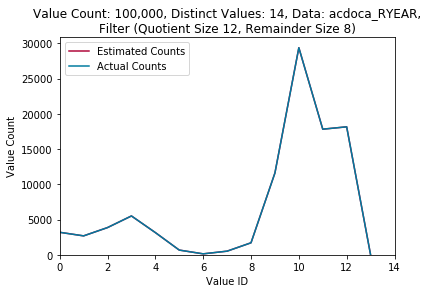

max error: 0
max relative error: 0%
Estimation Technique: filter_12_8
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



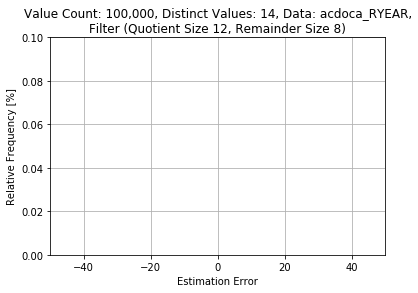

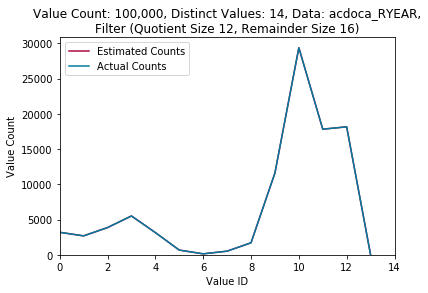

max error: 0
max relative error: 0%
Estimation Technique: filter_12_16
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



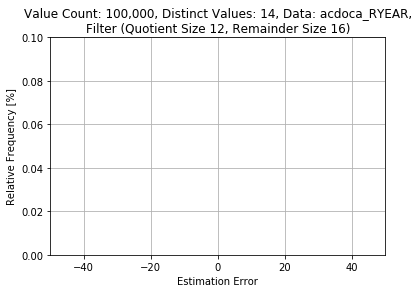

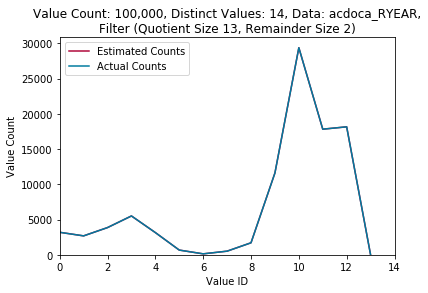

max error: 0
max relative error: 0%
Estimation Technique: filter_13_2
Sample Size: 30000000
Mean Error: 5.65918633333
Mean Squared Error: 72455.3050517
Column Size [kB](uint16_t): 200.0



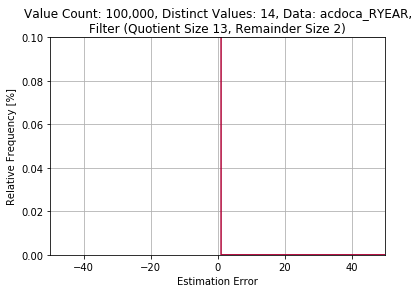

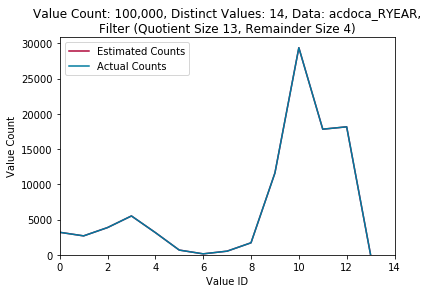

max error: 0
max relative error: 0%
Estimation Technique: filter_13_4
Sample Size: 30000000
Mean Error: 0.793920533333
Mean Squared Error: 4274.82828327
Column Size [kB](uint16_t): 200.0



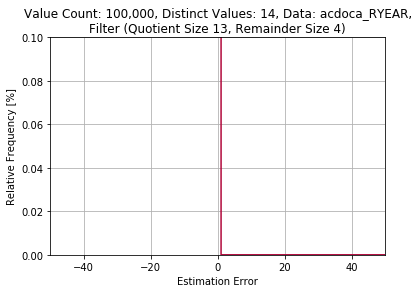

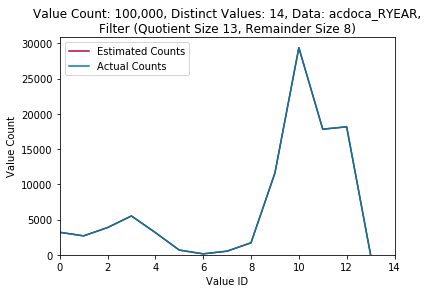

max error: 0
max relative error: 0%
Estimation Technique: filter_13_8
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



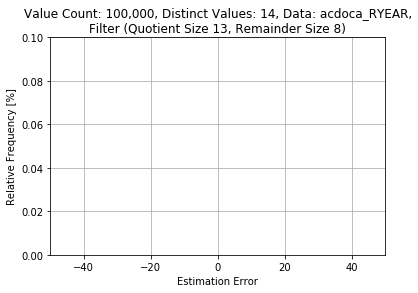

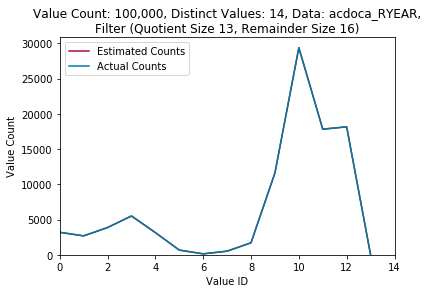

max error: 0
max relative error: 0%
Estimation Technique: filter_13_16
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



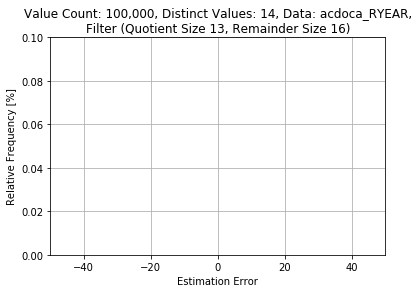

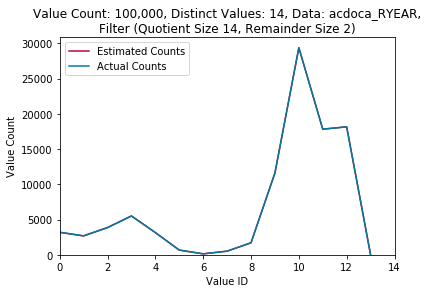

max error: 0
max relative error: 0%
Estimation Technique: filter_14_2
Sample Size: 30000000
Mean Error: 2.4362836
Mean Squared Error: 23219.3475258
Column Size [kB](uint16_t): 200.0



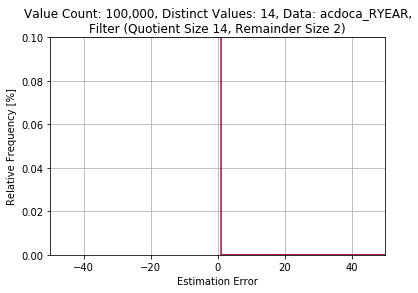

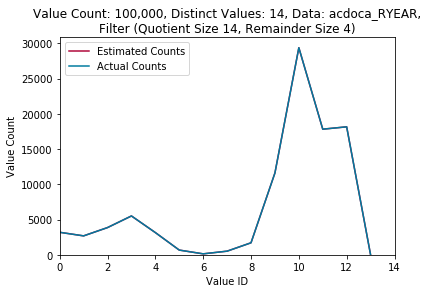

max error: 0
max relative error: 0%
Estimation Technique: filter_14_4
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



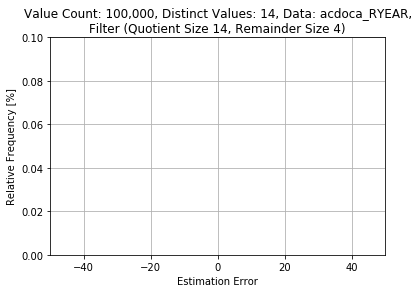

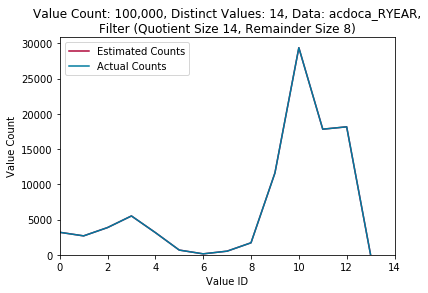

max error: 0
max relative error: 0%
Estimation Technique: filter_14_8
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



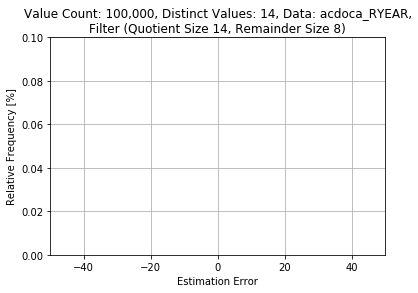

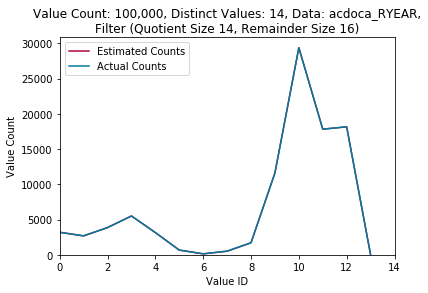

max error: 0
max relative error: 0%
Estimation Technique: filter_14_16
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



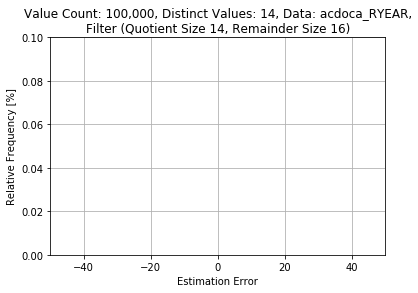

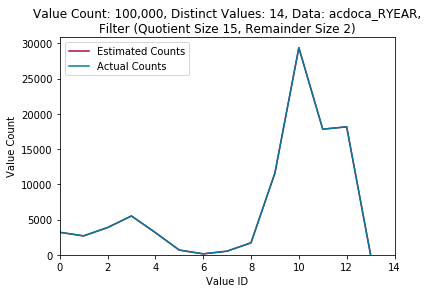

max error: 0
max relative error: 0%
Estimation Technique: filter_15_2
Sample Size: 30000000
Mean Error: 0.796368
Mean Squared Error: 4288.006554
Column Size [kB](uint16_t): 200.0



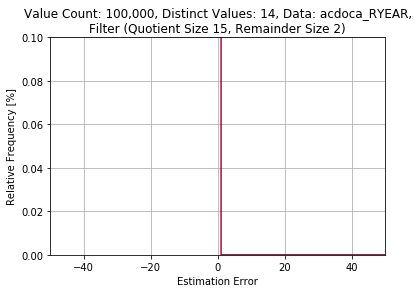

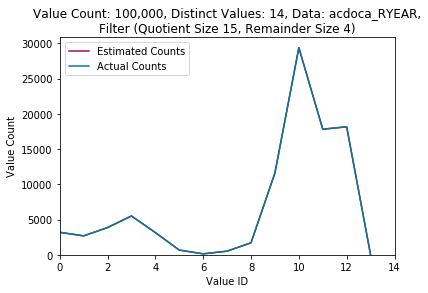

max error: 0
max relative error: 0%
Estimation Technique: filter_15_4
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



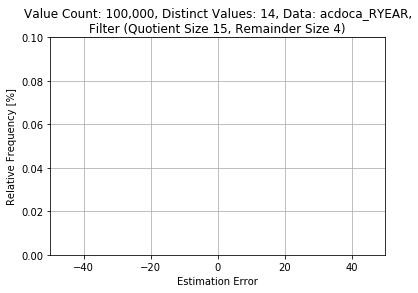

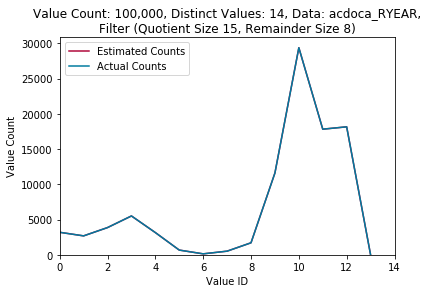

max error: 0
max relative error: 0%
Estimation Technique: filter_15_8
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



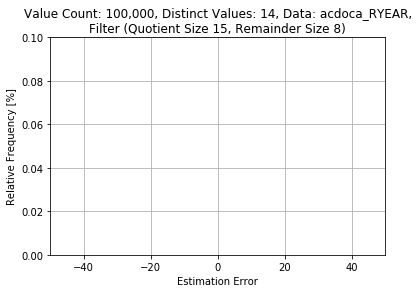

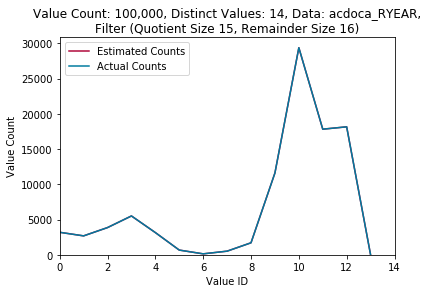

max error: 0
max relative error: 0%
Estimation Technique: filter_15_16
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



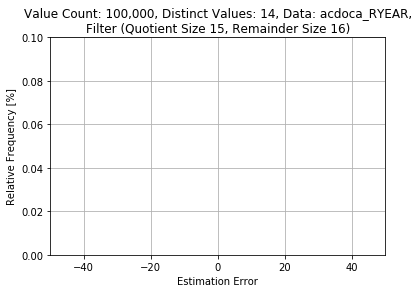

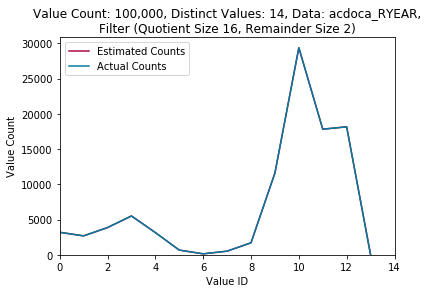

max error: 0
max relative error: 0%
Estimation Technique: filter_16_2
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



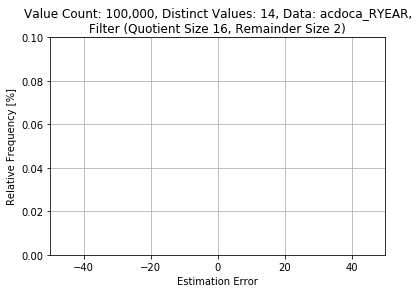

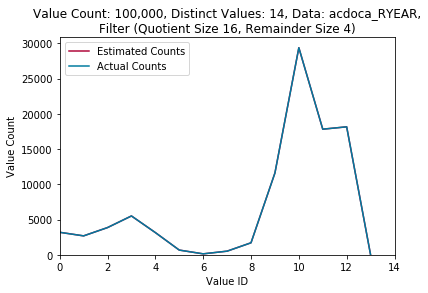

max error: 0
max relative error: 0%
Estimation Technique: filter_16_4
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



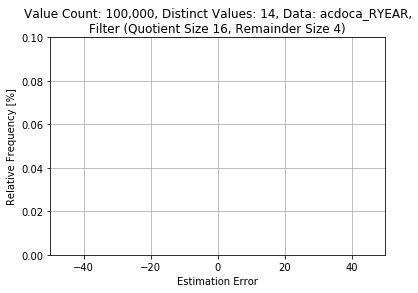

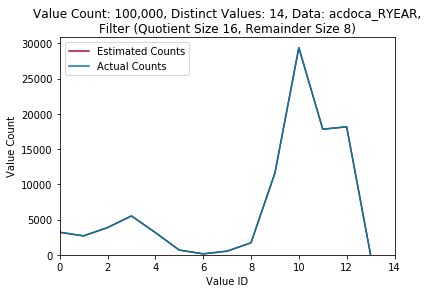

max error: 0
max relative error: 0%
Estimation Technique: filter_16_8
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



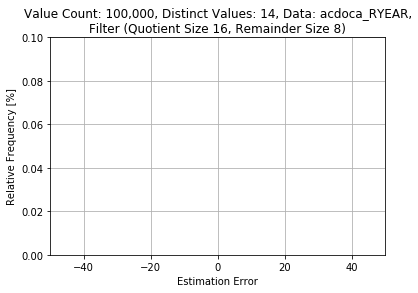

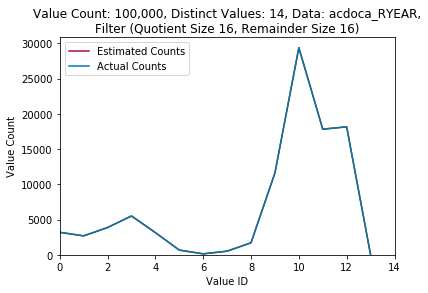

max error: 0
max relative error: 0%
Estimation Technique: filter_16_16
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



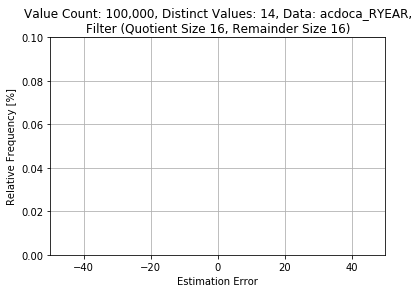

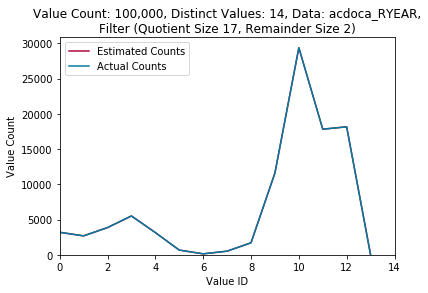

max error: 0
max relative error: 0%
Estimation Technique: filter_17_2
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



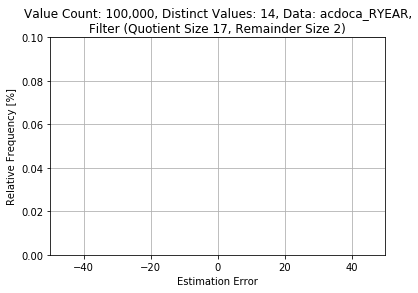

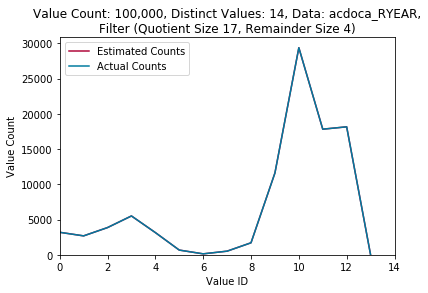

max error: 0
max relative error: 0%
Estimation Technique: filter_17_4
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



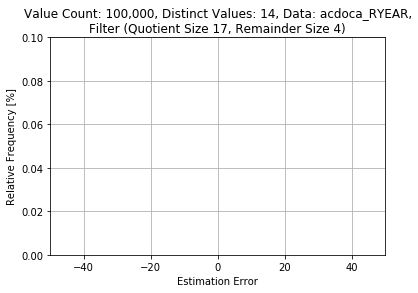

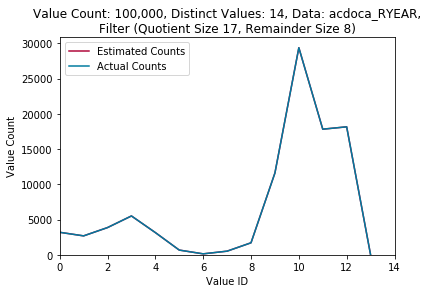

max error: 0
max relative error: 0%
Estimation Technique: filter_17_8
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



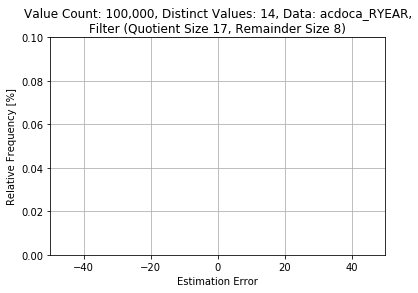

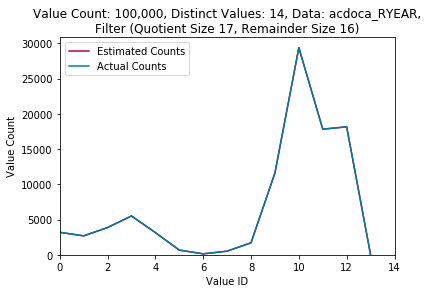

max error: 0
max relative error: 0%
Estimation Technique: filter_17_16
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



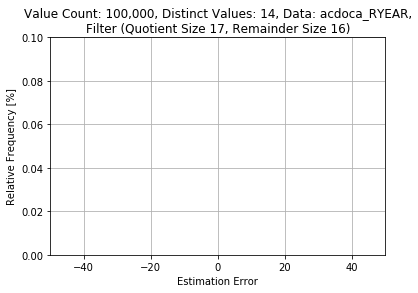

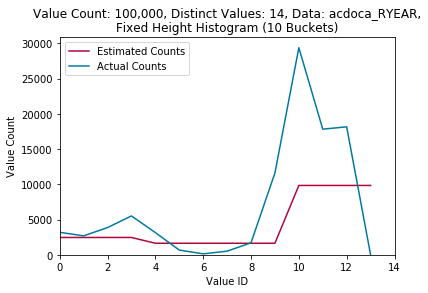

max error: 19549
max relative error: 1114.81481481%
Estimation Technique: postgres1_10
Sample Size: 14
Mean Error: 4733.42857143
Mean Squared Error: 52156295.0
Column Size [kB](uint16_t): 200.0



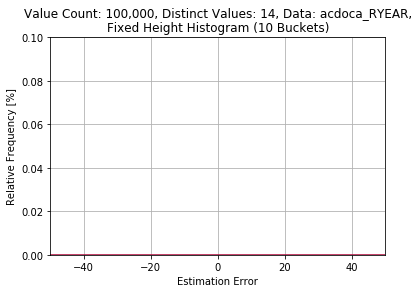

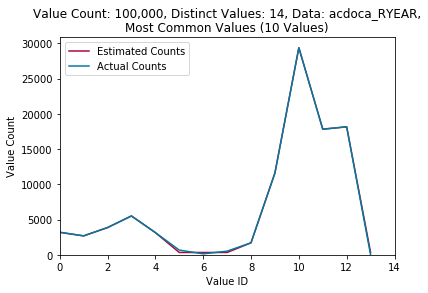

max error: 340
max relative error: 144.444444444%
Estimation Technique: postgres2_10
Sample Size: 14
Mean Error: 75.1428571429
Mean Squared Error: 21249.5714286
Column Size [kB](uint16_t): 200.0



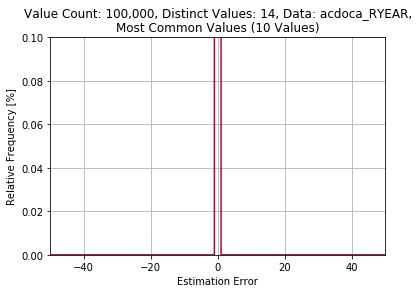

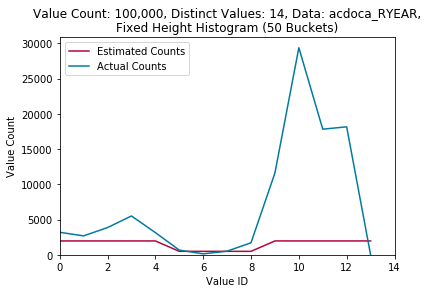

max error: 27424
max relative error: 264.444444444%
Estimation Technique: postgres1_50
Sample Size: 14
Mean Error: 5817.14285714
Mean Squared Error: 98865017.2857
Column Size [kB](uint16_t): 200.0



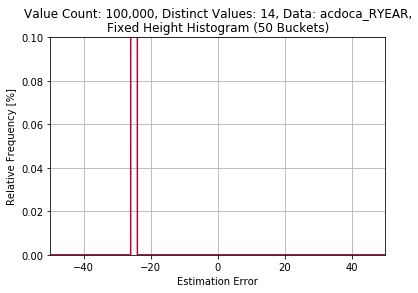

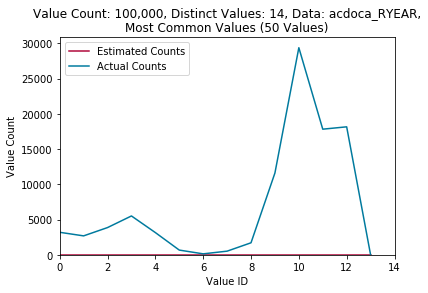

max error: 29392
max relative error: 100.0%
Estimation Technique: postgres2_50
Sample Size: 14
Mean Error: 7031.28571429
Mean Squared Error: 123066286.429
Column Size [kB](uint16_t): 200.0



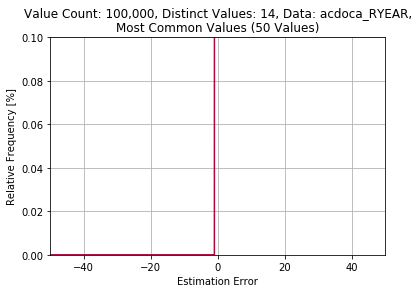

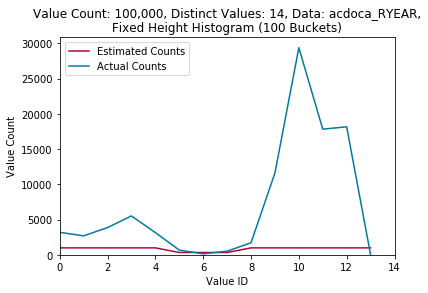

max error: 28408
max relative error: 142.962962963%
Estimation Technique: postgres1_100
Sample Size: 14
Mean Error: 6356.0
Mean Squared Error: 110136432.714
Column Size [kB](uint16_t): 200.0



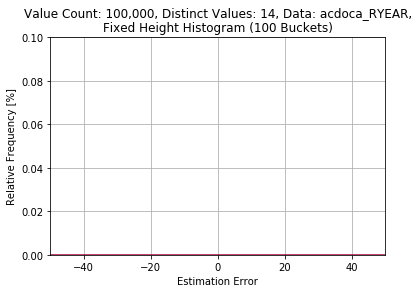

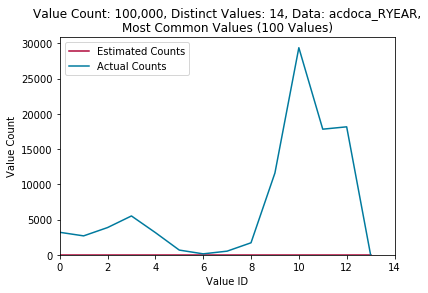

max error: 29392
max relative error: 100.0%
Estimation Technique: postgres2_100
Sample Size: 14
Mean Error: 7031.28571429
Mean Squared Error: 123066286.429
Column Size [kB](uint16_t): 200.0



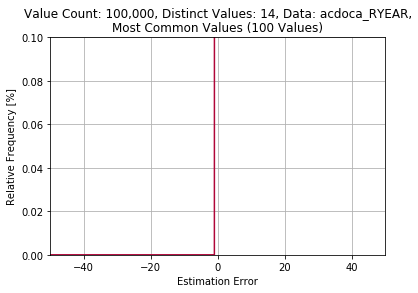

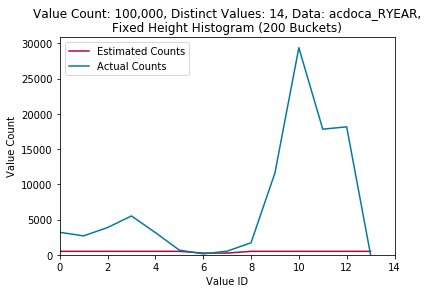

max error: 28900
max relative error: 98.3260751225%
Estimation Technique: postgres1_200
Sample Size: 14
Mean Error: 6660.57142857
Mean Squared Error: 116386543.0
Column Size [kB](uint16_t): 200.0



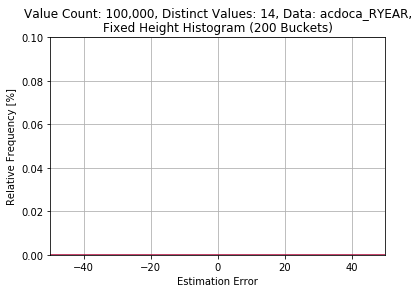

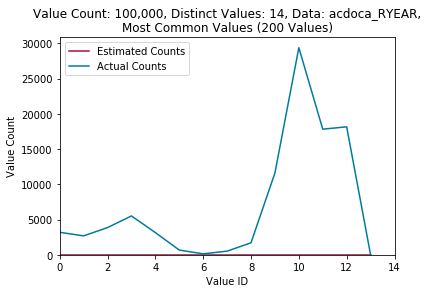

max error: 29392
max relative error: 100.0%
Estimation Technique: postgres2_200
Sample Size: 14
Mean Error: 7031.28571429
Mean Squared Error: 123066286.429
Column Size [kB](uint16_t): 200.0



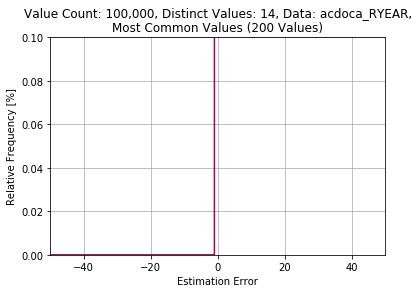

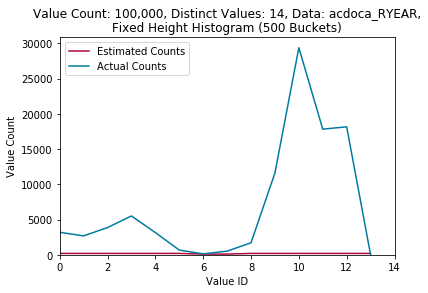

max error: 29196
max relative error: 99.3331518781%
Estimation Technique: postgres1_500
Sample Size: 14
Mean Error: 6877.28571429
Mean Squared Error: 120353450.429
Column Size [kB](uint16_t): 200.0



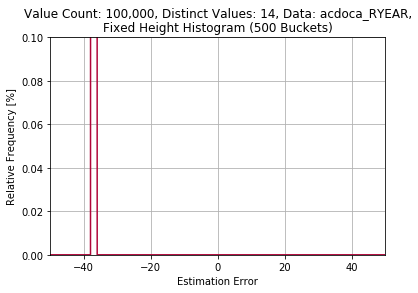

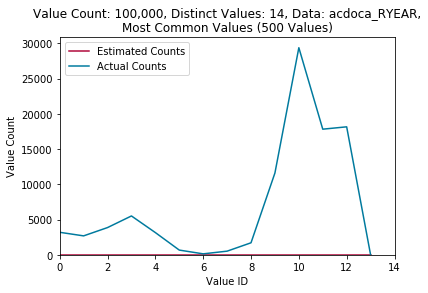

max error: 29392
max relative error: 100.0%
Estimation Technique: postgres2_500
Sample Size: 14
Mean Error: 7031.28571429
Mean Squared Error: 123066286.429
Column Size [kB](uint16_t): 200.0



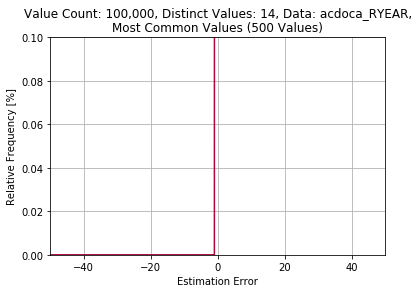

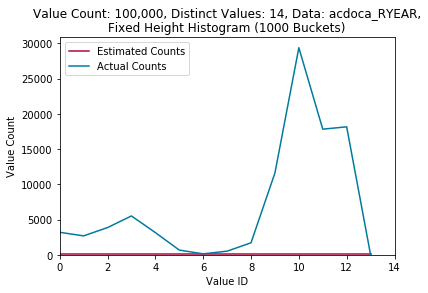

max error: 29294
max relative error: 99.666575939%
Estimation Technique: postgres1_1000
Sample Size: 14
Mean Error: 6947.28571429
Mean Squared Error: 121697758.429
Column Size [kB](uint16_t): 200.0



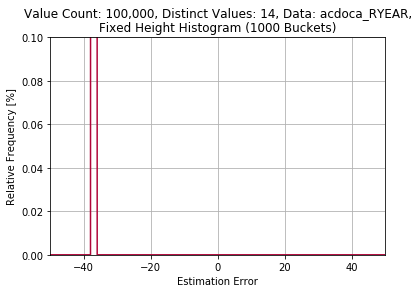

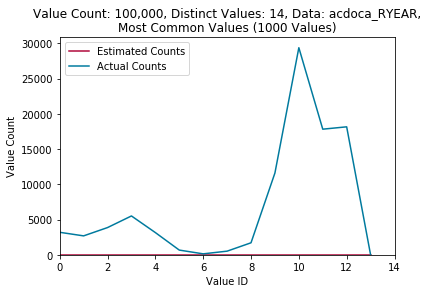

max error: 29392
max relative error: 100.0%
Estimation Technique: postgres2_1000
Sample Size: 14
Mean Error: 7031.28571429
Mean Squared Error: 123066286.429
Column Size [kB](uint16_t): 200.0



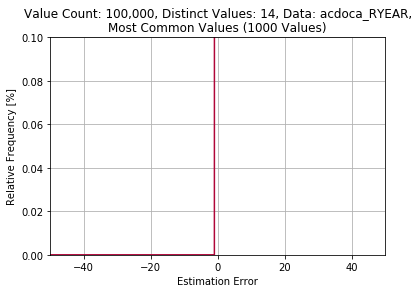

,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,Uniform Estimation,4.0,778.231373,3.877694e+07
1,Fixed Height Histogram (10 Buckets),40.0,388.941176,3.151040e+07
2,Fixed Height Histogram (50 Buckets),200.0,388.525490,3.738428e+07
3,Fixed Height Histogram (100 Buckets),400.0,388.721569,3.815396e+07
4,Most Common Values (10 Values),40.0,0.211765,3.843137e-01
5,Most Common Values (50 Values),200.0,0.800000,8.000000e-01
6,Most Common Values (100 Values),400.0,0.603922,6.039216e-01
7,"Filter (Quotient Size 12, Remainder Size 2)",2048.0,6.127934,6.082174e+05
8,"Filter (Quotient Size 12, Remainder Size 4)",3072.0,1.540559,1.528809e+05
9,"Filter (Quotient Size 12, Remainder Size 8)",5120.0,0.000342,1.263600e-03


,Estimation Technique,Memory Consumption [Byte],Mean Error,Mean Squared Error
0,"Filter (Quotient Size 12, Remainder Size 2)",2048.0,6.127934,608217.418225
1,"Filter (Quotient Size 12, Remainder Size 4)",3072.0,1.540559,152880.941849
2,"Filter (Quotient Size 12, Remainder Size 8)",5120.0,0.000342,0.001264
3,"Filter (Quotient Size 12, Remainder Size 16)",9216.0,0.000000,0.000000
4,"Filter (Quotient Size 13, Remainder Size 2)",4096.0,3.014348,299143.658115
5,"Filter (Quotient Size 13, Remainder Size 4)",6144.0,0.002452,0.007316
6,"Filter (Quotient Size 13, Remainder Size 8)",10240.0,0.000256,0.001157
7,"Filter (Quotient Size 13, Remainder Size 16)",18432.0,0.000000,0.000000
8,"Filter (Quotient Size 14, Remainder Size 2)",8192.0,1.557151,154535.497443
9,"Filter (Quotient Size 14, Remainder Size 4)",12288.0,0.001199,0.003875


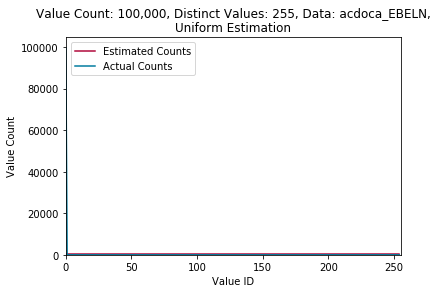

max error: 99244
max relative error: 39100.0%
Estimation Technique: uniform
Sample Size: 255
Mean Error: 778.231372549
Mean Squared Error: 38776935.6667
Column Size [kB](uint16_t): 200.0



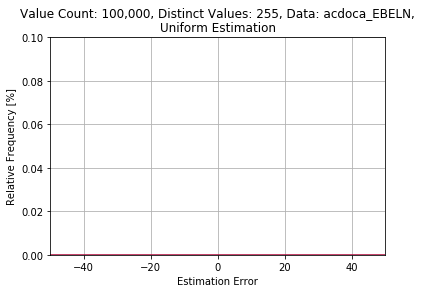

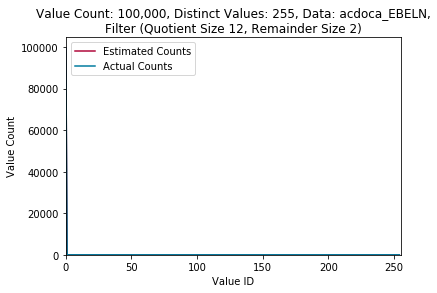

max error: 1
max relative error: 100.0%
Estimation Technique: filter_12_2
Sample Size: 30000000
Mean Error: 6.12793363333
Mean Squared Error: 608217.418225
Column Size [kB](uint16_t): 200.0



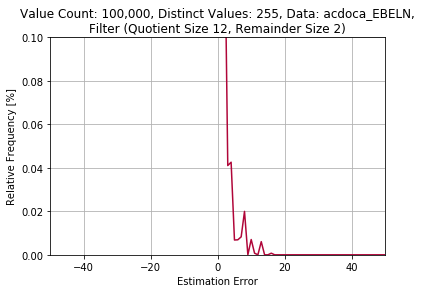

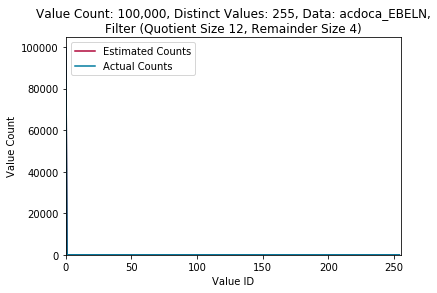

max error: 0
max relative error: 0%
Estimation Technique: filter_12_4
Sample Size: 30000000
Mean Error: 1.54055866667
Mean Squared Error: 152880.941849
Column Size [kB](uint16_t): 200.0



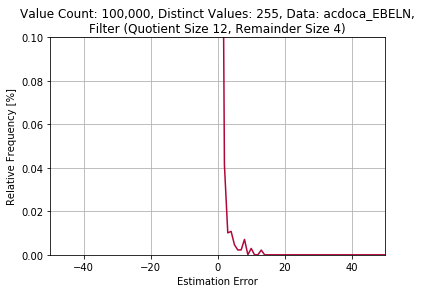

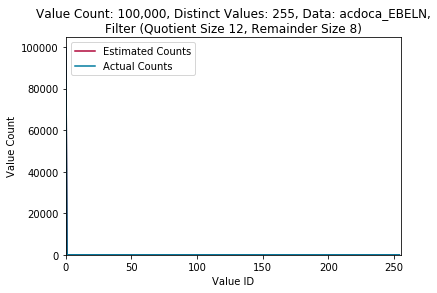

max error: 0
max relative error: 0%
Estimation Technique: filter_12_8
Sample Size: 30000000
Mean Error: 0.000342066666667
Mean Squared Error: 0.0012636
Column Size [kB](uint16_t): 200.0



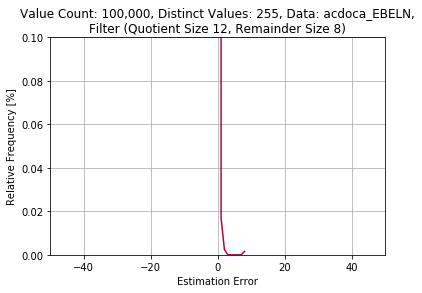

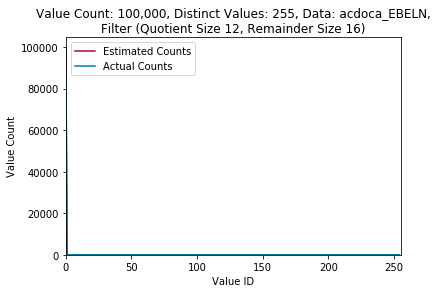

max error: 0
max relative error: 0%
Estimation Technique: filter_12_16
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



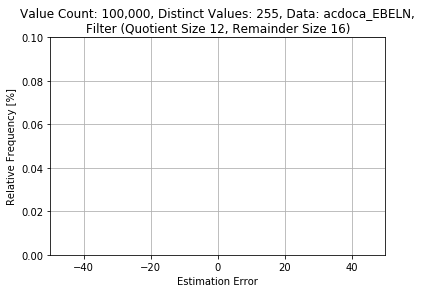

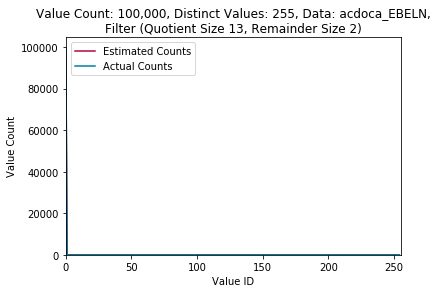

max error: 4
max relative error: 400.0%
Estimation Technique: filter_13_2
Sample Size: 30000000
Mean Error: 3.0143482
Mean Squared Error: 299143.658115
Column Size [kB](uint16_t): 200.0



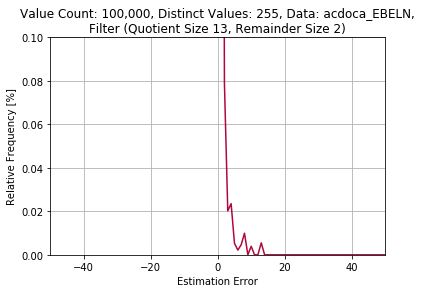

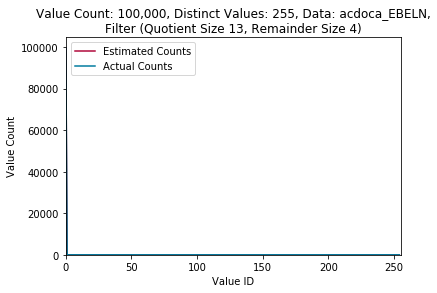

max error: 0
max relative error: 0%
Estimation Technique: filter_13_4
Sample Size: 30000000
Mean Error: 0.00245173333333
Mean Squared Error: 0.00731606666667
Column Size [kB](uint16_t): 200.0



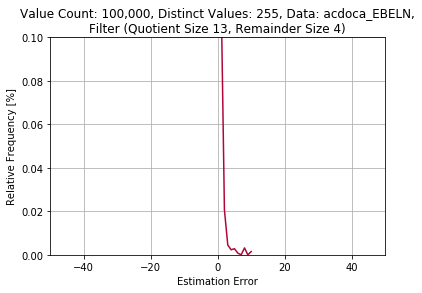

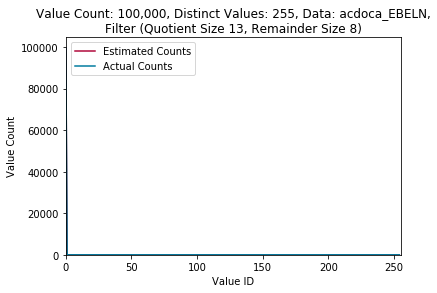

max error: 0
max relative error: 0%
Estimation Technique: filter_13_8
Sample Size: 30000000
Mean Error: 0.0002558
Mean Squared Error: 0.0011568
Column Size [kB](uint16_t): 200.0



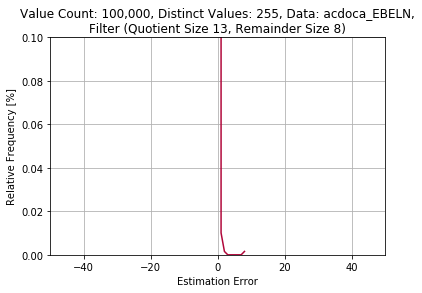

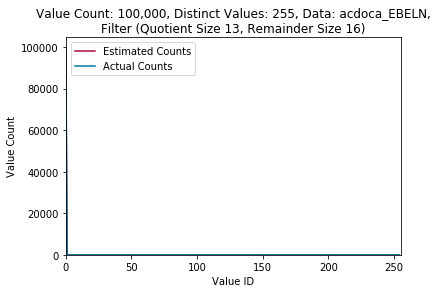

max error: 0
max relative error: 0%
Estimation Technique: filter_13_16
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



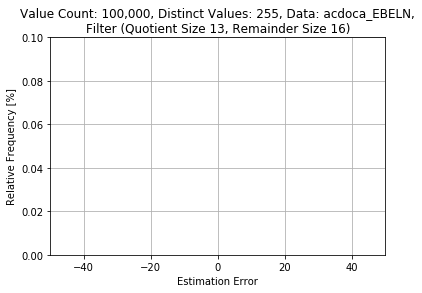

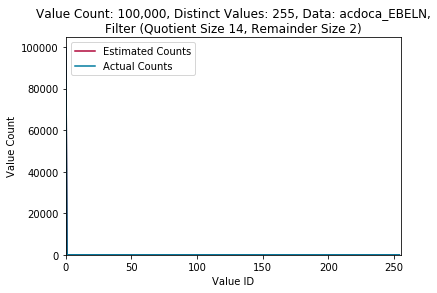

max error: 0
max relative error: 0%
Estimation Technique: filter_14_2
Sample Size: 30000000
Mean Error: 1.55715073333
Mean Squared Error: 154535.497443
Column Size [kB](uint16_t): 200.0



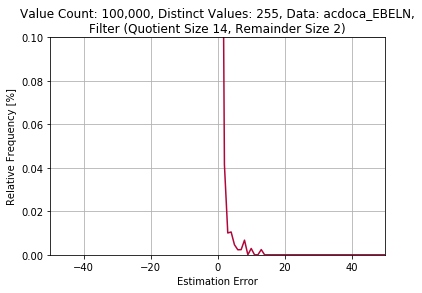

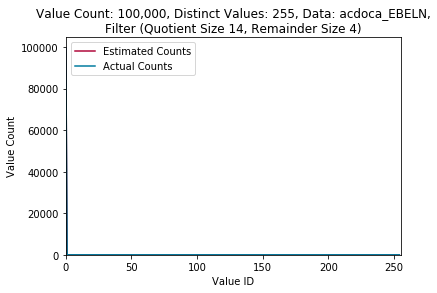

max error: 0
max relative error: 0%
Estimation Technique: filter_14_4
Sample Size: 30000000
Mean Error: 0.0011987
Mean Squared Error: 0.0038749
Column Size [kB](uint16_t): 200.0



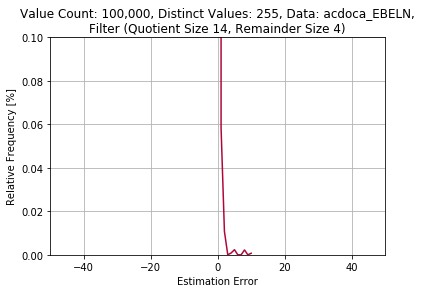

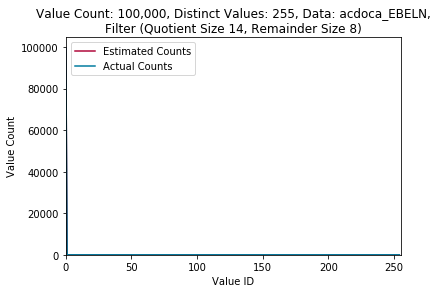

max error: 0
max relative error: 0%
Estimation Technique: filter_14_8
Sample Size: 30000000
Mean Error: 6.39333333333e-05
Mean Squared Error: 7.96e-05
Column Size [kB](uint16_t): 200.0



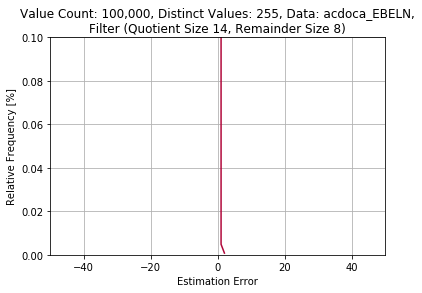

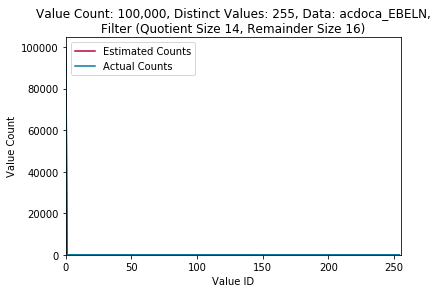

max error: 0
max relative error: 0%
Estimation Technique: filter_14_16
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



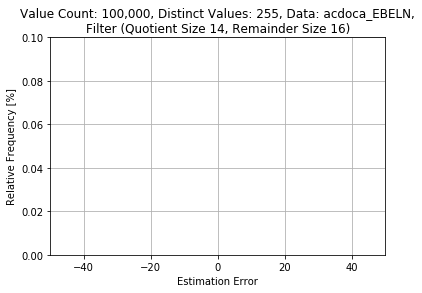

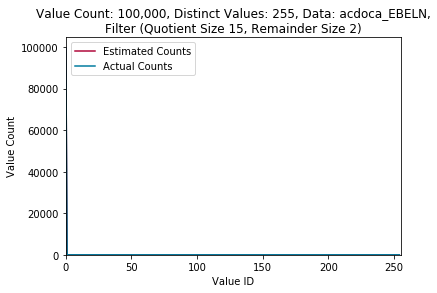

max error: 0
max relative error: 0%
Estimation Technique: filter_15_2
Sample Size: 30000000
Mean Error: 0.00244413333333
Mean Squared Error: 0.00733246666667
Column Size [kB](uint16_t): 200.0



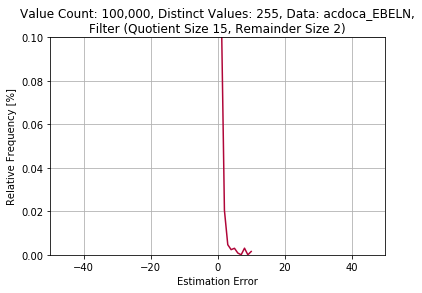

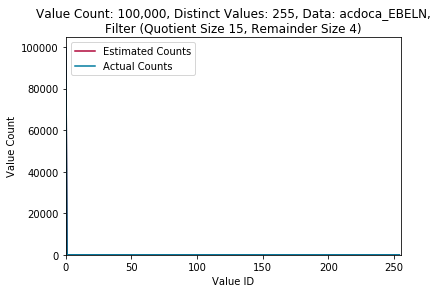

max error: 0
max relative error: 0%
Estimation Technique: filter_15_4
Sample Size: 30000000
Mean Error: 0.000741233333333
Mean Squared Error: 0.00237736666667
Column Size [kB](uint16_t): 200.0



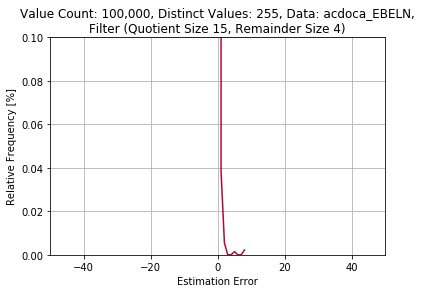

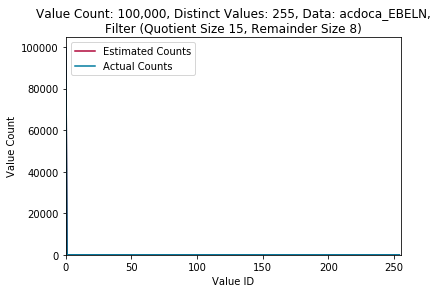

max error: 0
max relative error: 0%
Estimation Technique: filter_15_8
Sample Size: 30000000
Mean Error: 3.72e-05
Mean Squared Error: 5.26666666667e-05
Column Size [kB](uint16_t): 200.0



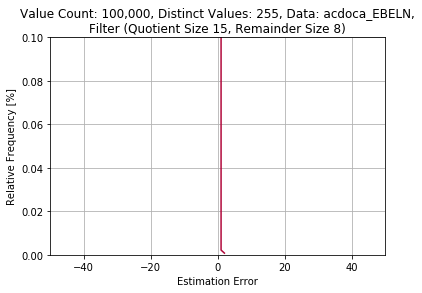

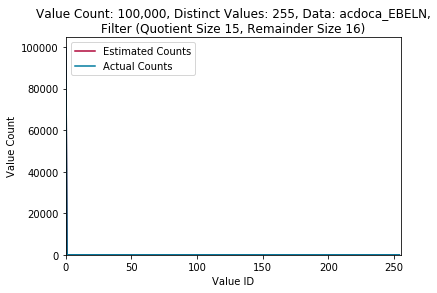

max error: 0
max relative error: 0%
Estimation Technique: filter_15_16
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



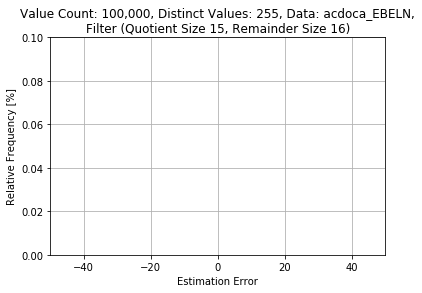

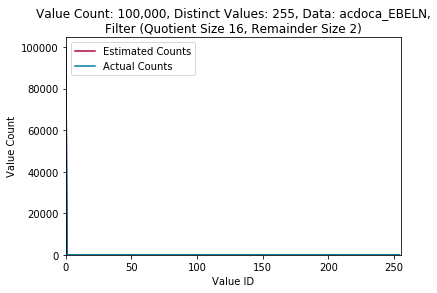

max error: 0
max relative error: 0%
Estimation Technique: filter_16_2
Sample Size: 30000000
Mean Error: 0.0012055
Mean Squared Error: 0.00401963333333
Column Size [kB](uint16_t): 200.0



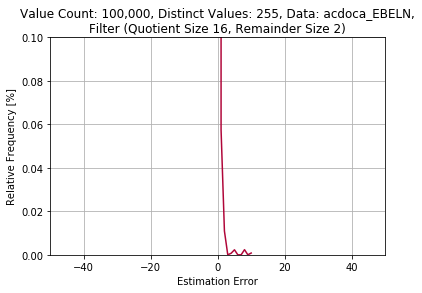

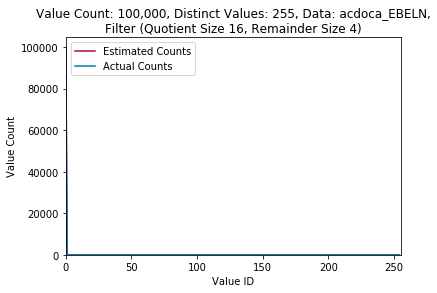

max error: 0
max relative error: 0%
Estimation Technique: filter_16_4
Sample Size: 30000000
Mean Error: 0.0003451
Mean Squared Error: 0.0012971
Column Size [kB](uint16_t): 200.0



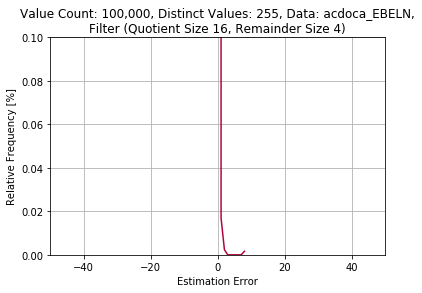

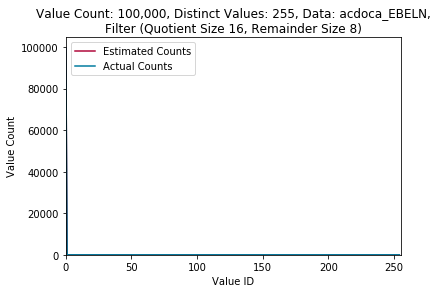

max error: 0
max relative error: 0%
Estimation Technique: filter_16_8
Sample Size: 30000000
Mean Error: 1.46666666667e-05
Mean Squared Error: 1.46666666667e-05
Column Size [kB](uint16_t): 200.0



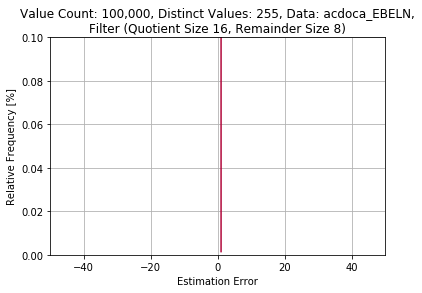

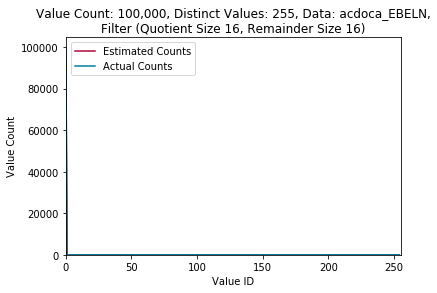

max error: 0
max relative error: 0%
Estimation Technique: filter_16_16
Sample Size: 30000000
Mean Error: 0.0
Mean Squared Error: 0.0
Column Size [kB](uint16_t): 200.0



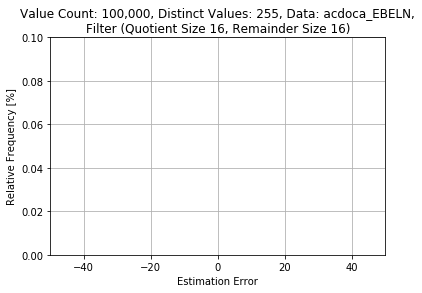

KeyboardInterrupt: 

In [6]:
# Generate all plots
example_data = get_results("estimation_examples")
data_names = ["normal", "normal_shuffled", "zipf", "zipf_shuffled", "uniform"]
distinct_values = 3000
row_count = 100000
remainder_sizes = [2, 4, 8, 16]
quotient_sizes = [12, 13, 14, 15, 16, 17]
granularities = [10, 50, 100, 200, 500, 1000]

for data_name in data_names:
    complete_estimation_table(data_name, row_count, distinct_values)
    filter_estimation_table(data_name, row_count, distinct_values)

    estimation_example(example_data, data_name, row_count, distinct_values, "uniform")
    estimation_evaluation(data_name, row_count, distinct_values, "uniform")

    for estimation_tec in filter_names(quotient_sizes, remainder_sizes):
        estimation_example(example_data, data_name, row_count, distinct_values, estimation_tec)  
        estimation_evaluation(data_name, row_count, distinct_values, estimation_tec)

    for granularity in granularities:
        estimation_example(example_data, data_name, row_count, distinct_values, "postgres1_" + str(granularity))  
        estimation_evaluation(data_name, row_count, distinct_values, "postgres1_" + str(granularity))
        estimation_example(example_data, data_name, row_count, distinct_values, "postgres2_" + str(granularity))  
        estimation_evaluation(data_name, row_count, distinct_values, "postgres2_" + str(granularity))

# Acdoca
column_names =  ["BELNR", "RBUKRS", "KUNNR", "RYEAR", "EBELN", "BUZEI"]
row_count = 100000
remainder_sizes = [2, 4, 8, 16]
quotient_sizes = [12, 13, 14, 15, 16, 17]
granularities = [10, 50, 100, 200, 500, 1000]

for column_name in column_names:
    data_name = "acdoca_" + column_name
    data = get_results("estimation")
    distinct_values = data[(data.data_name == data_name)]["distinct_values"].iloc[0]
    complete_estimation_table(data_name, row_count, distinct_values)
    filter_estimation_table(data_name, row_count, distinct_values)

    estimation_example(example_data, data_name, row_count, distinct_values, "uniform")
    estimation_evaluation(data_name, row_count, distinct_values, "uniform")

    for estimation_tec in filter_names(quotient_sizes, remainder_sizes):
        estimation_example(example_data, data_name, row_count, distinct_values, estimation_tec)  
        estimation_evaluation(data_name, row_count, distinct_values, estimation_tec)

    for granularity in granularities:
        estimation_example(example_data, data_name, row_count, distinct_values, "postgres1_" + str(granularity))  
        estimation_evaluation(data_name, row_count, distinct_values, "postgres1_" + str(granularity))
        estimation_example(example_data, data_name, row_count, distinct_values, "postgres2_" + str(granularity))  
        estimation_evaluation(data_name, row_count, distinct_values, "postgres2_" + str(granularity))  